In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/data.pkl
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/version
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/byteorder
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/.data/serialization_id
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/data/437
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/data/515
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/data/248
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/data/625
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/data/7
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/data/135
/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model/data/47
/kaggle/input/efficie

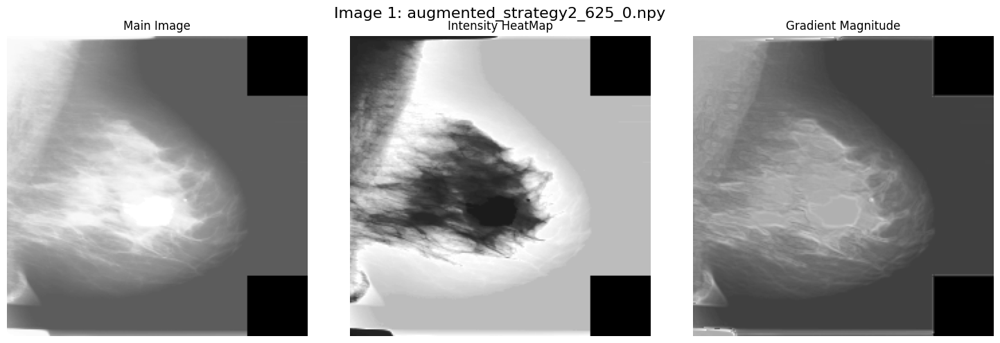

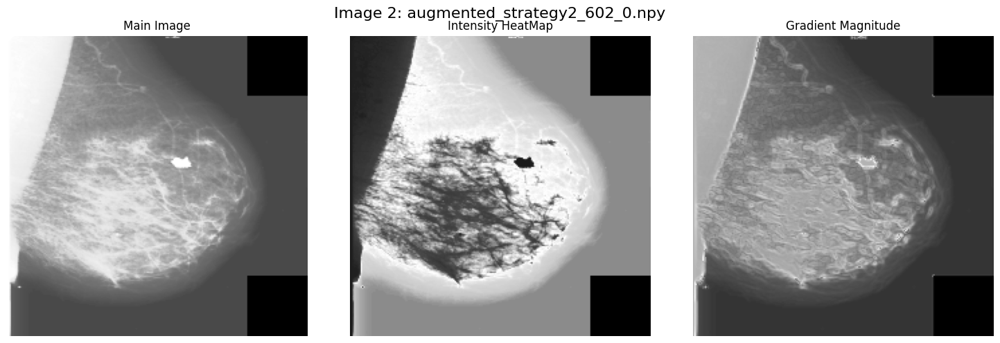

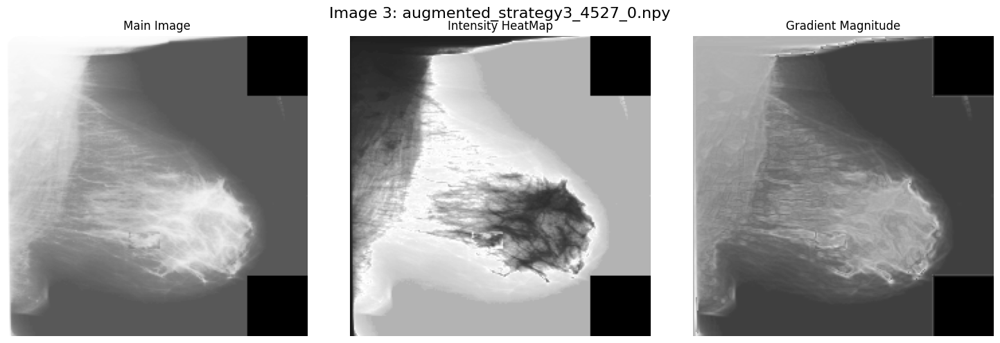

In [3]:
import numpy as np
import os
import matplotlib.pyplot as plt

# Example paths (replace with actual paths if running locally or on Kaggle)
dataset_path = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Benign"

# List all .npy files in the dataset
try:
    all_paths = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith('.npy')]

    # Visualize each image (limiting to 3 for demonstration purposes)
    for idx, image_path in enumerate(all_paths[:3]):  # Adjust number as needed
        # Load the preprocessed image
        image = np.load(image_path)

        # Extract channels
        if image.ndim == 3 and image.shape[-1] >= 3:  # Ensure valid shape
            main_image = image[:, :, 0]  # Main preprocessed image
            edges = image[:, :, 1]       # Edge-detected image
            gradient = image[:, :, 2]    # Gradient magnitude image

            # Plot the channels
            plt.figure(figsize=(15, 5))
            plt.suptitle(f"Image {idx + 1}: {os.path.basename(image_path)}", fontsize=16)

            # Main image
            plt.subplot(1, 3, 1)
            plt.imshow(main_image, cmap="gray")
            plt.title("Main Image")
            plt.axis("off")

            # Edge detection
            plt.subplot(1, 3, 2)
            plt.imshow(edges, cmap="gray")
            plt.title("Intensity HeatMap")
            plt.axis("off")

            # Gradient magnitude
            plt.subplot(1, 3, 3)
            plt.imshow(gradient, cmap="gray")
            plt.title("Gradient Magnitude")
            plt.axis("off")

            plt.tight_layout()
            plt.show()
        else:
            print(f"Skipping file {os.path.basename(image_path)}: Invalid dimensions {image.shape}")

except FileNotFoundError as e:
    print(f"Error: {e}. Please ensure the path is correct and the files exist.")


Found valid indices with at least 2 strategies:

Plotting Index: 625


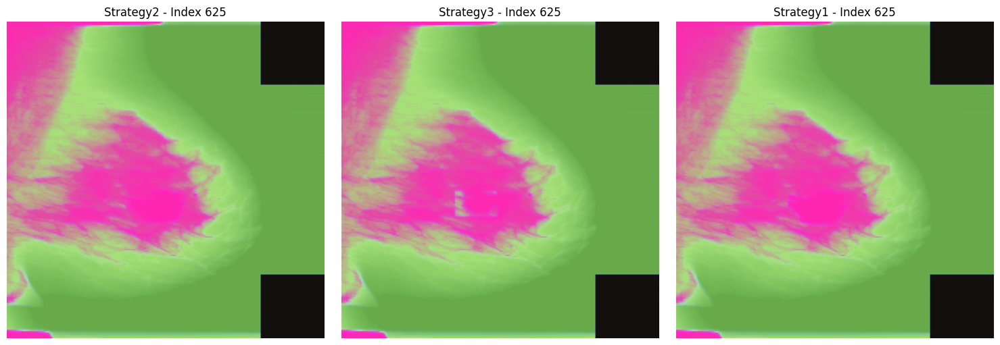


Plotting Index: 602


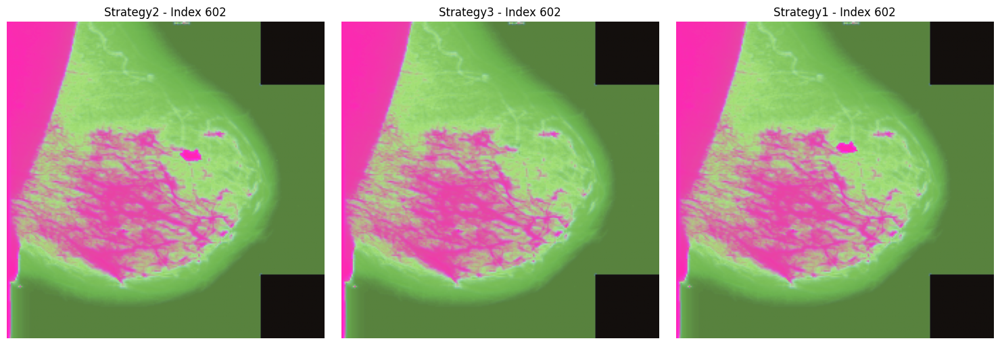


Plotting Index: 4527


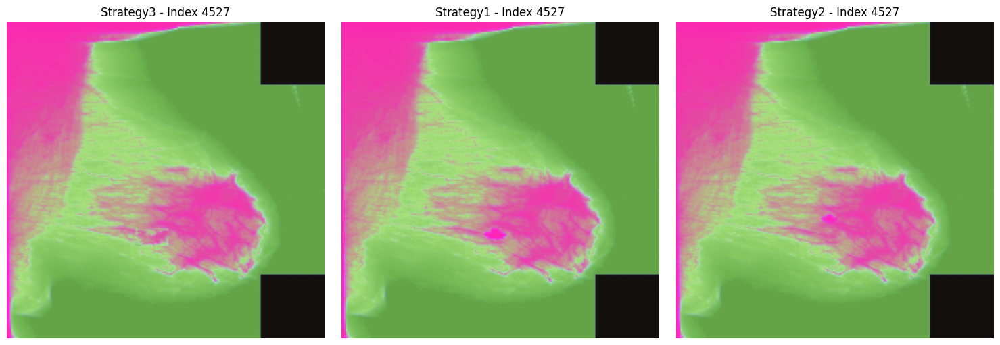


Plotting Index: 2835


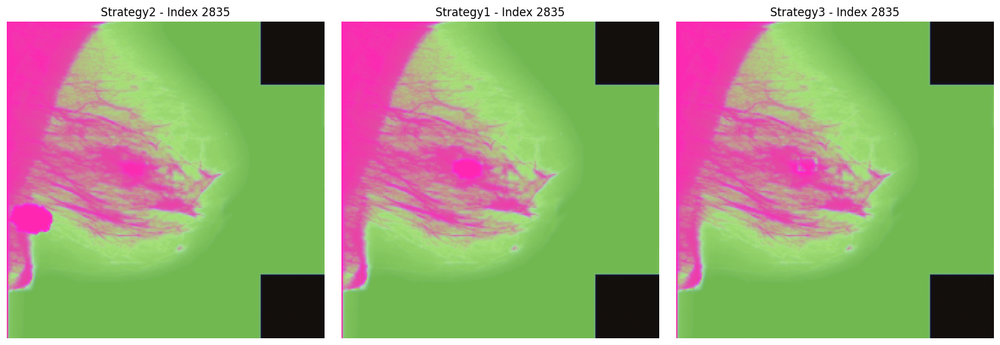


Plotting Index: 4714


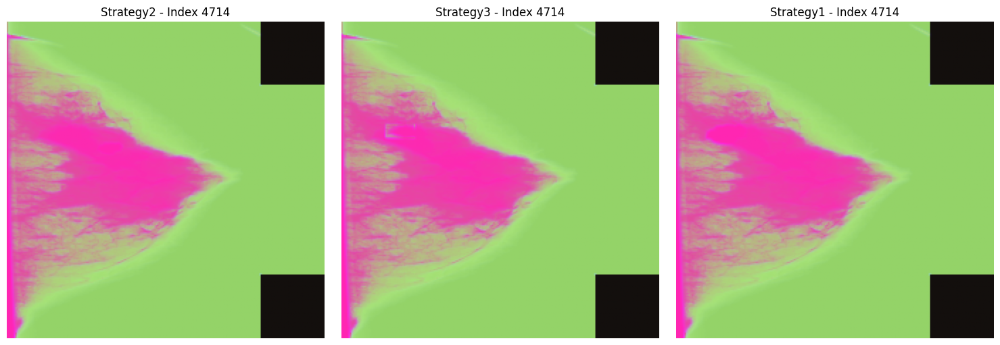

In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# Define the directory
data_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Benign"

# Function to group files by their index
def group_files_by_index(directory):
    strategy_groups = defaultdict(list)
    for file in os.listdir(directory):
        if file.endswith(".npy") and "augmented_strategy" in file:
            parts = file.split('_')
            strategy = parts[1]  # strategy1, strategy2, strategy3
            index = parts[2]     # index part
            strategy_groups[index].append((strategy, file))
    return strategy_groups

# Function to load and plot the files for a given index
def load_and_plot_files(index, files, directory):
    fig, axes = plt.subplots(1, len(files), figsize=(5 * len(files), 5))
    if len(files) == 1:
        axes = [axes]  # Handle single plot case

    for ax, (strategy, filename) in zip(axes, files):
        file_path = os.path.join(directory, filename)
        data = np.load(file_path)
        ax.imshow(data, cmap='gray')
        ax.set_title(f"{strategy.capitalize()} - Index {index}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Main Execution
if __name__ == "__main__":
    if os.path.exists(data_dir):
        # Group files and filter for indices with at least 2 strategies
        grouped_files = group_files_by_index(data_dir)
        valid_indices = {idx: files for idx, files in grouped_files.items() if len(files) >= 2}
        
        # Select up to 5 examples
        print("Found valid indices with at least 2 strategies:")
        selected_examples = list(valid_indices.items())[:5]
        for idx, files in selected_examples:
            print(f"\nPlotting Index: {idx}")
            load_and_plot_files(idx, files, data_dir)
    else:
        print(f"The directory {data_dir} does not exist.")


In [5]:
import os
import shutil

# Define directories
benign_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Benign"
malignant_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Malignant"
output_dir = "/kaggle/working/strategy1_dataset"  # Directory to save strategy1 files

# Ensure output directory exists
os.makedirs(output_dir, exist_ok=True)

# Function to save strategy2 files from a directory
def save_strategy1_files(source_dir, target_dir):
    count = 0
    for file in os.listdir(source_dir):
        if file.endswith(".npy") and "strategy1" in file:  # Check for strategy1 files
            source_path = os.path.join(source_dir, file)
            target_path = os.path.join(target_dir, file)
            shutil.copy(source_path, target_path)  # Copy file to target directory
            count += 1
    return count

# Main execution
if __name__ == "__main__":
    print("Saving strategy1 files...")

    # Process Benign directory
    benign_count = save_strategy1_files(benign_dir, output_dir)
    print(f"Saved {benign_count} strategy1 files from Benign directory.")

    # Process Malignant directory
    malignant_count = save_strategy1_files(malignant_dir, output_dir)
    print(f"Saved {malignant_count} strategy1 files from Malignant directory.")

    print(f"\nTotal strategy1 files saved: {benign_count + malignant_count}")
    print(f"Files are saved in: {output_dir}")



Saving strategy1 files...
Saved 2676 strategy1 files from Benign directory.
Saved 2308 strategy1 files from Malignant directory.

Total strategy1 files saved: 4984
Files are saved in: /kaggle/working/strategy1_dataset


In [6]:
import os
import shutil

# Define directories
benign_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Benign"
malignant_dir = "/kaggle/input/final-cbis-ddsm-breast-cancer-image-dataset/Malignant"
output_dir = "/kaggle/working/strategy1_dataset"

# Subdirectories for benign and malignant
output_benign = os.path.join(output_dir, "benign")
output_malignant = os.path.join(output_dir, "malignant")

# Function to clean output directories
def clean_directory(directory):
    if os.path.exists(directory):
        shutil.rmtree(directory)
    os.makedirs(directory)

# Function to copy and rename files with labels
def save_and_label_files(source_dir, target_dir, label):
    count = 0
    for file in os.listdir(source_dir):
        if file.endswith(".npy") and "strategy1" in file:
            source_path = os.path.join(source_dir, file)
            # Modify filename to include label
            base_name = "_".join(file.split("_")[:3])  # Keeps augmented_strategy1_3548
            new_file = f"{base_name}_{label}.npy"     # Add label _0_ or _1_
            target_path = os.path.join(target_dir, new_file)
            shutil.copy(source_path, target_path)
            count += 1
    return count

# Main execution
if __name__ == "__main__":
    print("Cleaning output directories...")
    clean_directory(output_dir)
    clean_directory(output_benign)
    clean_directory(output_malignant)
    
    print("Saving and labeling strategy1 files...")

    # Process Benign directory with _0_ label
    benign_count = save_and_label_files(benign_dir, output_benign, "0")
    print(f"Saved and labeled {benign_count} strategy1 files from Benign directory.")

    # Process Malignant directory with _1_ label
    malignant_count = save_and_label_files(malignant_dir, output_malignant, "1")
    print(f"Saved and labeled {malignant_count} strategy1 files from Malignant directory.")

    print("\nSummary:")
    print(f"Benign files saved: {benign_count}")
    print(f"Malignant files saved: {malignant_count}")
    print(f"Files are saved in: {output_dir}")


Cleaning output directories...
Saving and labeling strategy1 files...
Saved and labeled 2676 strategy1 files from Benign directory.
Saved and labeled 2308 strategy1 files from Malignant directory.

Summary:
Benign files saved: 2676
Malignant files saved: 2308
Files are saved in: /kaggle/working/strategy1_dataset


In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
import numpy as np
import os

# 1. Data Paths
benign_dir = "/kaggle/working/strategy1_dataset/benign"
malignant_dir = "/kaggle/working/strategy1_dataset/malignant"

# Collect all file paths
benign_files = [os.path.join(benign_dir, f) for f in os.listdir(benign_dir) if f.endswith('.npy')]
malignant_files = [os.path.join(malignant_dir, f) for f in os.listdir(malignant_dir) if f.endswith('.npy')]

# Split data into train and test
benign_train, benign_test = train_test_split(benign_files, test_size=0.2, random_state=42)
malignant_train, malignant_test = train_test_split(malignant_files, test_size=0.2, random_state=42)

# Calculate Class Weights BEFORE initializing dataset
benign_count = len(benign_train)
malignant_count = len(malignant_train)
class_weights = torch.tensor([1.0, benign_count / malignant_count]).to("cuda" if torch.cuda.is_available() else "cpu")

# 2. Custom Dataset
class Custom3ChannelDataset(Dataset):
    def __init__(self, file_paths, labels, transform=None):
        self.files = file_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        image = np.load(self.files[idx])

        if image.ndim == 2:
            image = np.stack([image] * 3, axis=0) 
        elif image.shape[0] != 3:
            image = image[:3, :, :] 
        
        image = torch.tensor(image, dtype=torch.float32)
        if self.transform:
            image = self.transform(image)

        label = torch.tensor(self.labels[idx], dtype=torch.float32)
        return image, label


In [8]:
# 3. Data Transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224
    transforms.Normalize(mean=[0.00237972, 0.0023751,  0.00174674], std=[0.00088792, 0.00102896, 0.00067923])
])

# 4. Combine Files and Labels
train_files = benign_train + malignant_train
train_labels = [0] * len(benign_train) + [1] * len(malignant_train)

test_files = benign_test + malignant_test
test_labels = [0] * len(benign_test) + [1] * len(malignant_test)

# Initialize Datasets and DataLoaders
train_dataset = Custom3ChannelDataset(train_files, train_labels, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)

test_dataset = Custom3ChannelDataset(test_files, test_labels, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

print(f"Benign Count: {benign_count}, Malignant Count: {malignant_count}")
print(f"Class Weights: {class_weights}")

Benign Count: 2140, Malignant Count: 1846
Class Weights: tensor([1.0000, 1.1593])


In [12]:
import torch
import torch.nn as nn
import torchvision.models as models

# Crate an instance of DenseNet121 model
device = "cuda" if torch.cuda.is_available() else "cpu"
model = models.efficientnet_b4(weights=models.EfficientNet_B4_Weights.IMAGENET1K_V1)

# Freeze Early Layers
for name, param in model.named_parameters():
    if "features.6" not in name and "classifier" not in name:  # Only train last block and classifier
        param.requires_grad = False

# Replace Fully Connected Layer (Classifier)
num_ftrs = model.classifier[1].in_features  # Extract the input features of the classifier
model.classifier = nn.Sequential(
    nn.Linear(num_ftrs, 128),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(128, 1)  # Binary classification output (no sigmoid)
)

# Carica i parametri del modello dal file .pth
model.load_state_dict(torch.load('/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model'))

# Metti il modello in modalità di valutazione (opzionale, ma raccomandato per l'inferenza)
model.eval()

<ipython-input-12-0ae08580a34b>:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/kaggle/input/efficientnetb4/other/default/1/efficientnet

IsADirectoryError: [Errno 21] Is a directory: '/kaggle/input/efficientnetb4/other/default/1/efficientnetb4_cbis_trained_model'

In [27]:
# Function to print the model structure starting from a specific layer
def print_efficientnet_layer_flow(model, start_layer_name):
    """
    Prints the flow of layers in EfficientNet-B4 starting from a specified layer.

    Args:
        model (torch.nn.Module): EfficientNet-B4 model.
        start_layer_name (str): Name of the starting layer.
    """
    # Traverse the model to isolate the starting layer
    start_flag = False
    print(f"\nFlow of Layers Starting from '{start_layer_name}':\n{'='*60}")
    for name, layer in model.named_modules():
        # Check for the start layer
        if name == start_layer_name:
            start_flag = True  # Begin printing from this layer
        if start_flag:
            print(f"Layer: {name}\n{layer}\n{'-'*60}")
        # Stop at the classifier layer (end of EfficientNet-B4)
        if name == "classifier":
            break

# Example Usage
# Assuming `model` is an instance of EfficientNet-B4
print_efficientnet_layer_flow(model, "features.0.0")



Flow of Layers Starting from 'features.0.0':
Layer: features.0.0
Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
------------------------------------------------------------
Layer: features.0.1
BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
------------------------------------------------------------
Layer: features.0.2
SiLU(inplace=True)
------------------------------------------------------------
Layer: features.1
Sequential(
  (0): MBConv(
    (block): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
        (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): SiLU(inplace=True)
      )
      (1): SqueezeExcitation(
        (avgpool): AdaptiveAvgPool2d(output_size=1)
        (fc1): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
        (fc2): Conv2d(12, 48, kernel_size=(1, 1), 

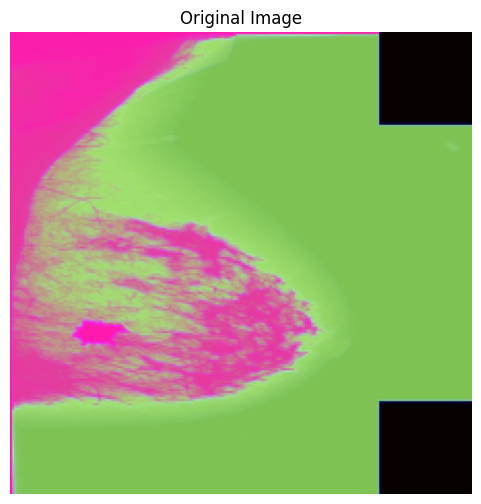

Visualizing Feature Maps for Layer: features.0.0, Shape: torch.Size([48, 112, 112])


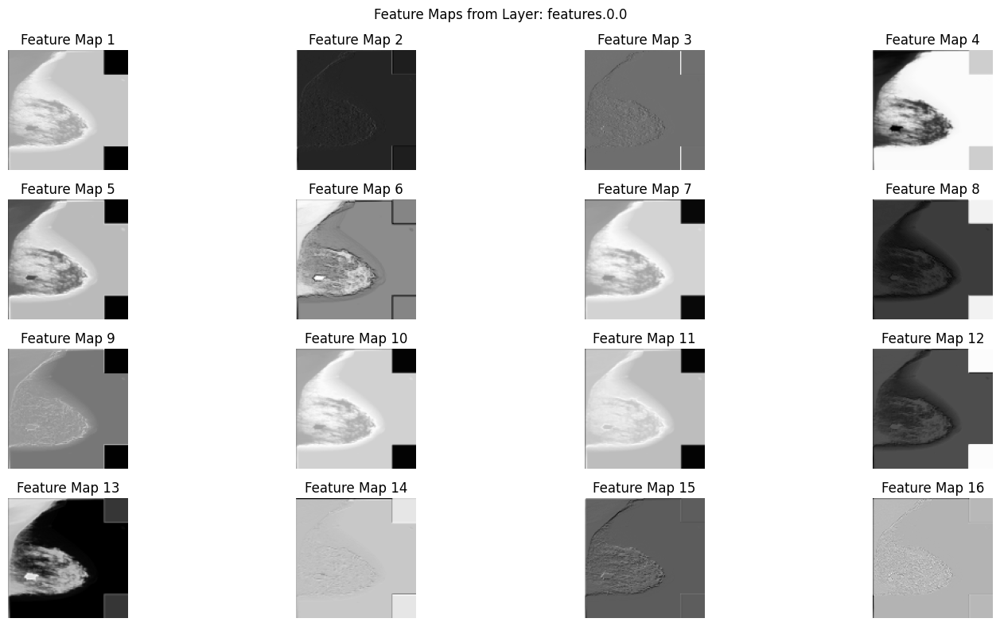

Visualizing Feature Maps for Layer: features.1.0.block.0.0, Shape: torch.Size([48, 112, 112])


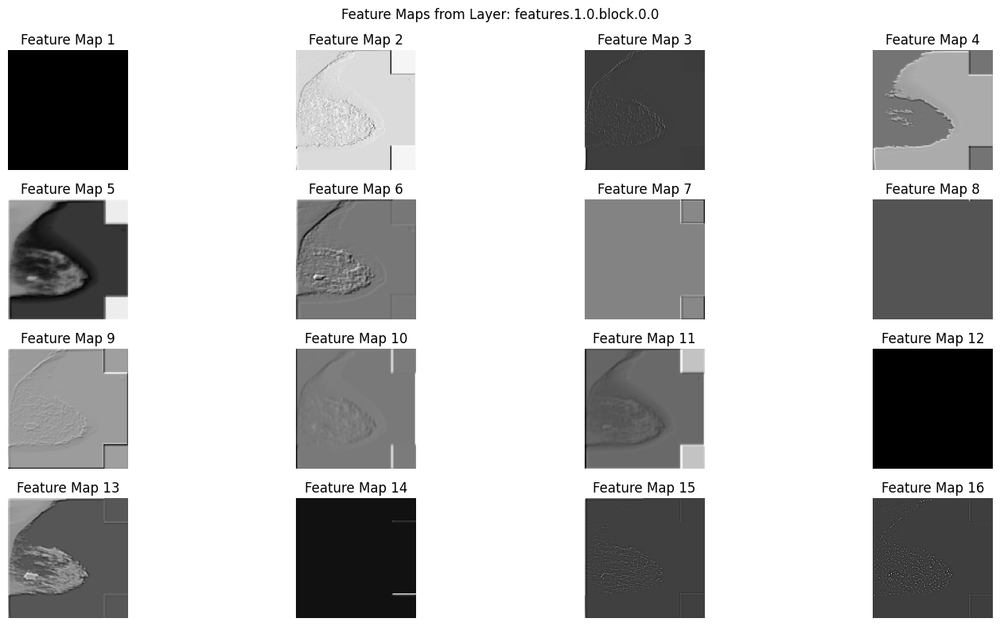

Visualizing Feature Maps for Layer: features.1.0.block.2.0, Shape: torch.Size([24, 112, 112])


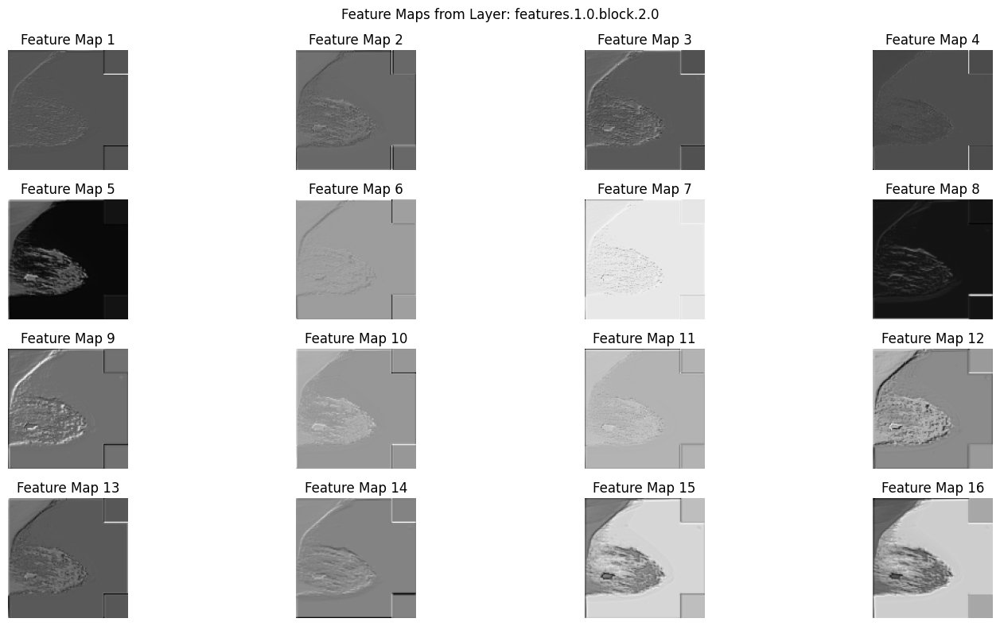

Visualizing Feature Maps for Layer: features.1.1.block.0.0, Shape: torch.Size([24, 112, 112])


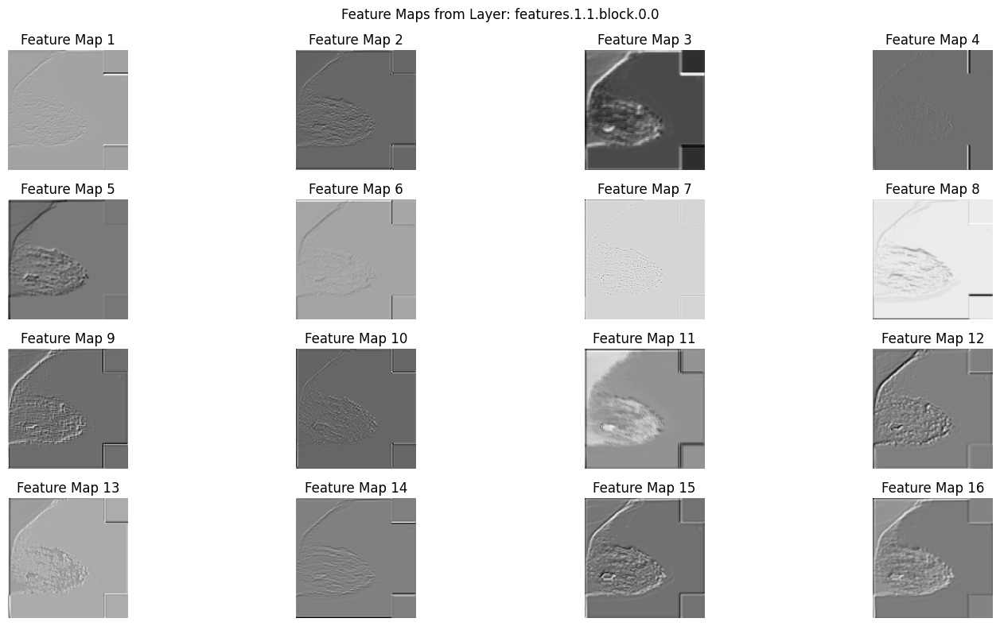

Visualizing Feature Maps for Layer: features.1.1.block.2.0, Shape: torch.Size([24, 112, 112])


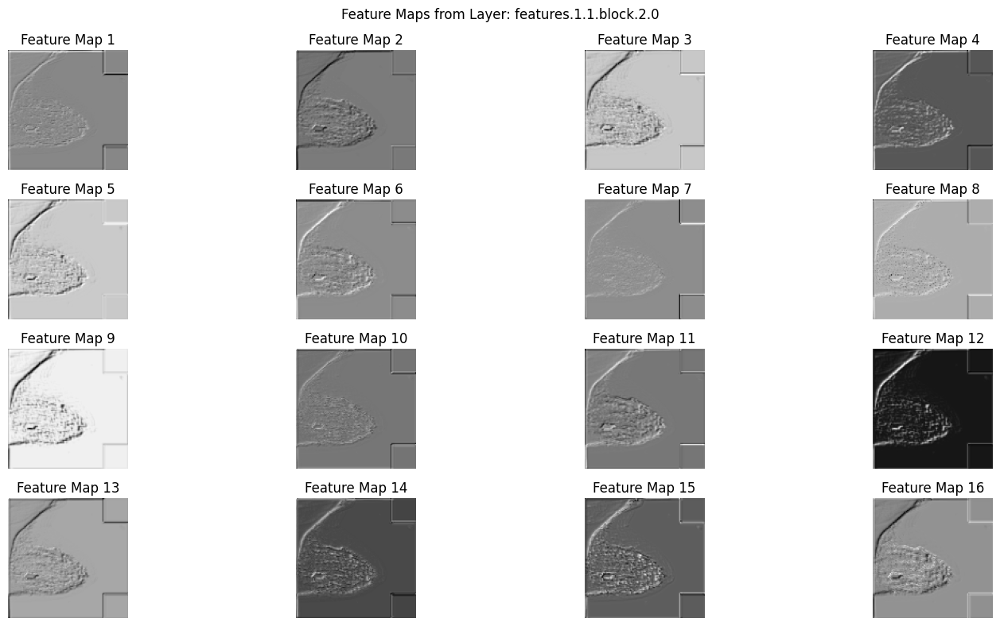

Visualizing Feature Maps for Layer: features.2.0.block.0.0, Shape: torch.Size([144, 112, 112])


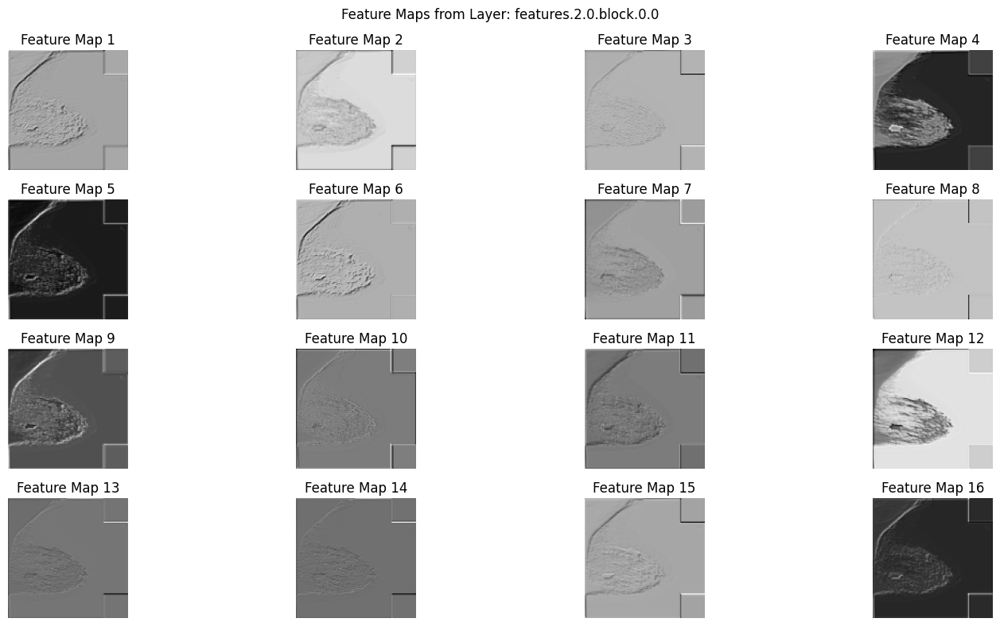

Visualizing Feature Maps for Layer: features.2.0.block.1.0, Shape: torch.Size([144, 56, 56])


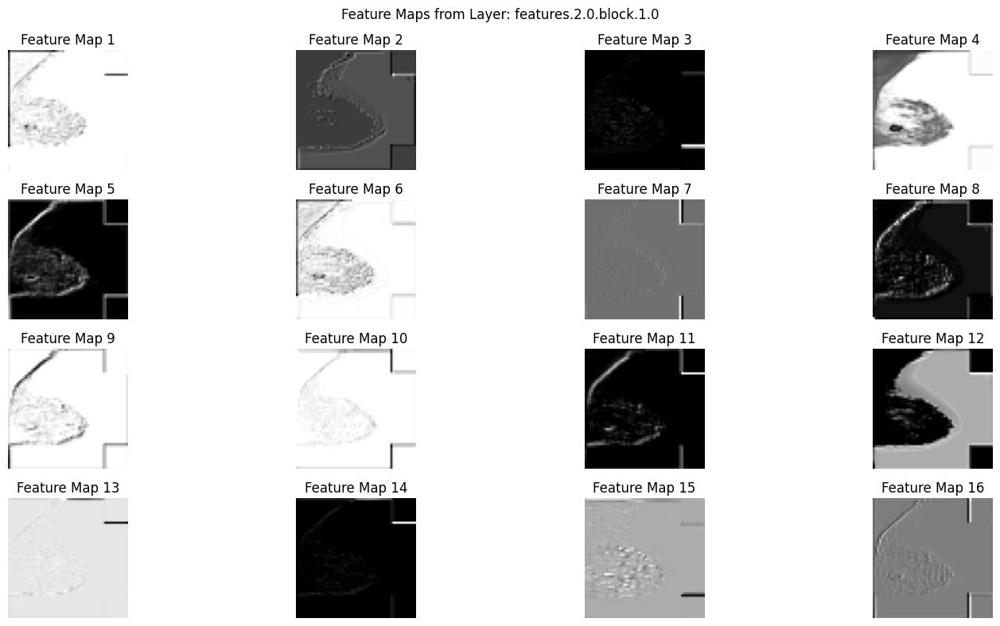

Visualizing Feature Maps for Layer: features.2.0.block.3.0, Shape: torch.Size([32, 56, 56])


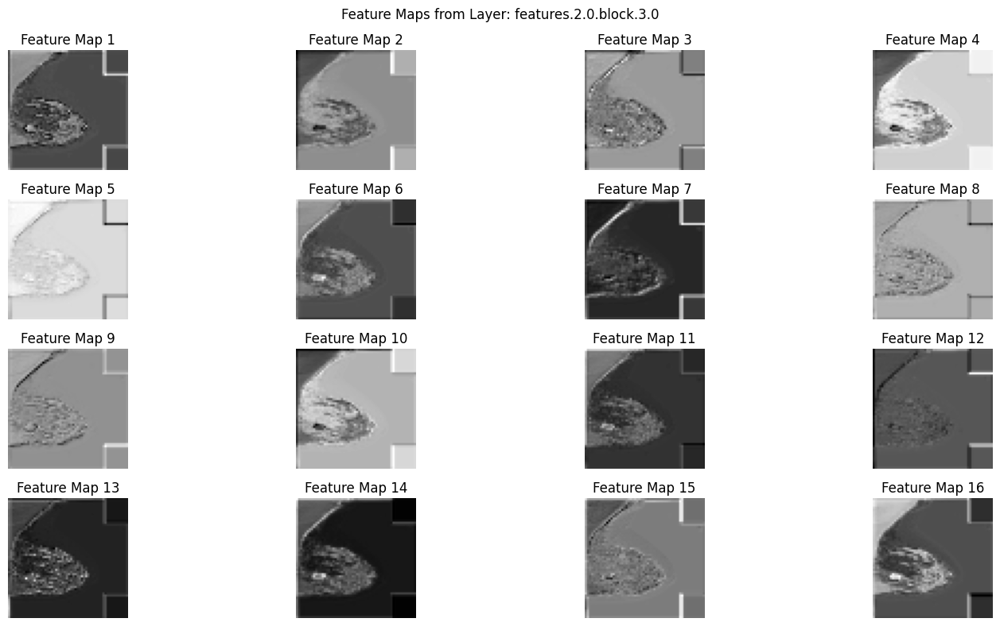

Visualizing Feature Maps for Layer: features.2.1.block.0.0, Shape: torch.Size([192, 56, 56])


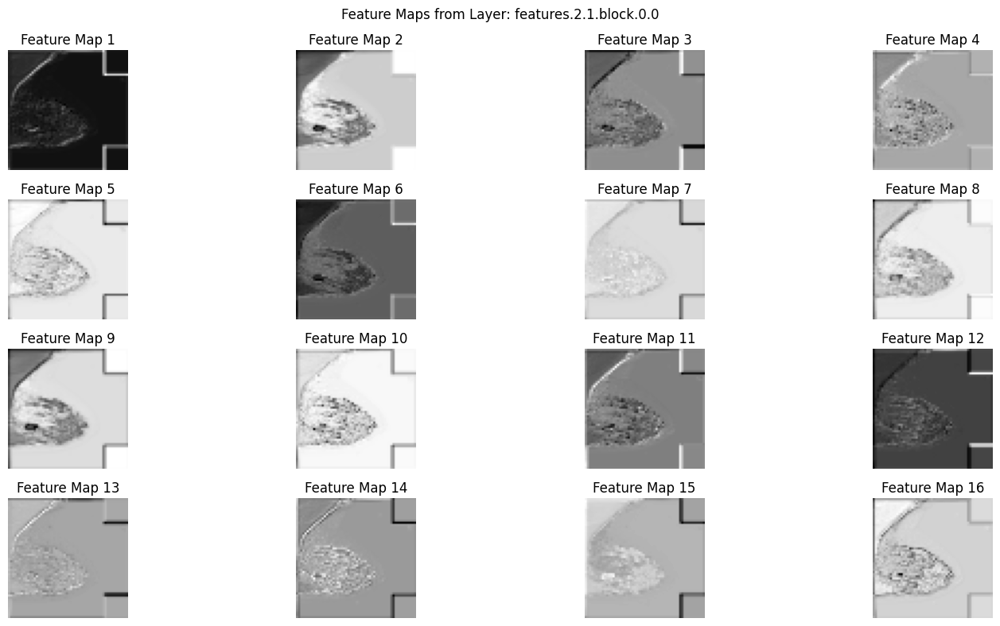

Visualizing Feature Maps for Layer: features.2.1.block.1.0, Shape: torch.Size([192, 56, 56])


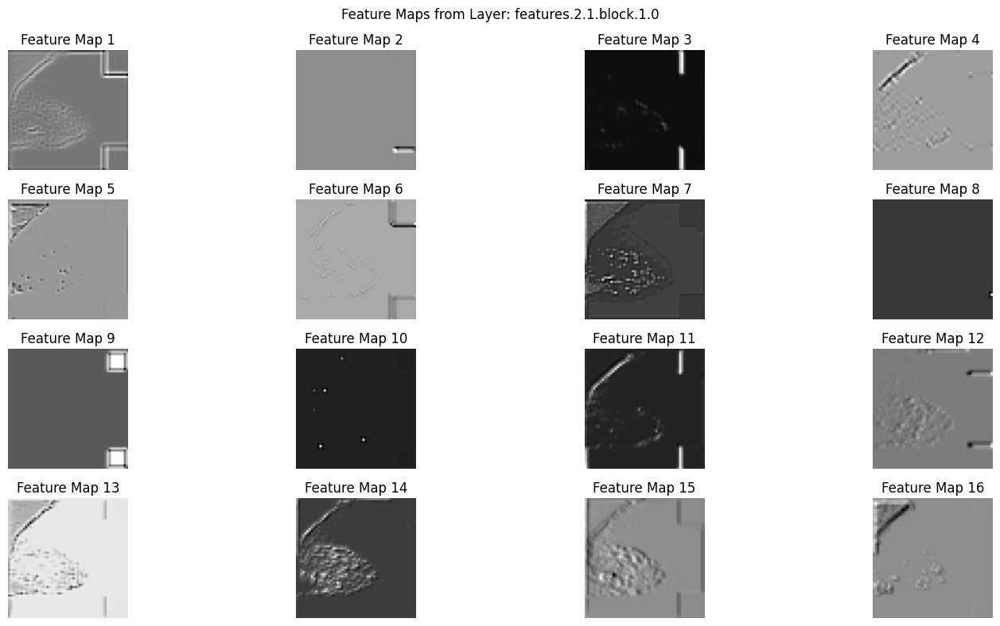

Visualizing Feature Maps for Layer: features.2.1.block.3.0, Shape: torch.Size([32, 56, 56])


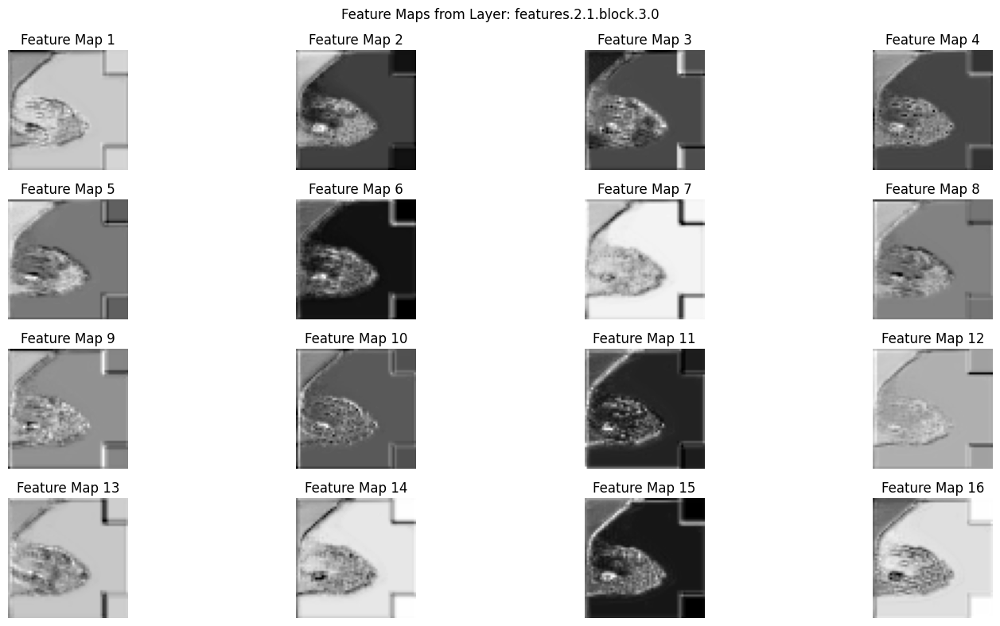

Visualizing Feature Maps for Layer: features.2.2.block.0.0, Shape: torch.Size([192, 56, 56])


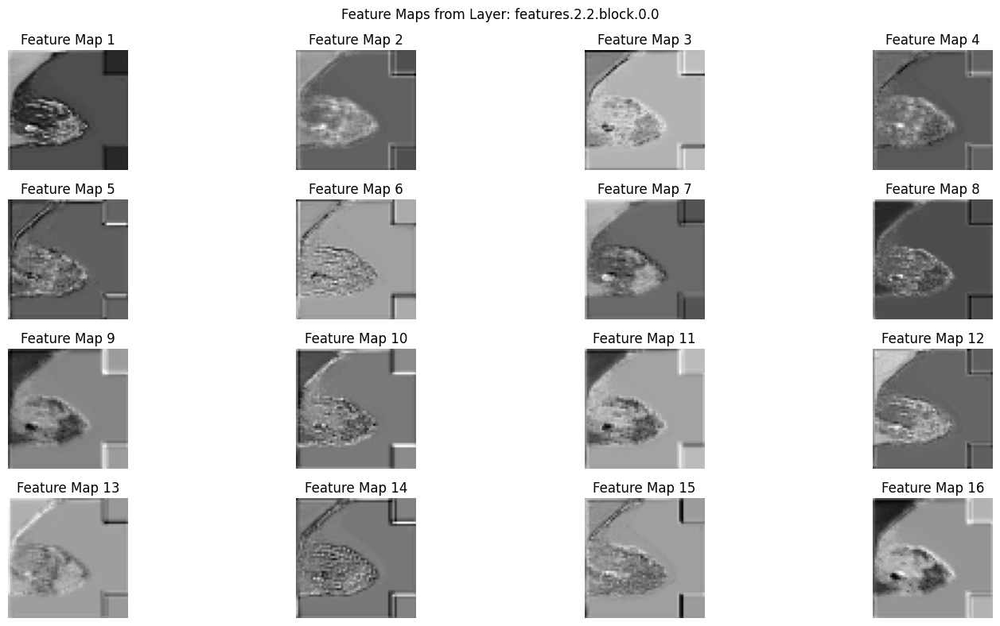

Visualizing Feature Maps for Layer: features.2.2.block.1.0, Shape: torch.Size([192, 56, 56])


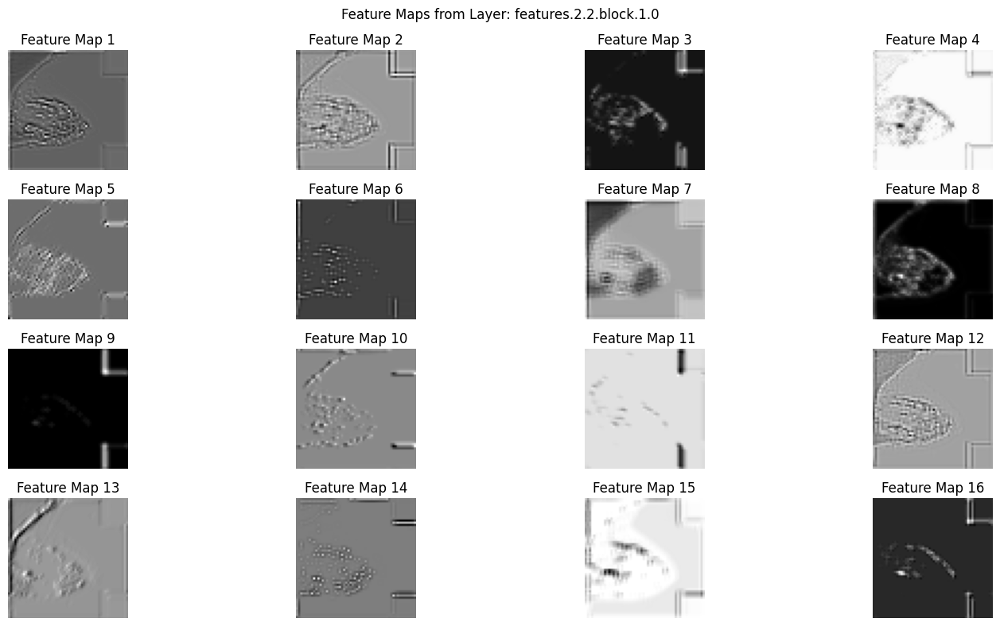

Visualizing Feature Maps for Layer: features.2.2.block.3.0, Shape: torch.Size([32, 56, 56])


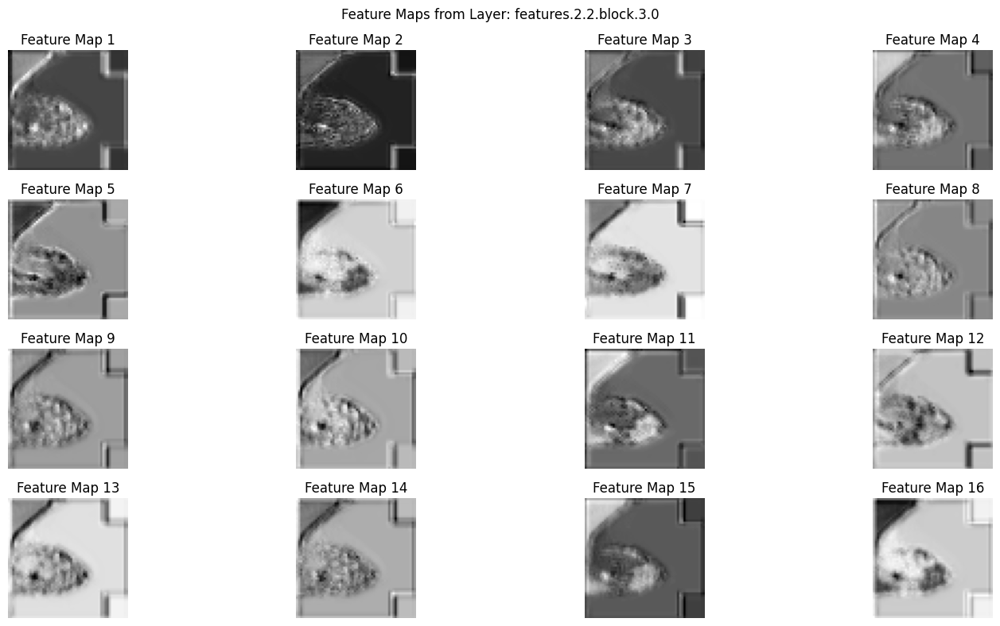

Visualizing Feature Maps for Layer: features.2.3.block.0.0, Shape: torch.Size([192, 56, 56])


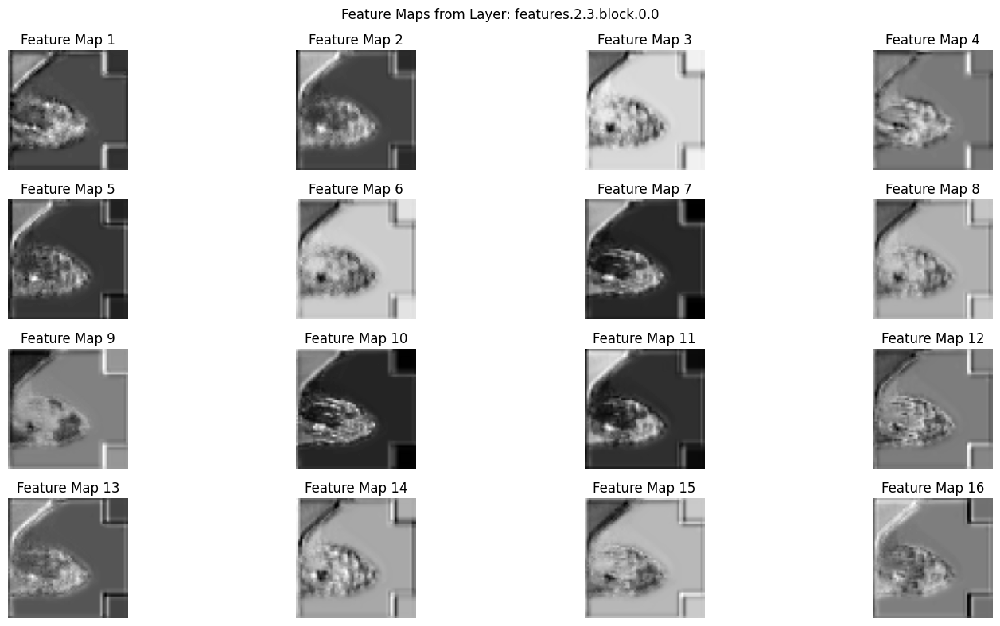

Visualizing Feature Maps for Layer: features.2.3.block.1.0, Shape: torch.Size([192, 56, 56])


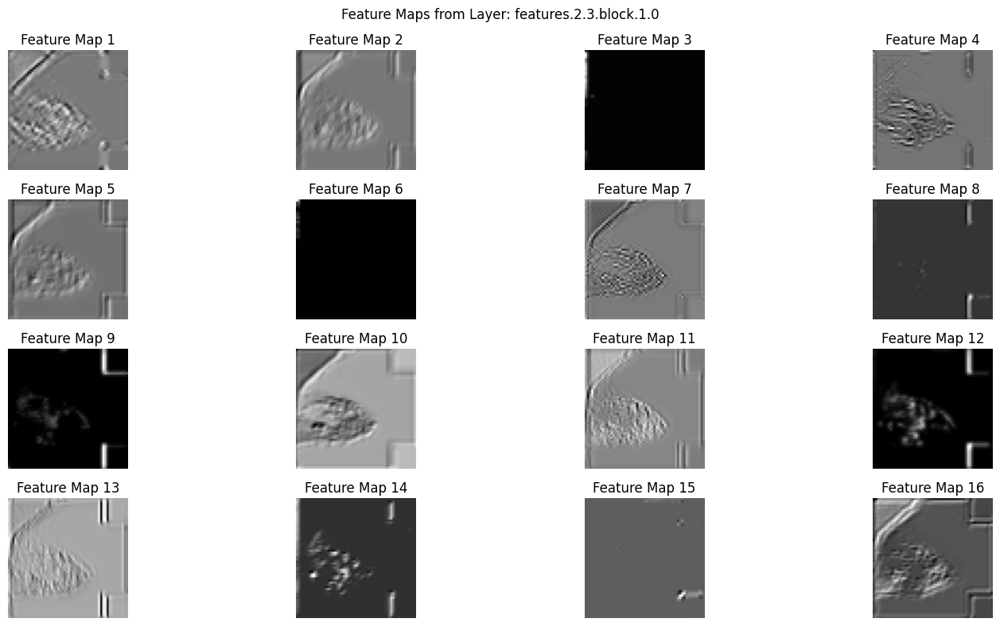

Visualizing Feature Maps for Layer: features.2.3.block.3.0, Shape: torch.Size([32, 56, 56])


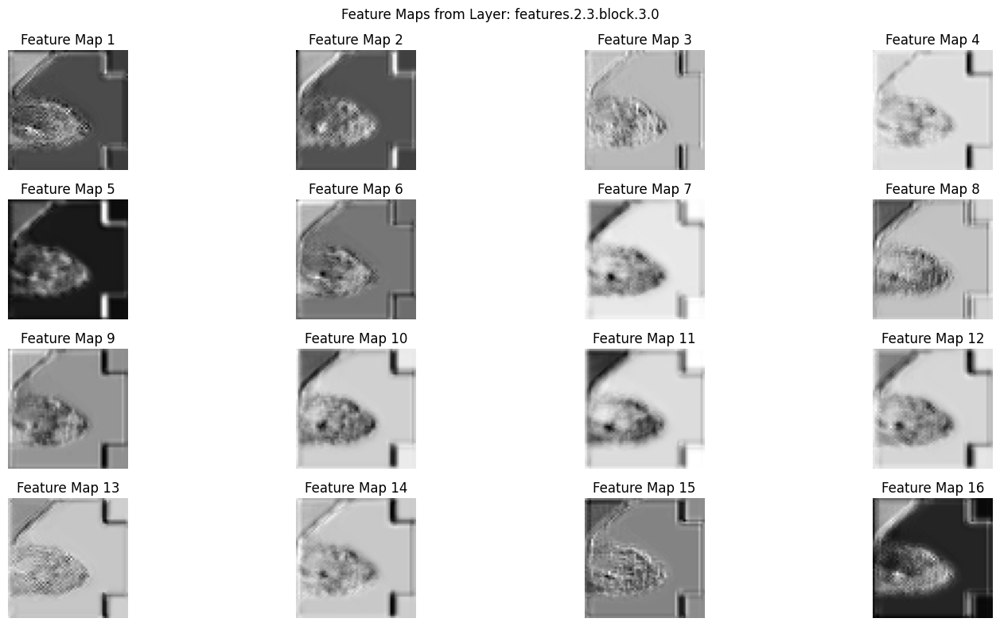

Visualizing Feature Maps for Layer: features.3.0.block.0.0, Shape: torch.Size([192, 56, 56])


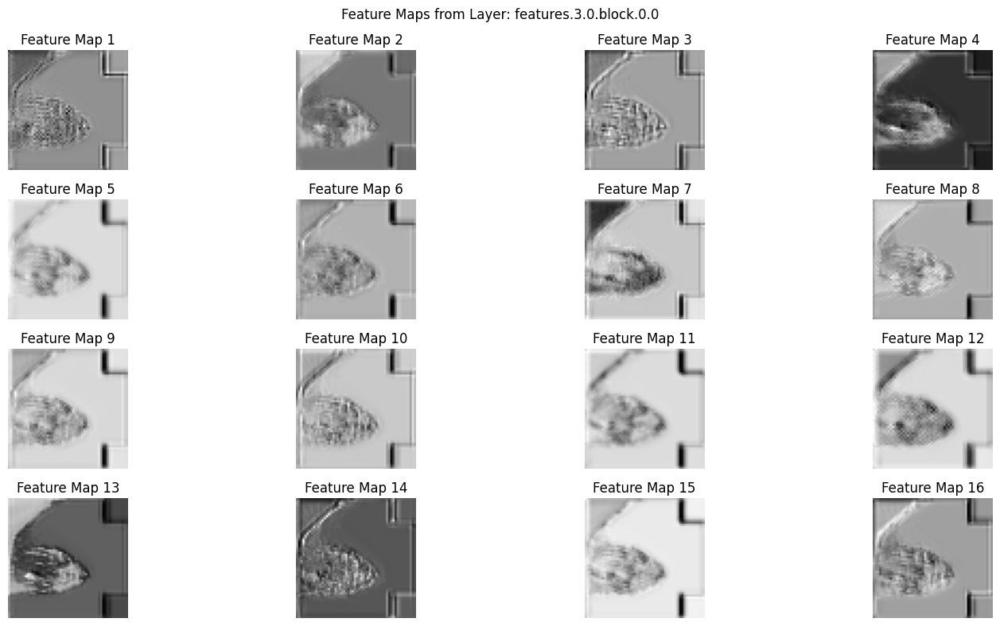

Visualizing Feature Maps for Layer: features.3.0.block.1.0, Shape: torch.Size([192, 28, 28])


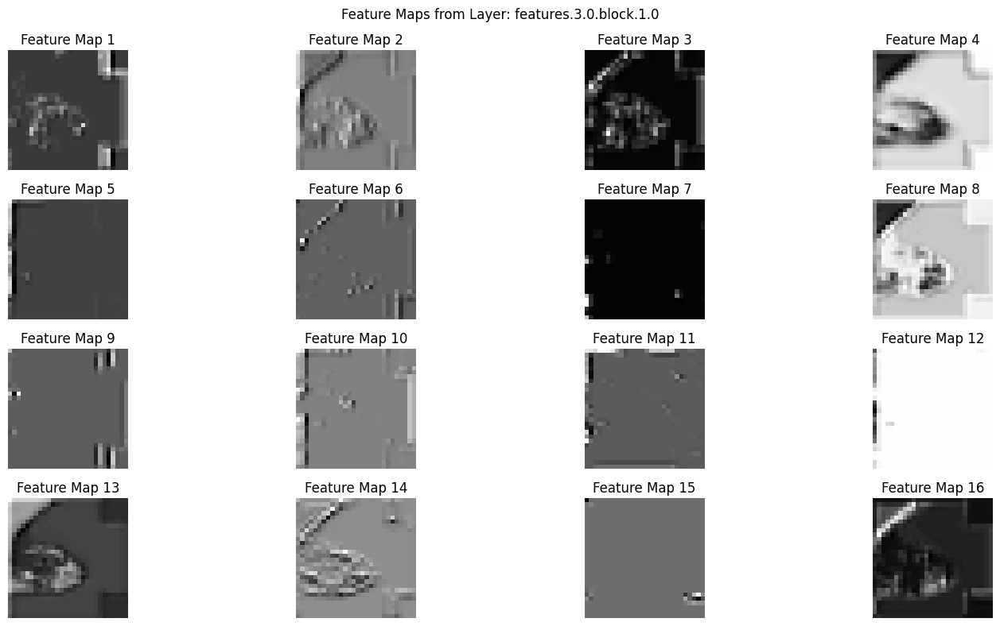

Visualizing Feature Maps for Layer: features.3.0.block.3.0, Shape: torch.Size([56, 28, 28])


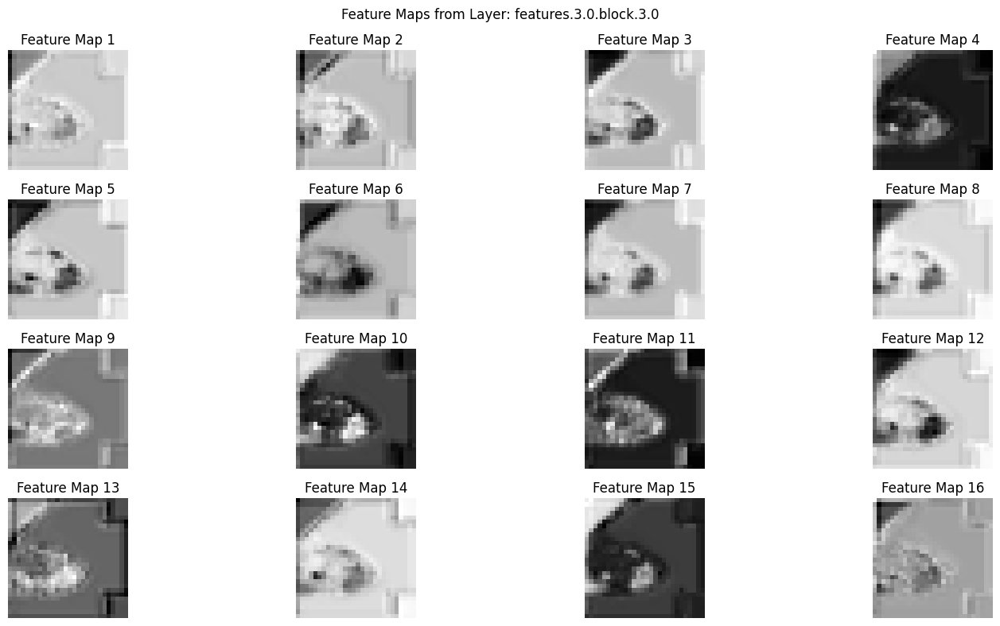

Visualizing Feature Maps for Layer: features.3.1.block.0.0, Shape: torch.Size([336, 28, 28])


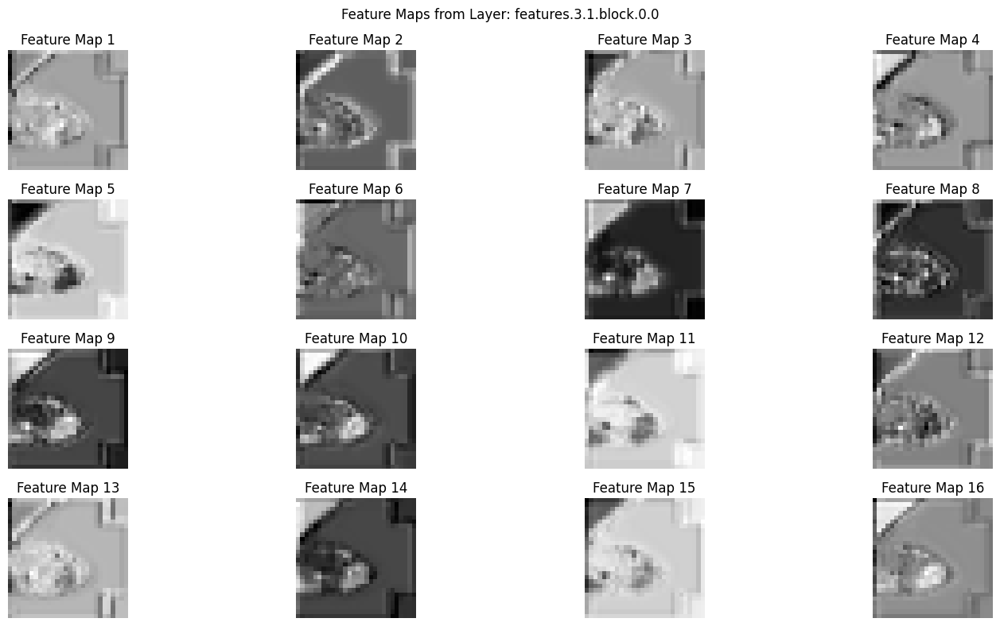

Visualizing Feature Maps for Layer: features.3.1.block.1.0, Shape: torch.Size([336, 28, 28])


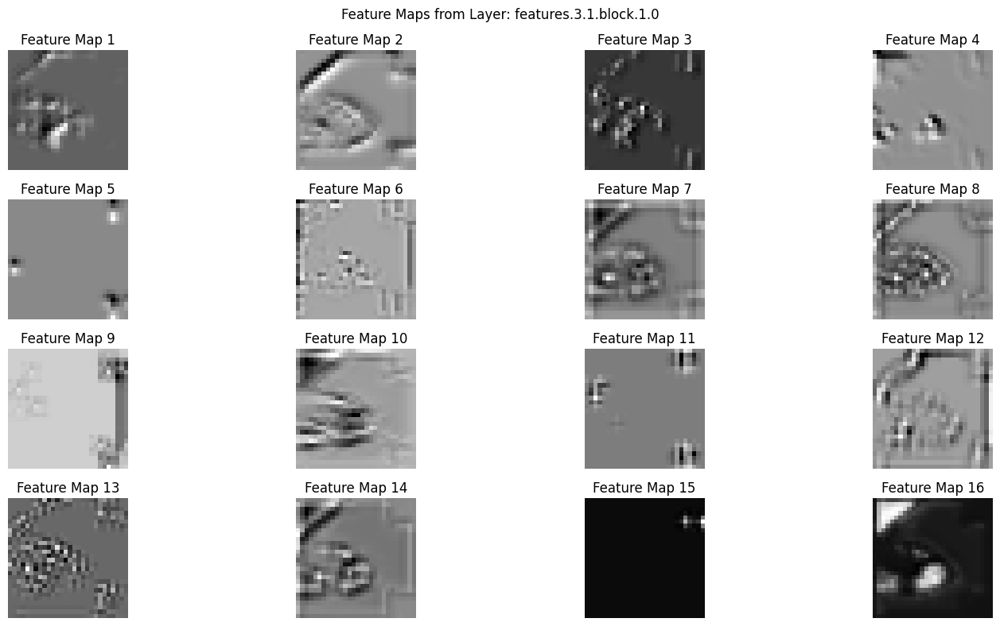

Visualizing Feature Maps for Layer: features.3.1.block.3.0, Shape: torch.Size([56, 28, 28])


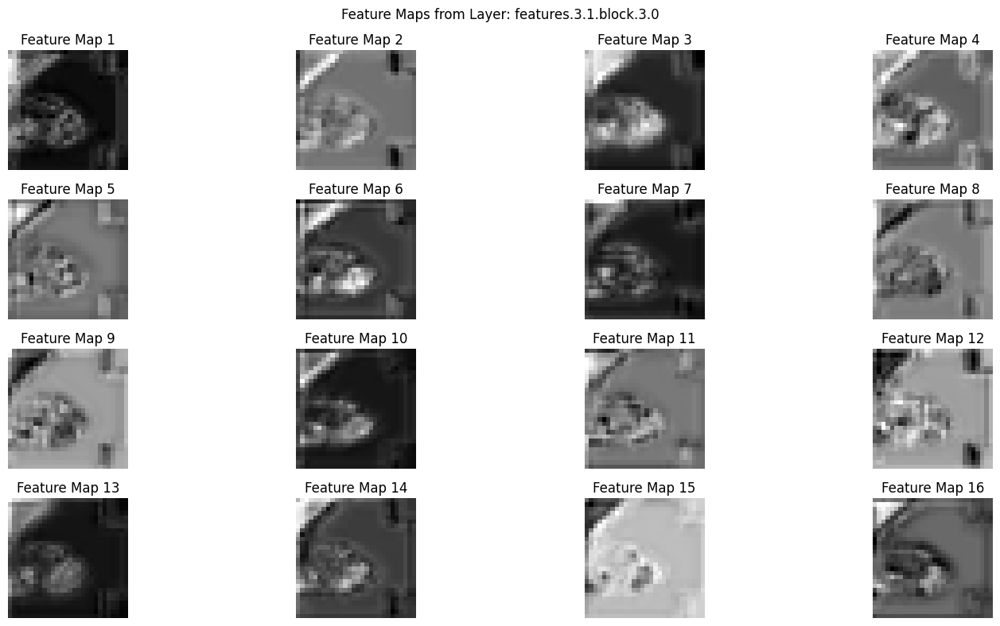

Visualizing Feature Maps for Layer: features.3.2.block.0.0, Shape: torch.Size([336, 28, 28])


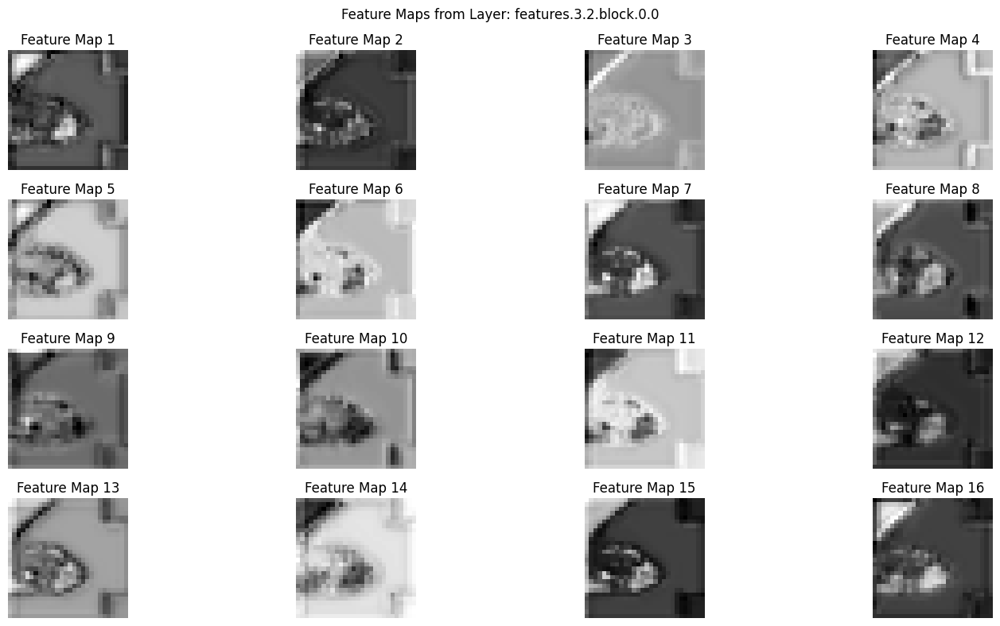

Visualizing Feature Maps for Layer: features.3.2.block.1.0, Shape: torch.Size([336, 28, 28])


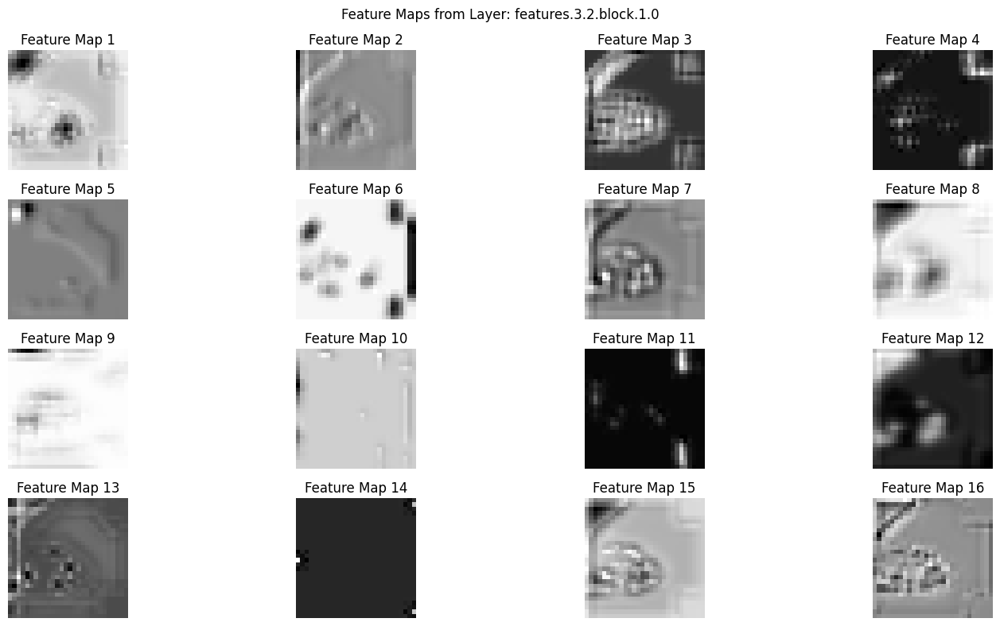

Visualizing Feature Maps for Layer: features.3.2.block.3.0, Shape: torch.Size([56, 28, 28])


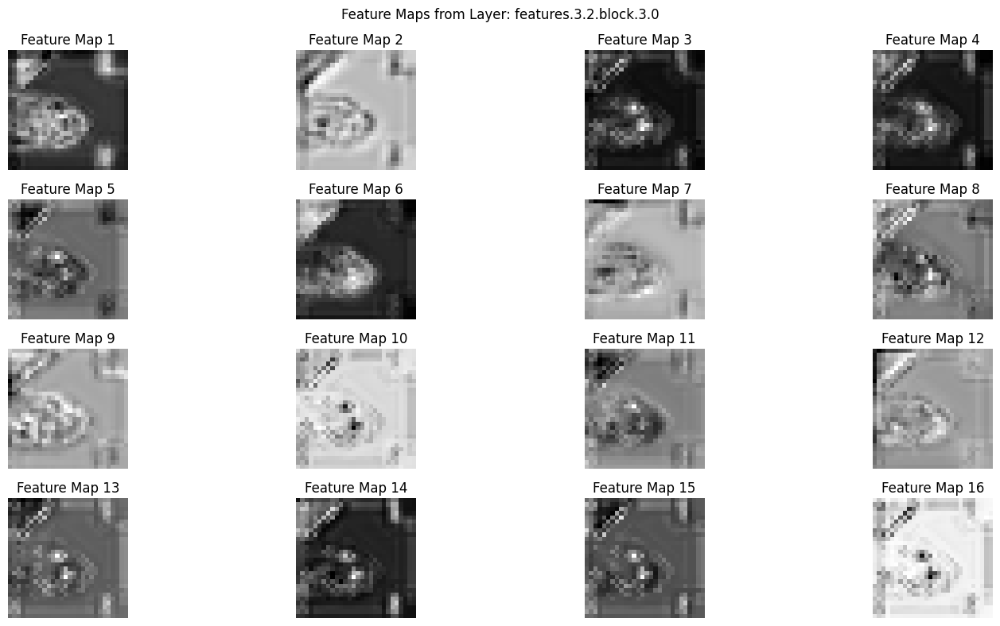

Visualizing Feature Maps for Layer: features.3.3.block.0.0, Shape: torch.Size([336, 28, 28])


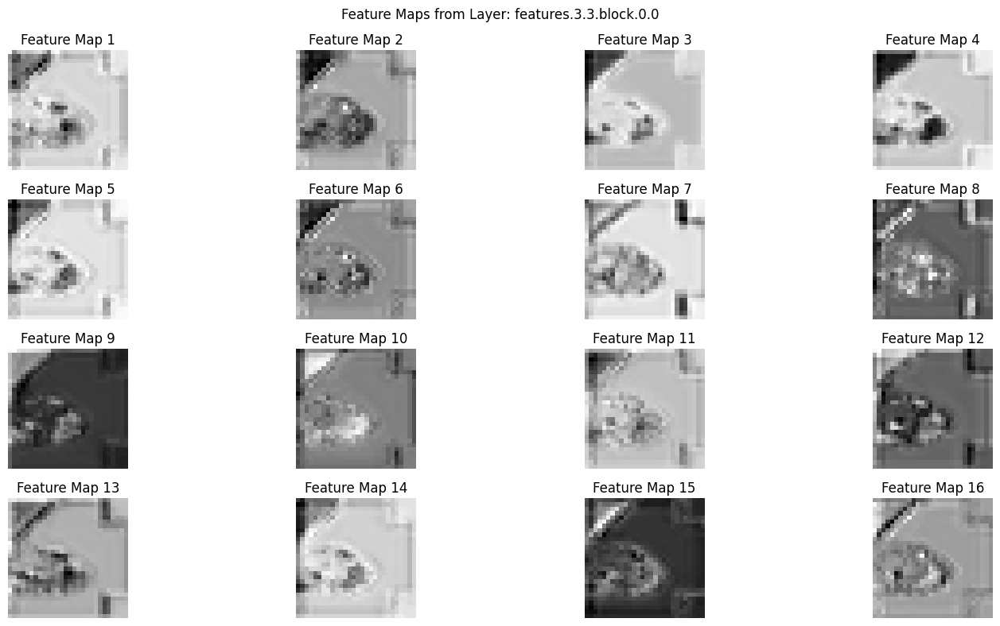

Visualizing Feature Maps for Layer: features.3.3.block.1.0, Shape: torch.Size([336, 28, 28])


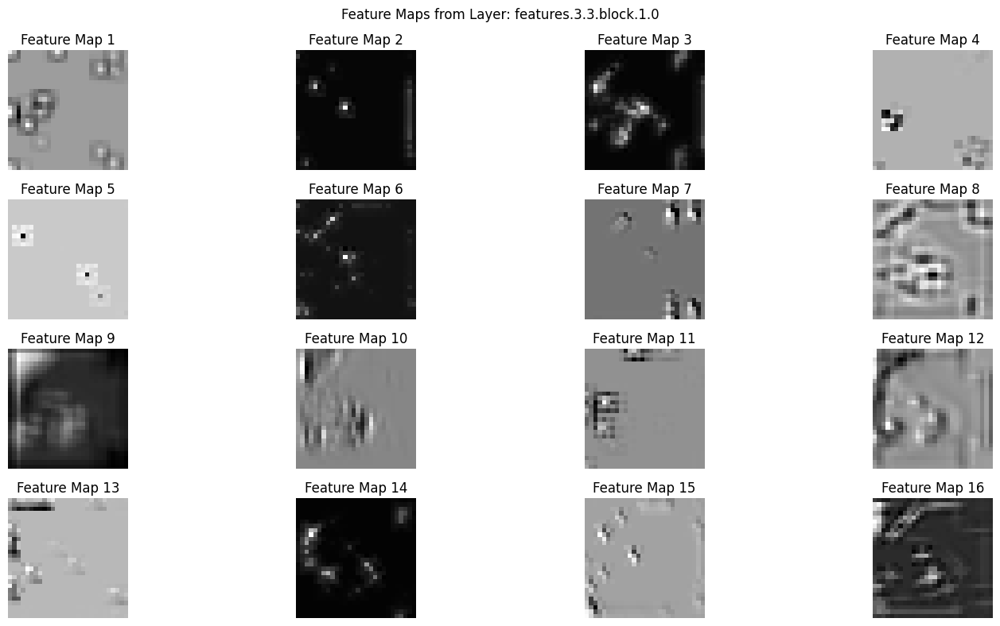

Visualizing Feature Maps for Layer: features.3.3.block.3.0, Shape: torch.Size([56, 28, 28])


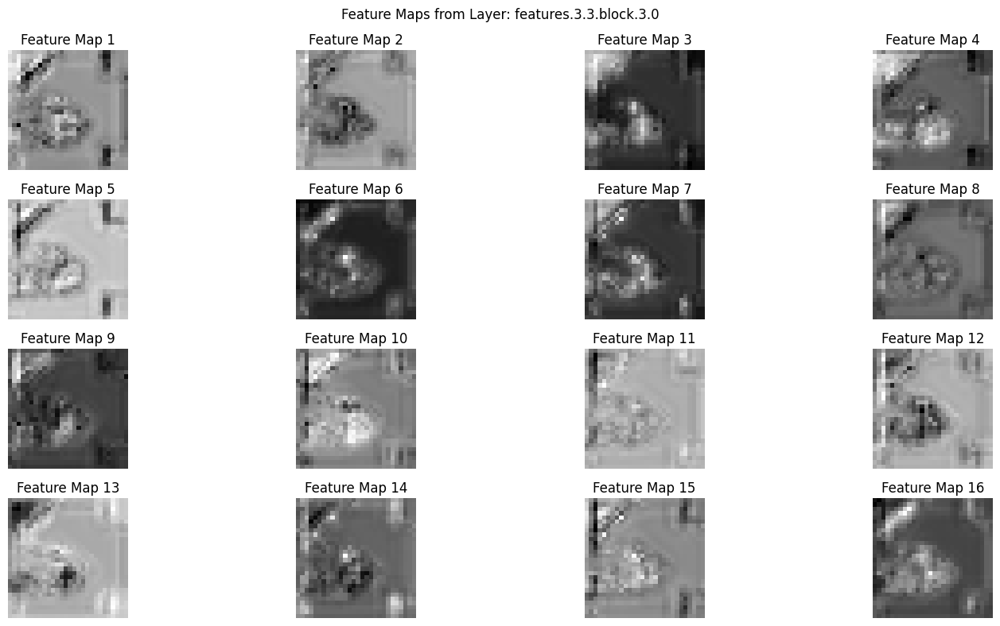

Visualizing Feature Maps for Layer: features.4.0.block.0.0, Shape: torch.Size([336, 28, 28])


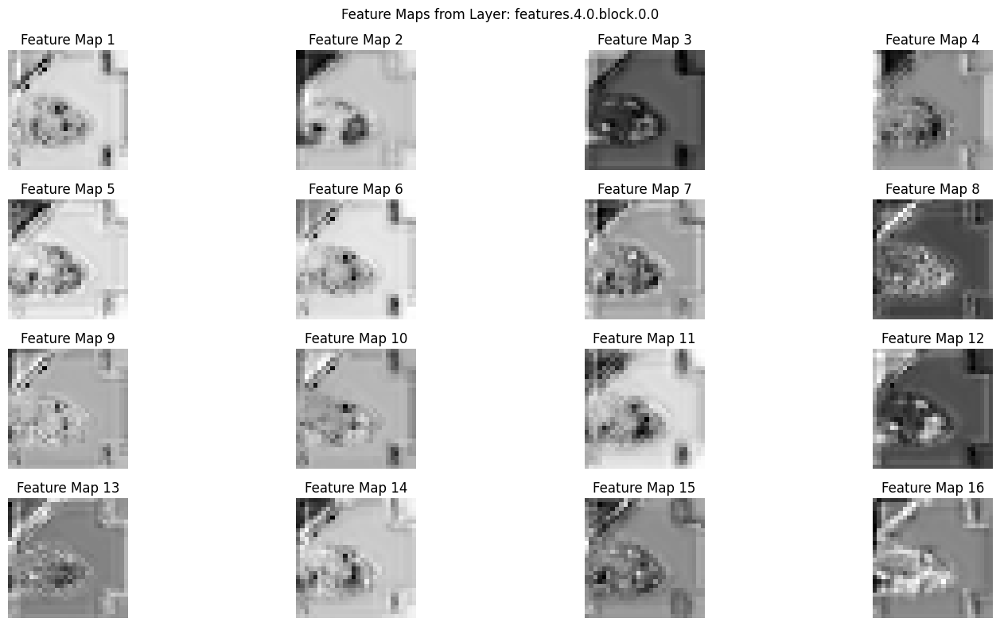

Visualizing Feature Maps for Layer: features.4.0.block.1.0, Shape: torch.Size([336, 14, 14])


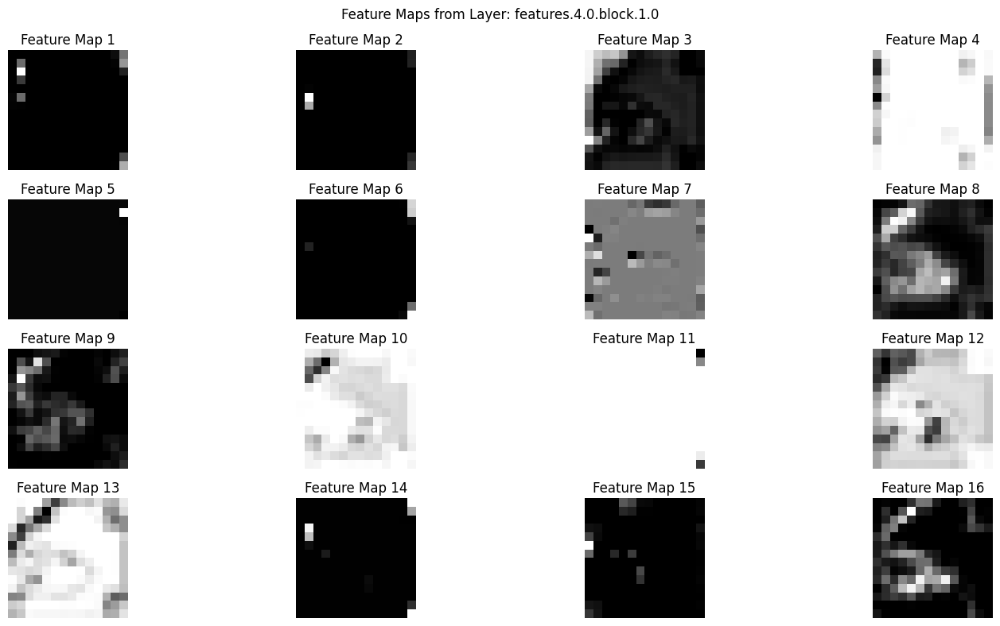

Visualizing Feature Maps for Layer: features.4.0.block.3.0, Shape: torch.Size([112, 14, 14])


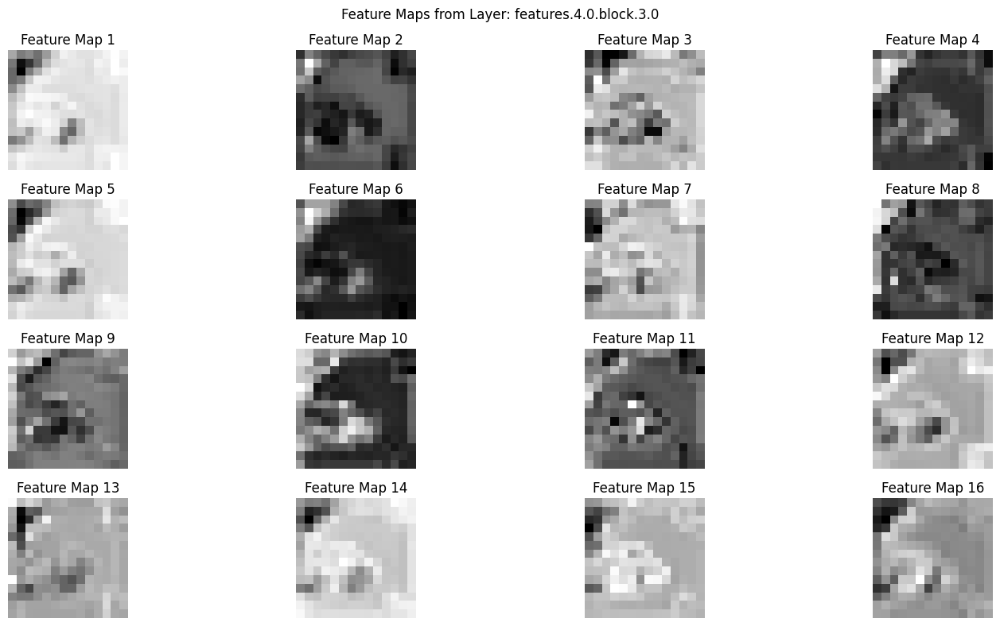

Visualizing Feature Maps for Layer: features.4.1.block.0.0, Shape: torch.Size([672, 14, 14])


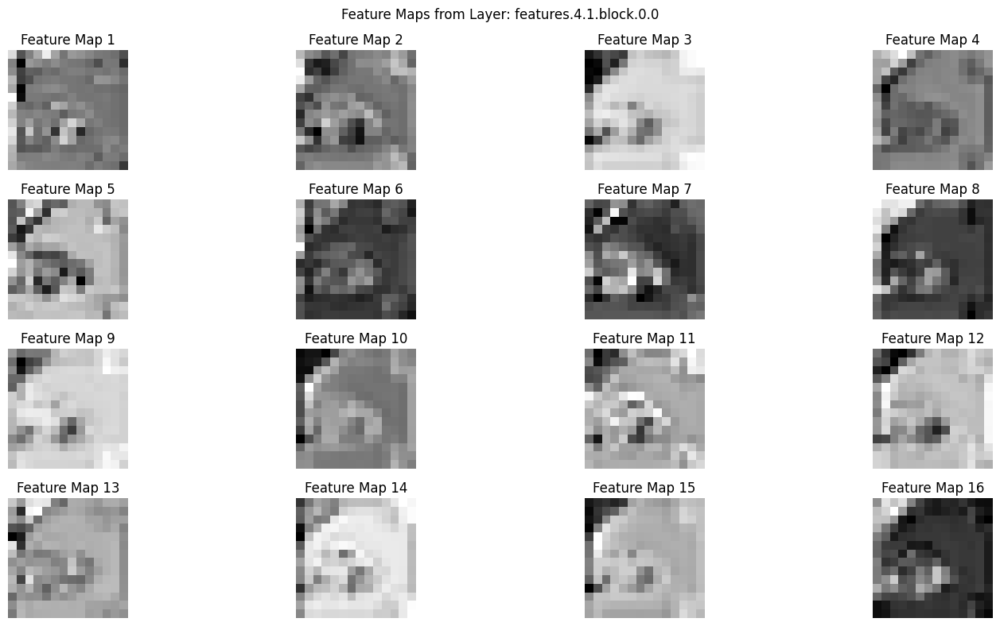

Visualizing Feature Maps for Layer: features.4.1.block.1.0, Shape: torch.Size([672, 14, 14])


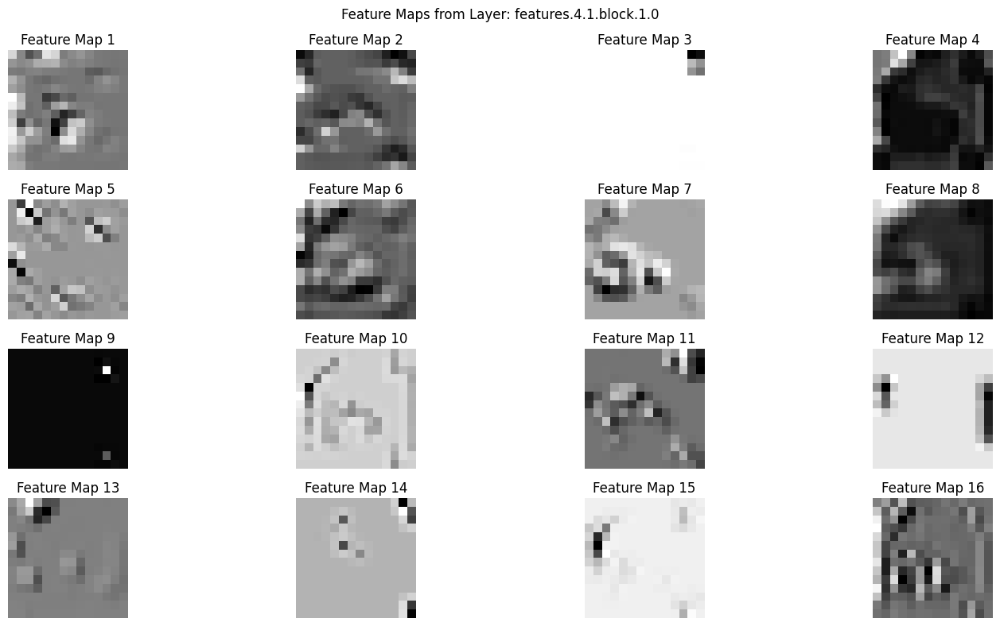

Visualizing Feature Maps for Layer: features.4.1.block.3.0, Shape: torch.Size([112, 14, 14])


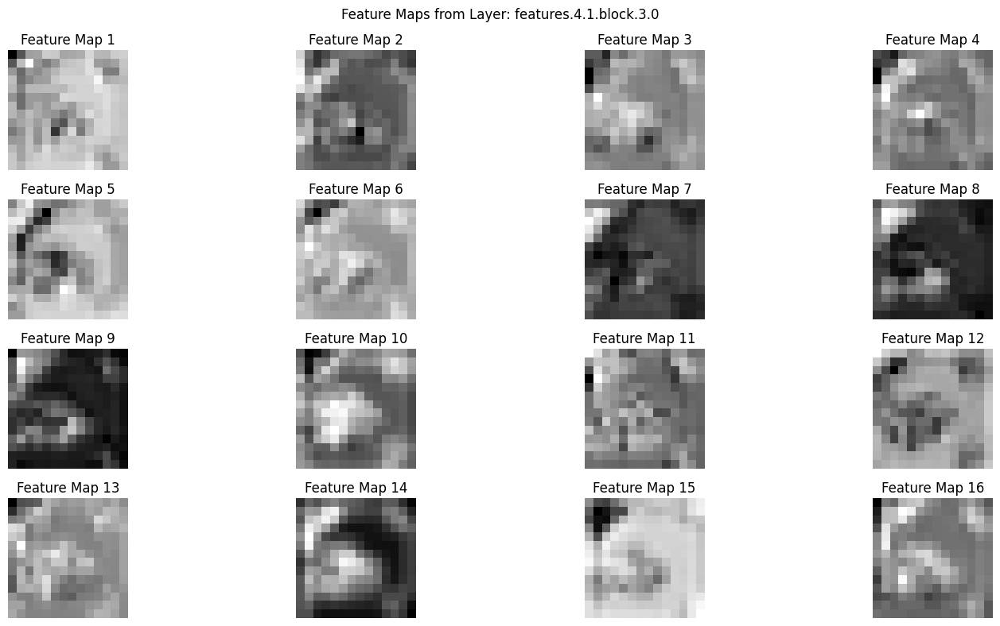

Visualizing Feature Maps for Layer: features.4.2.block.0.0, Shape: torch.Size([672, 14, 14])


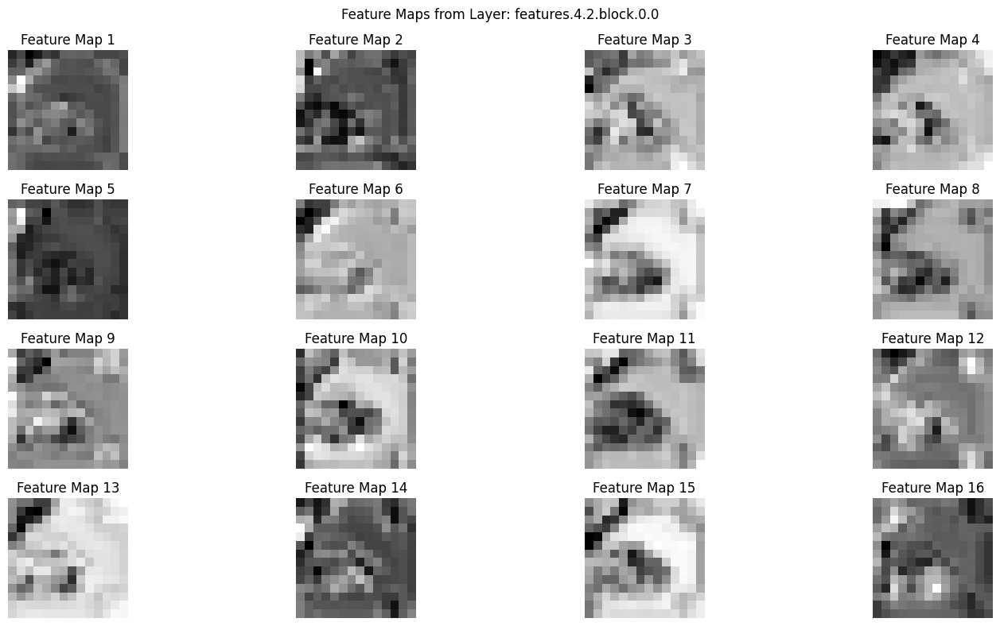

Visualizing Feature Maps for Layer: features.4.2.block.1.0, Shape: torch.Size([672, 14, 14])


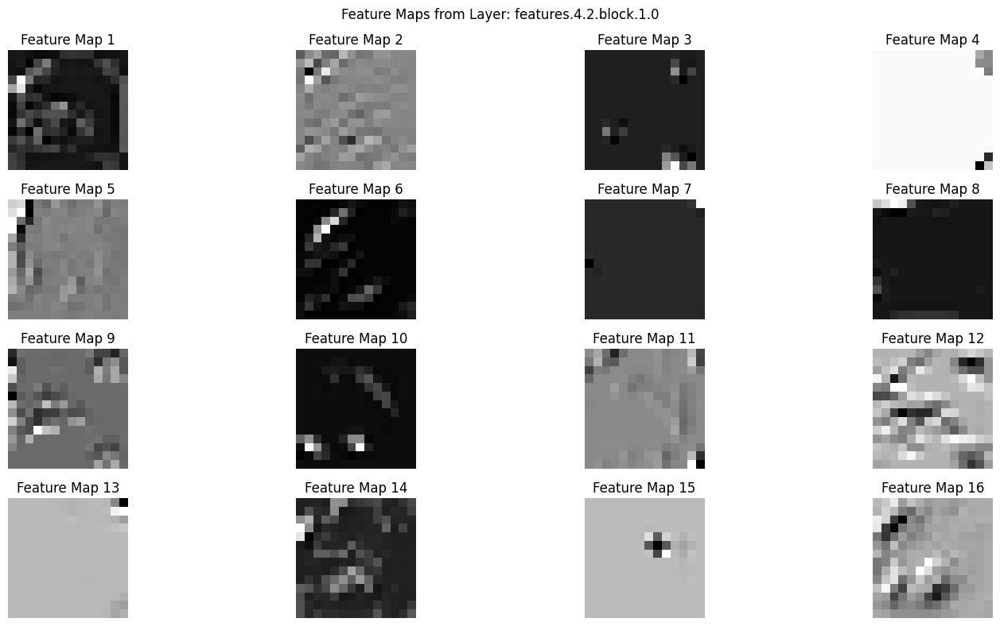

Visualizing Feature Maps for Layer: features.4.2.block.3.0, Shape: torch.Size([112, 14, 14])


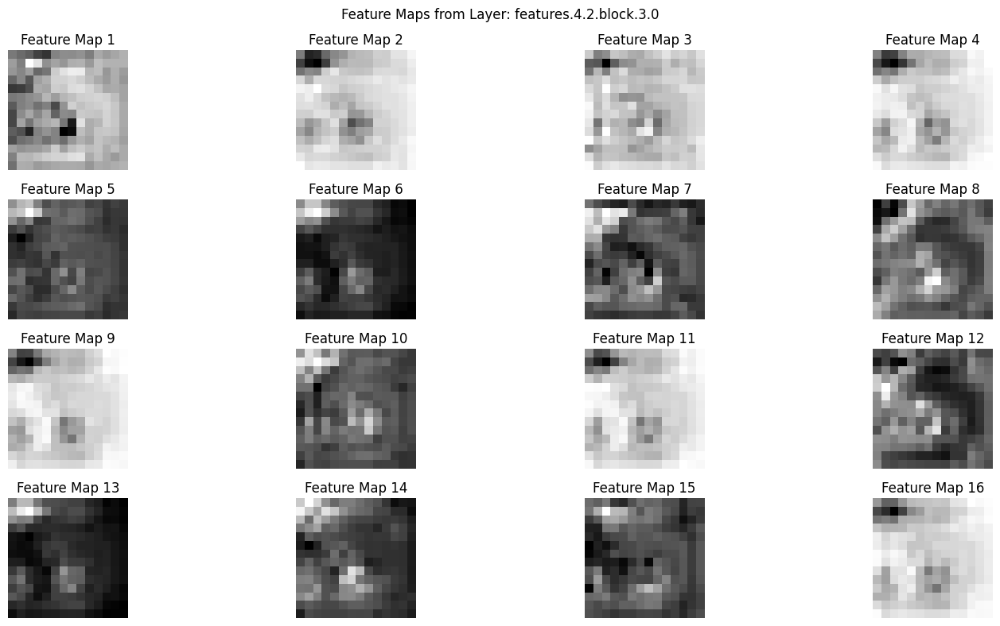

Visualizing Feature Maps for Layer: features.4.3.block.0.0, Shape: torch.Size([672, 14, 14])


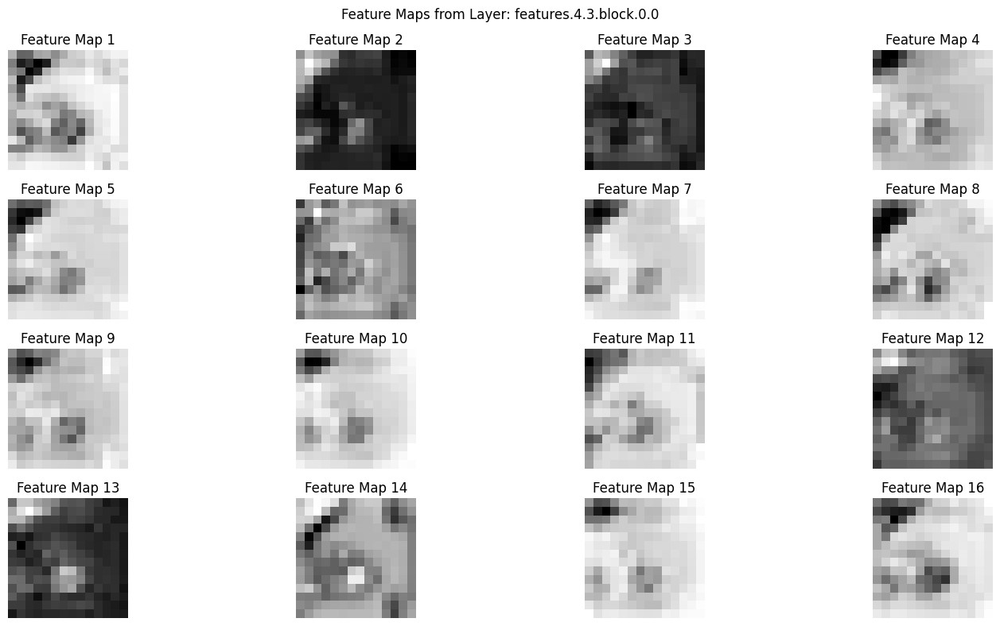

Visualizing Feature Maps for Layer: features.4.3.block.1.0, Shape: torch.Size([672, 14, 14])


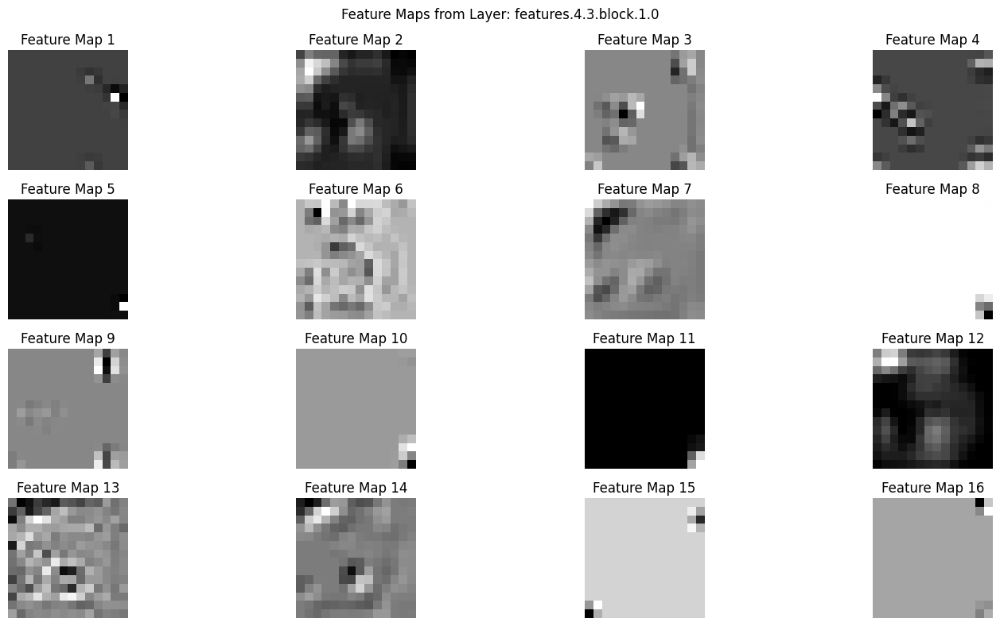

Visualizing Feature Maps for Layer: features.4.3.block.3.0, Shape: torch.Size([112, 14, 14])


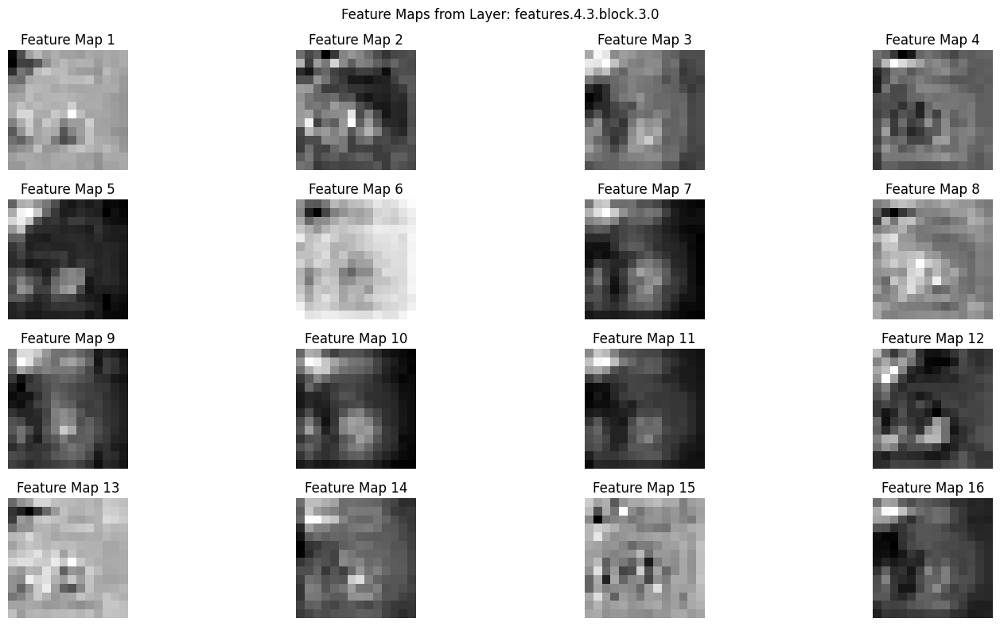

Visualizing Feature Maps for Layer: features.4.4.block.0.0, Shape: torch.Size([672, 14, 14])


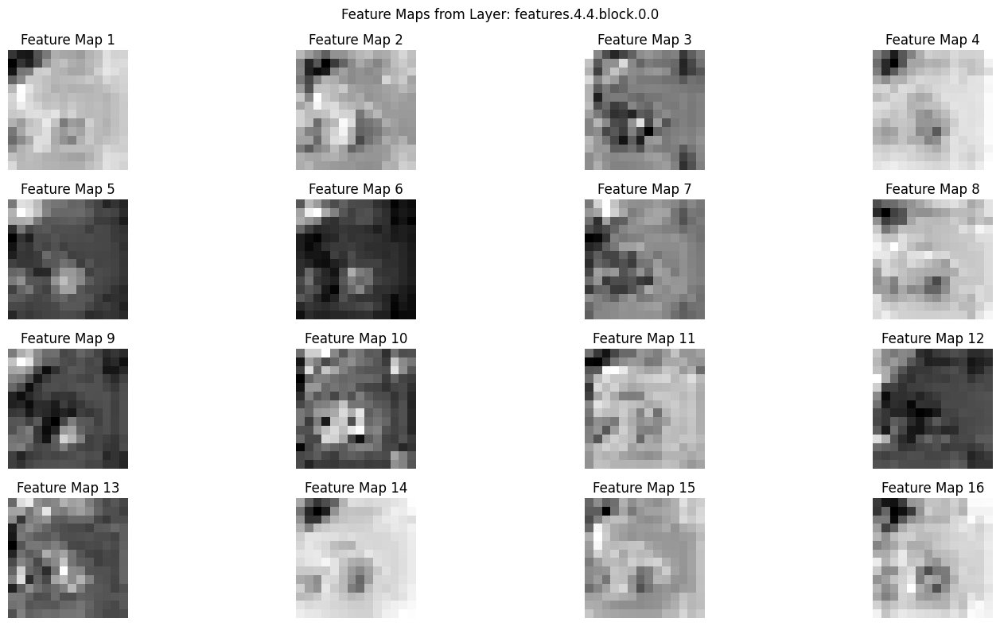

Visualizing Feature Maps for Layer: features.4.4.block.1.0, Shape: torch.Size([672, 14, 14])


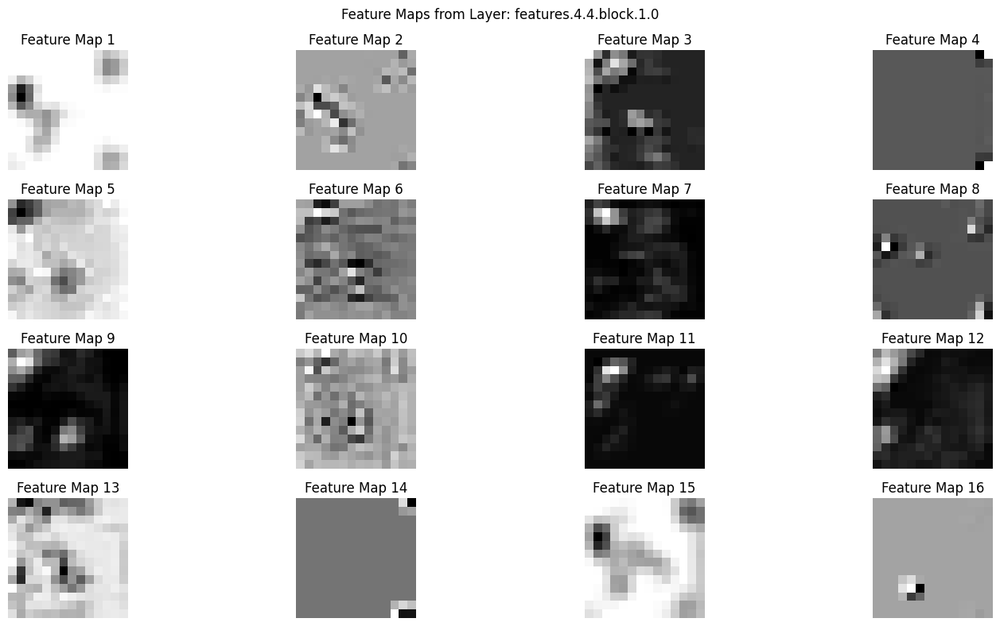

Visualizing Feature Maps for Layer: features.4.4.block.3.0, Shape: torch.Size([112, 14, 14])


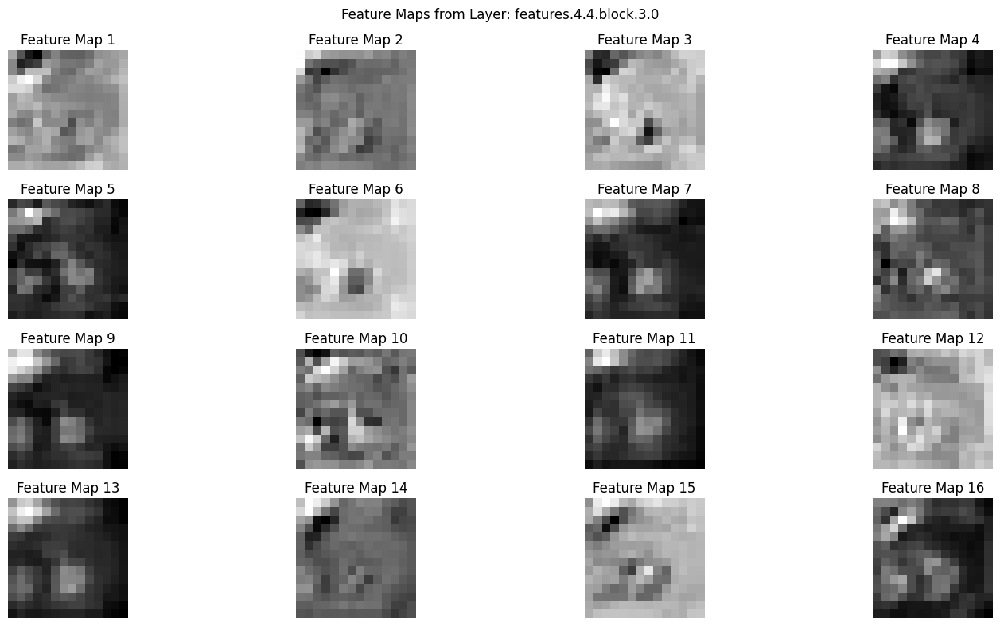

Visualizing Feature Maps for Layer: features.4.5.block.0.0, Shape: torch.Size([672, 14, 14])


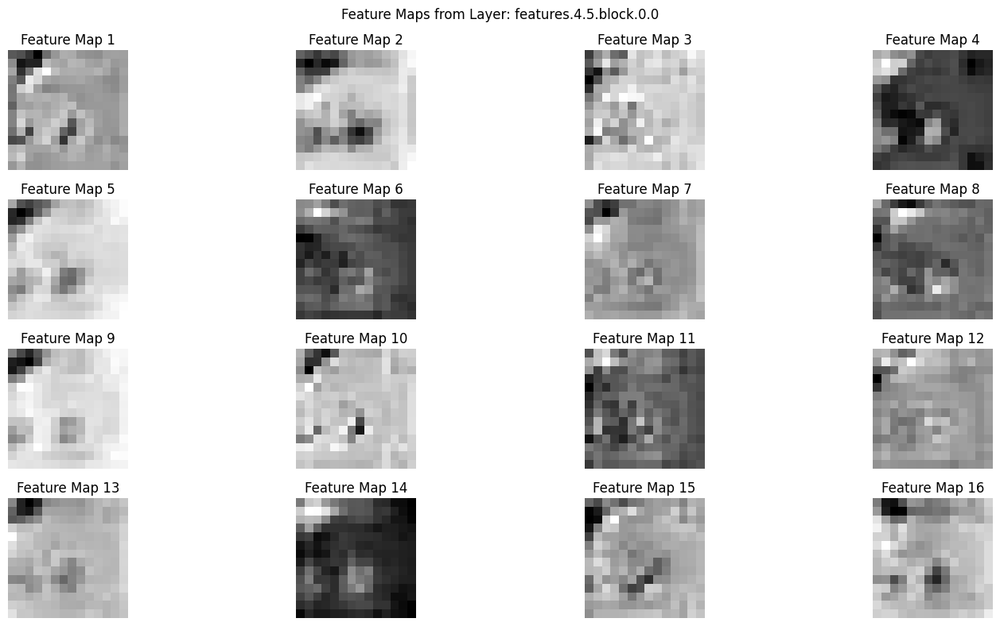

Visualizing Feature Maps for Layer: features.4.5.block.1.0, Shape: torch.Size([672, 14, 14])


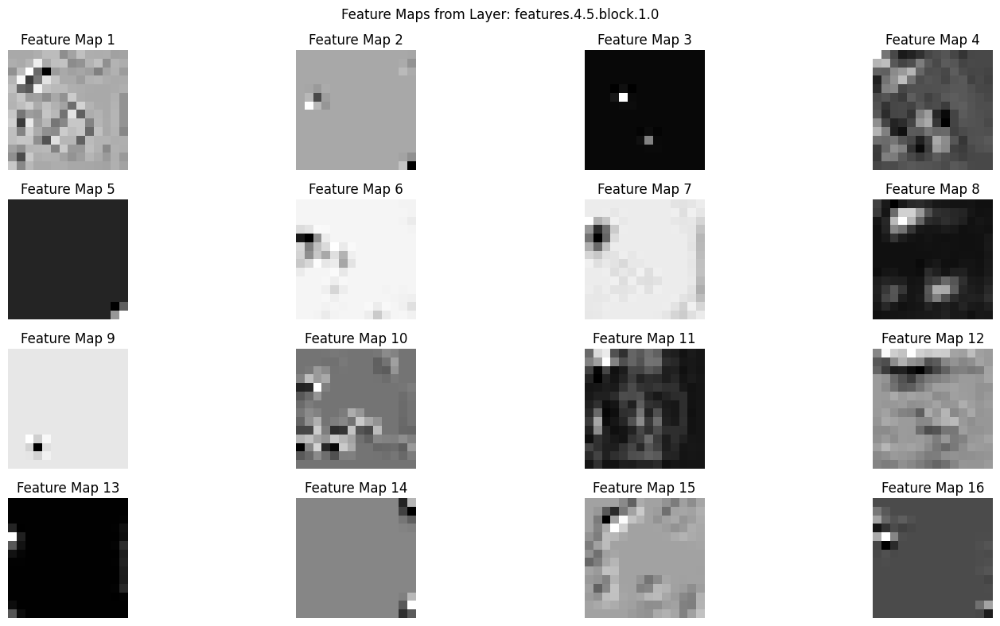

Visualizing Feature Maps for Layer: features.4.5.block.3.0, Shape: torch.Size([112, 14, 14])


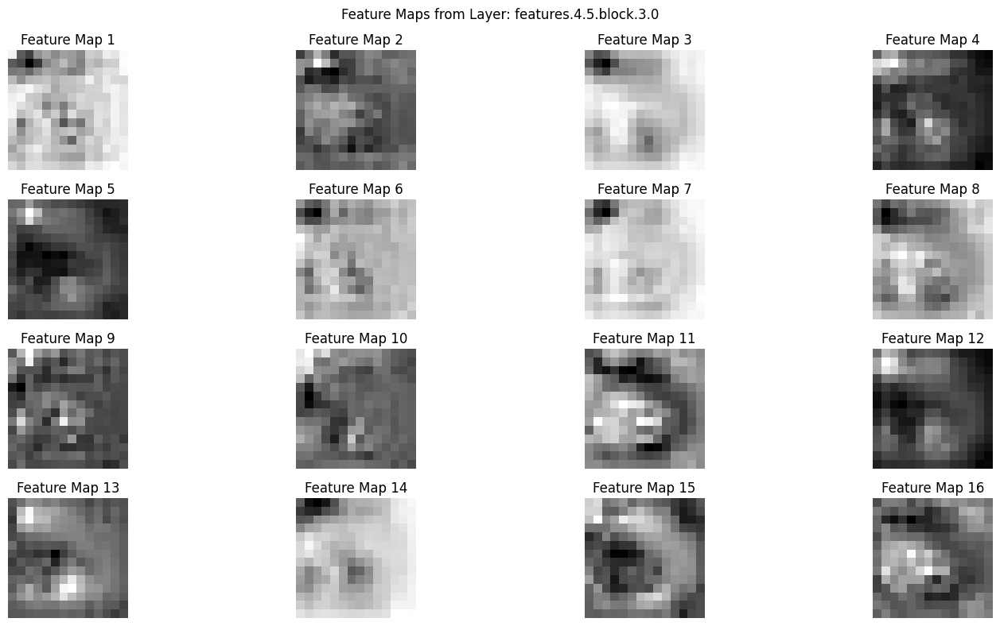

Visualizing Feature Maps for Layer: features.5.0.block.0.0, Shape: torch.Size([672, 14, 14])


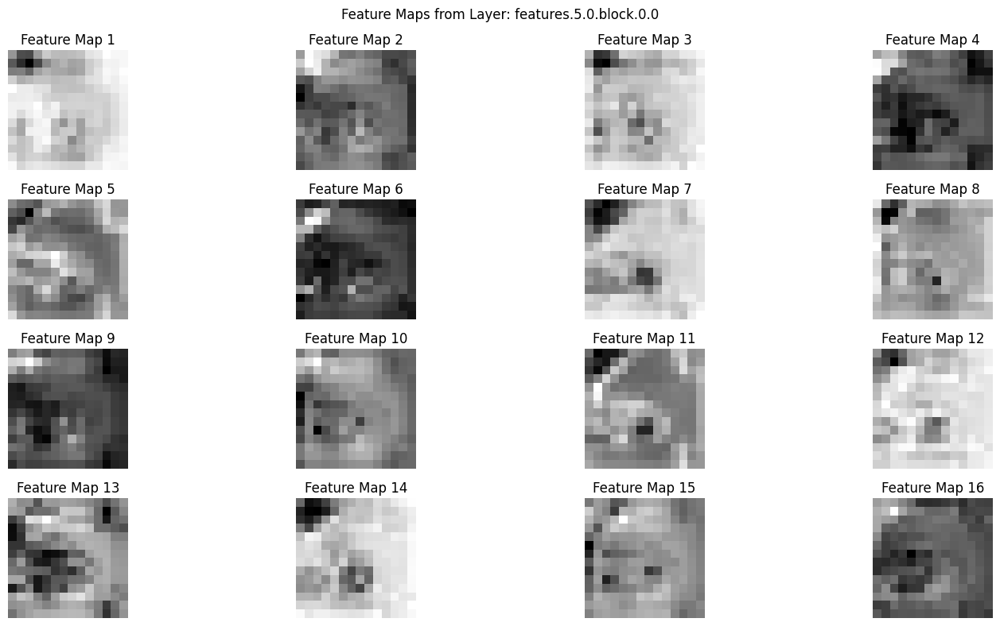

Visualizing Feature Maps for Layer: features.5.0.block.1.0, Shape: torch.Size([672, 14, 14])


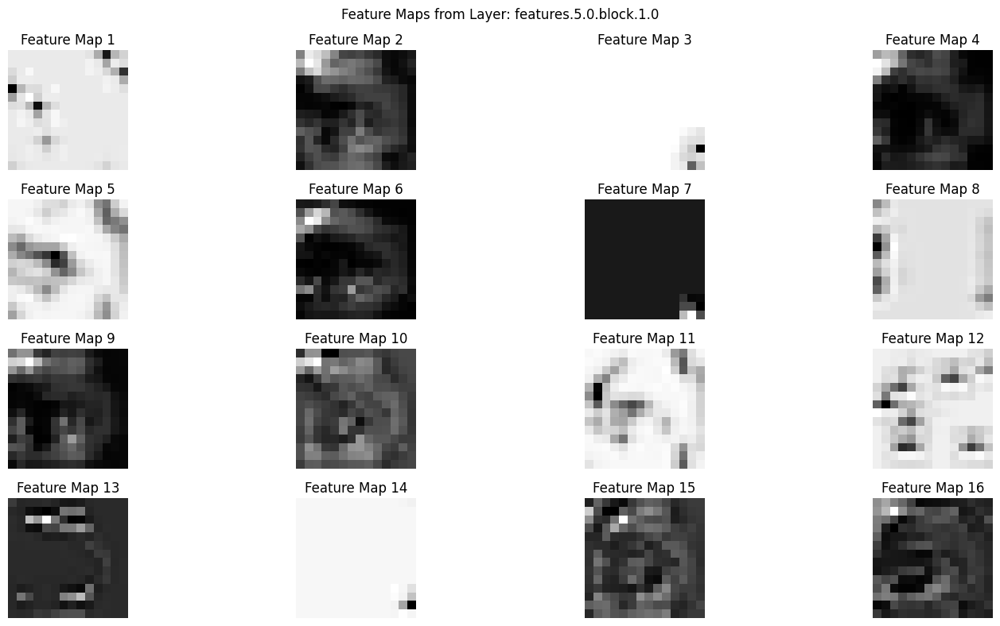

Visualizing Feature Maps for Layer: features.5.0.block.3.0, Shape: torch.Size([160, 14, 14])


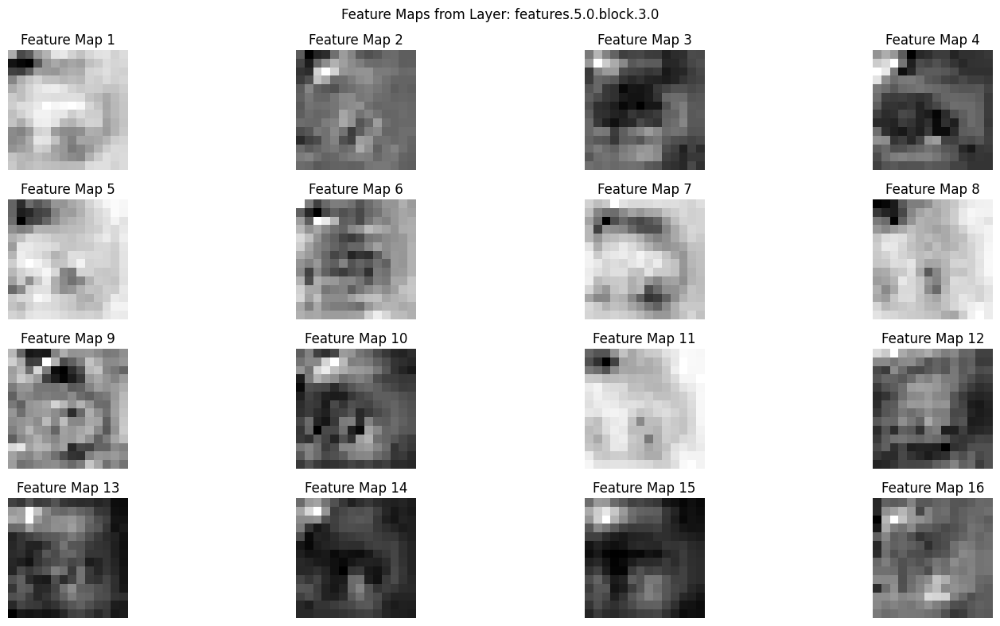

Visualizing Feature Maps for Layer: features.5.1.block.0.0, Shape: torch.Size([960, 14, 14])


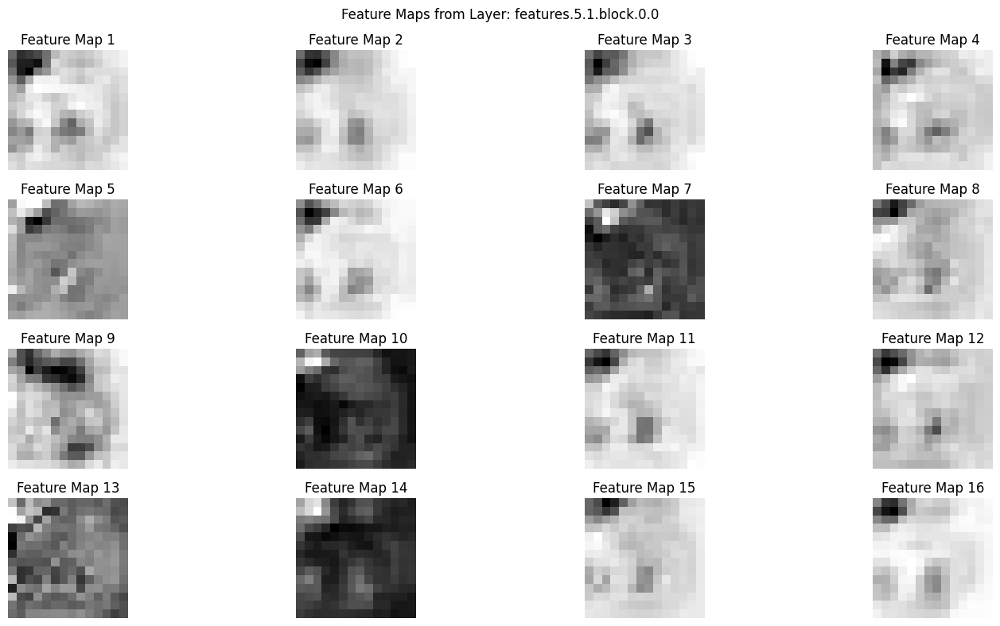

Visualizing Feature Maps for Layer: features.5.1.block.1.0, Shape: torch.Size([960, 14, 14])


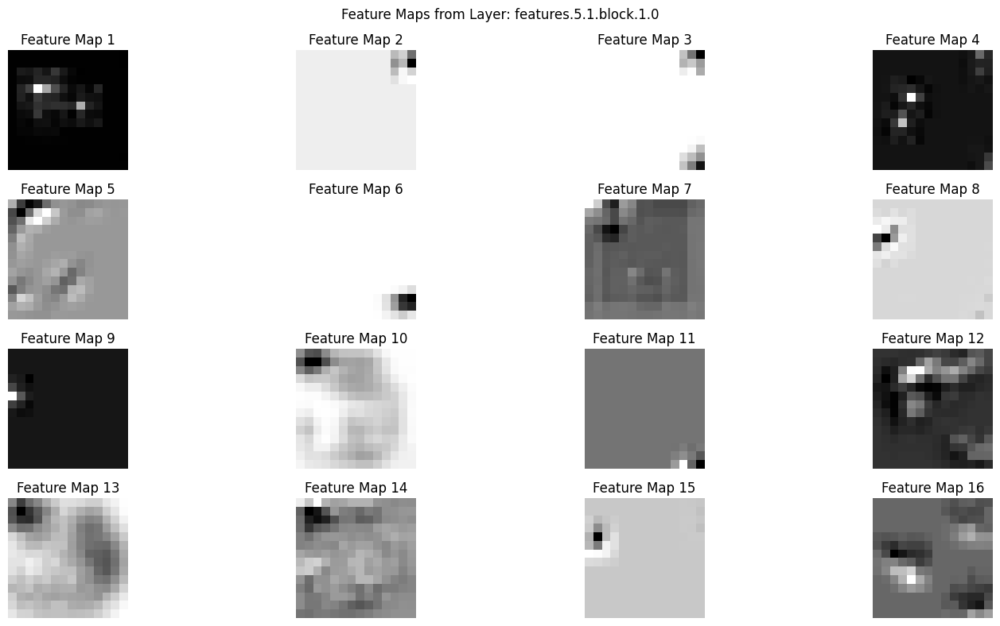

Visualizing Feature Maps for Layer: features.5.1.block.3.0, Shape: torch.Size([160, 14, 14])


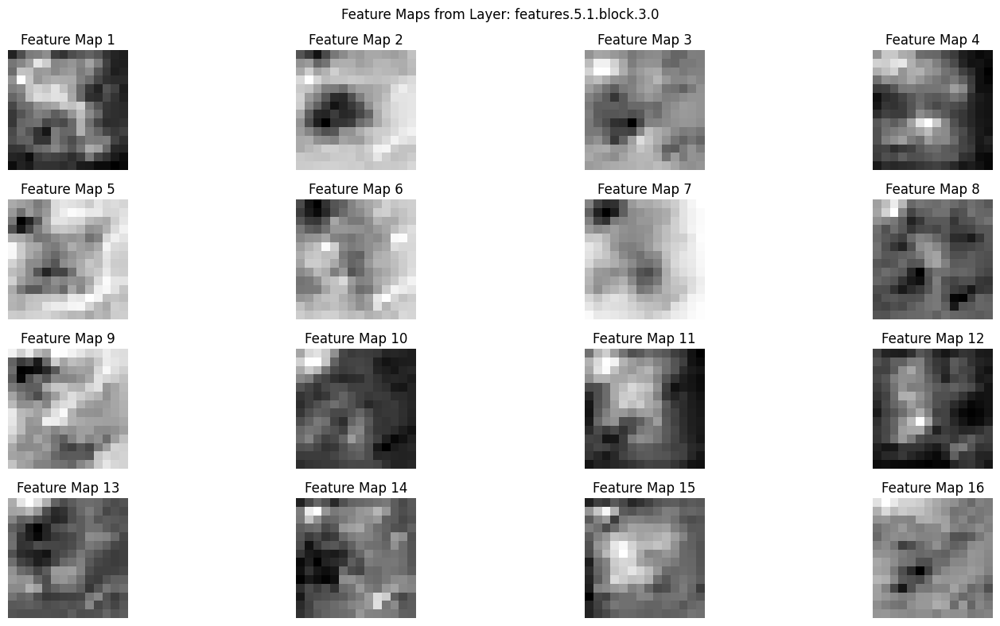

Visualizing Feature Maps for Layer: features.5.2.block.0.0, Shape: torch.Size([960, 14, 14])


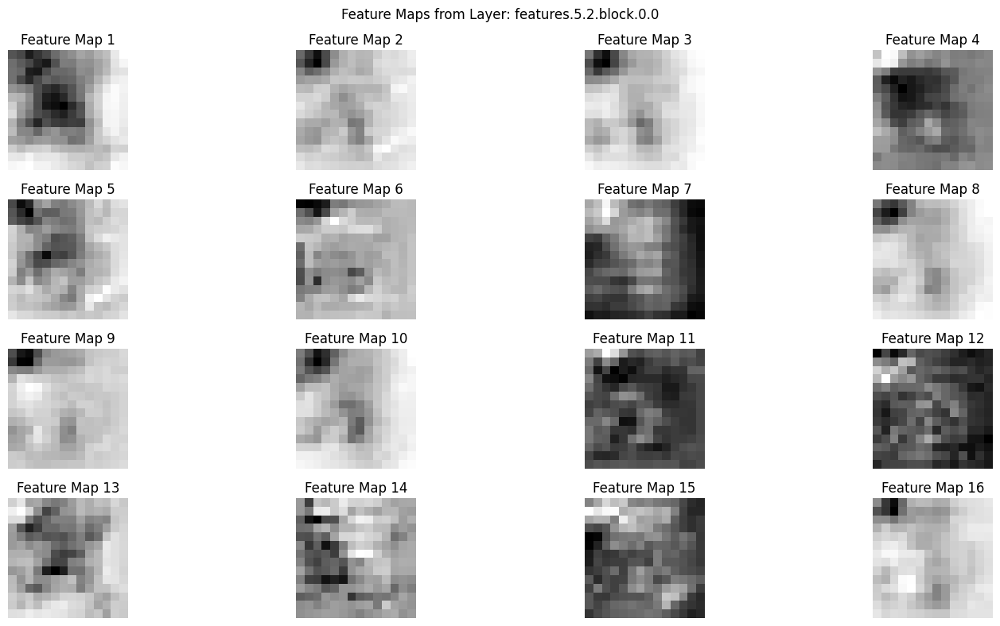

Visualizing Feature Maps for Layer: features.5.2.block.1.0, Shape: torch.Size([960, 14, 14])


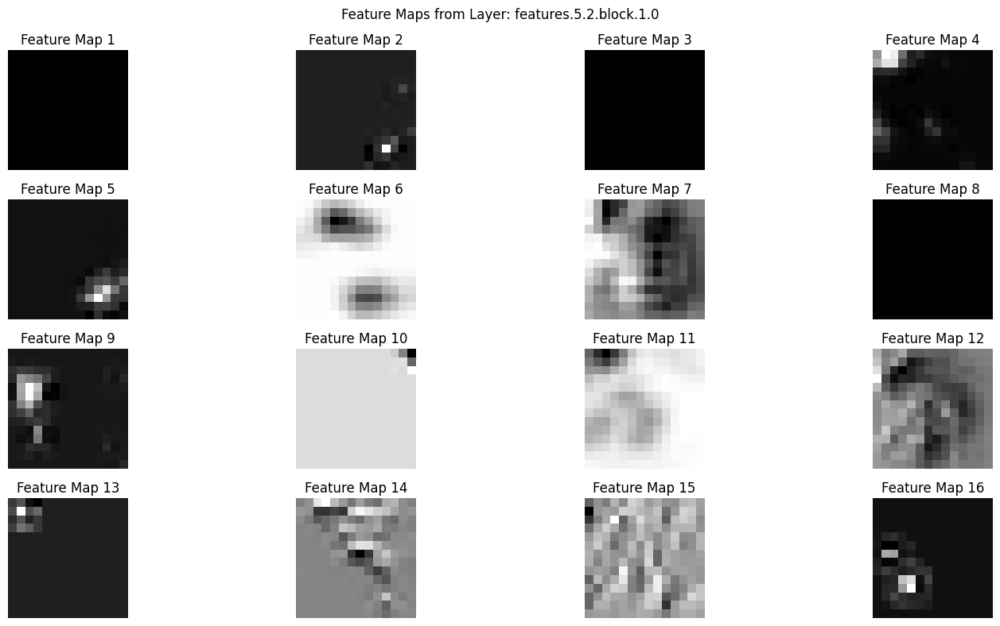

Visualizing Feature Maps for Layer: features.5.2.block.3.0, Shape: torch.Size([160, 14, 14])


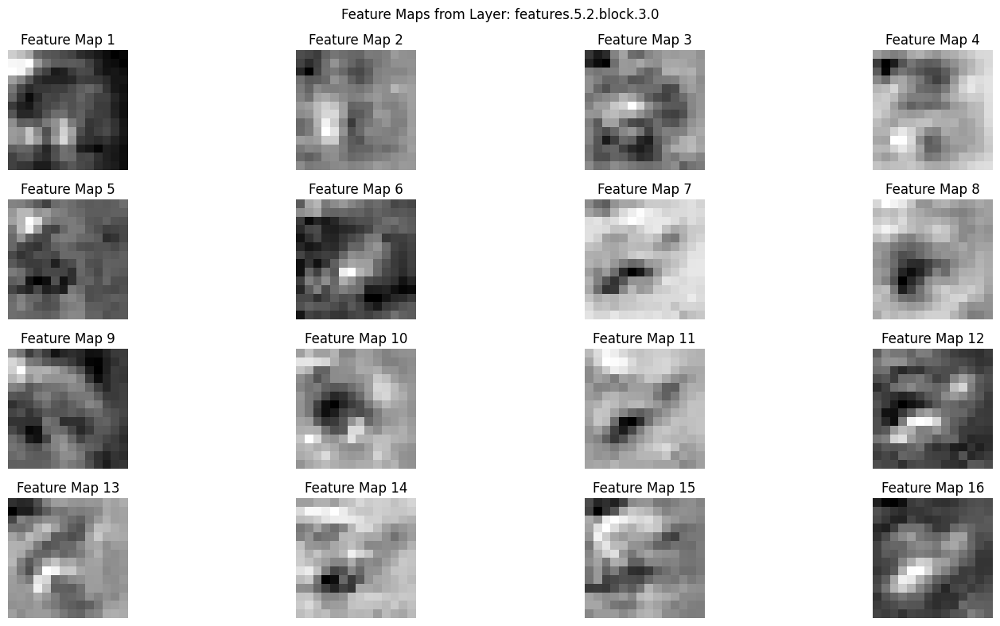

Visualizing Feature Maps for Layer: features.5.3.block.0.0, Shape: torch.Size([960, 14, 14])


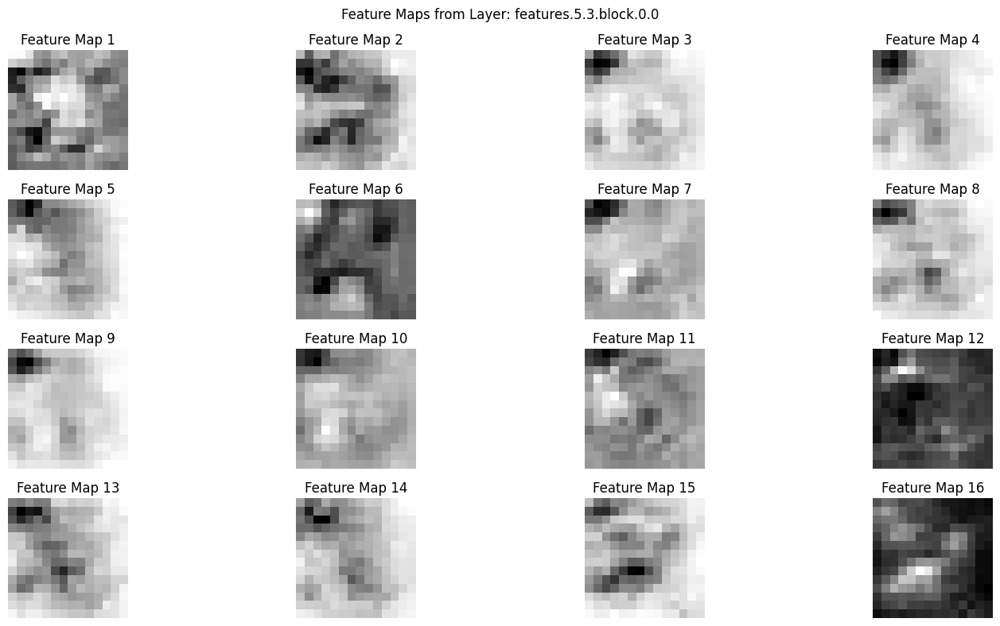

Visualizing Feature Maps for Layer: features.5.3.block.1.0, Shape: torch.Size([960, 14, 14])


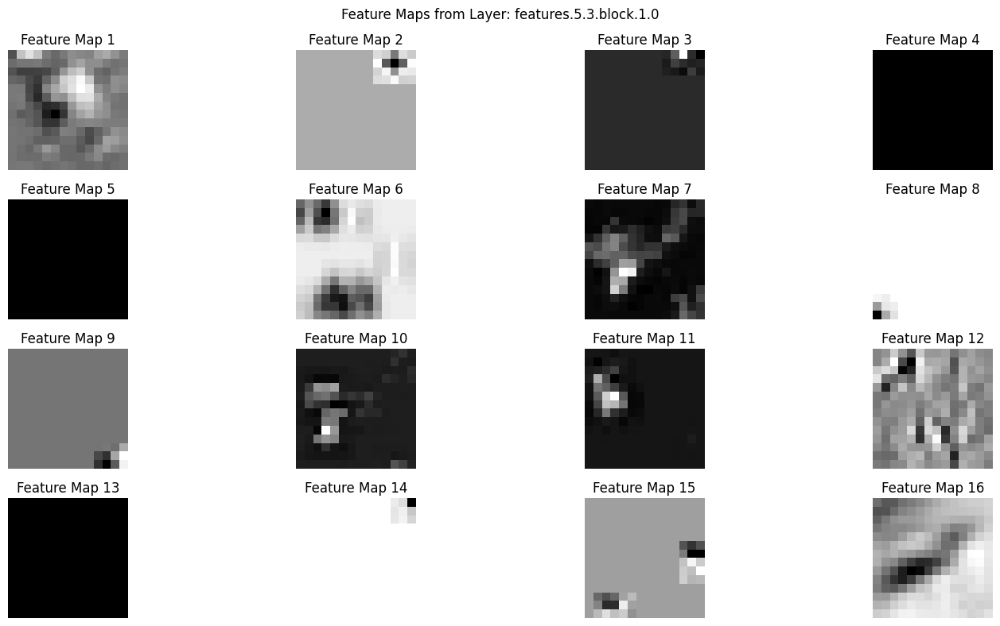

Visualizing Feature Maps for Layer: features.5.3.block.3.0, Shape: torch.Size([160, 14, 14])


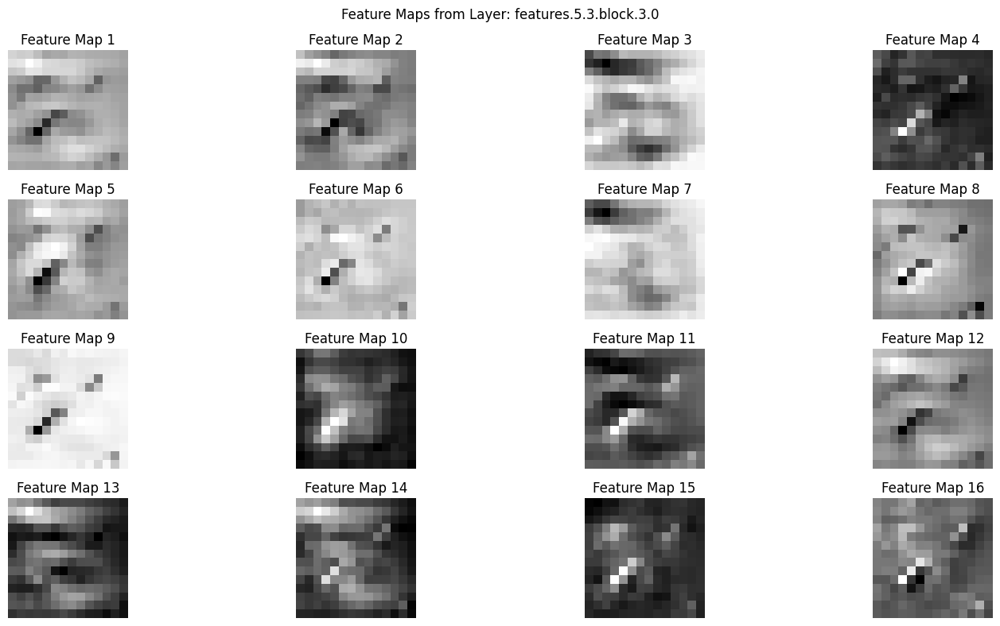

Visualizing Feature Maps for Layer: features.5.4.block.0.0, Shape: torch.Size([960, 14, 14])


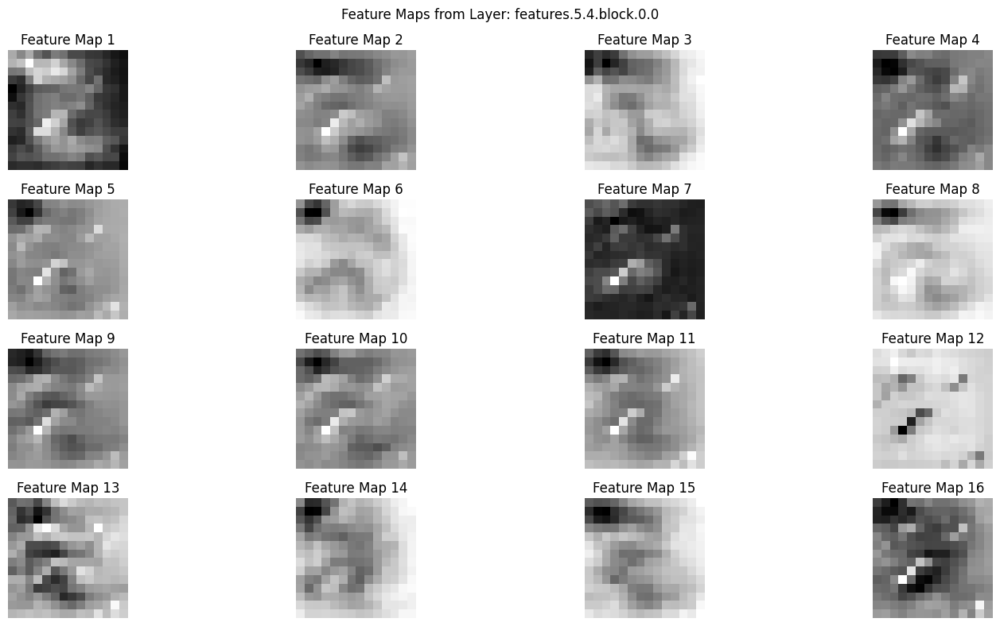

Visualizing Feature Maps for Layer: features.5.4.block.1.0, Shape: torch.Size([960, 14, 14])


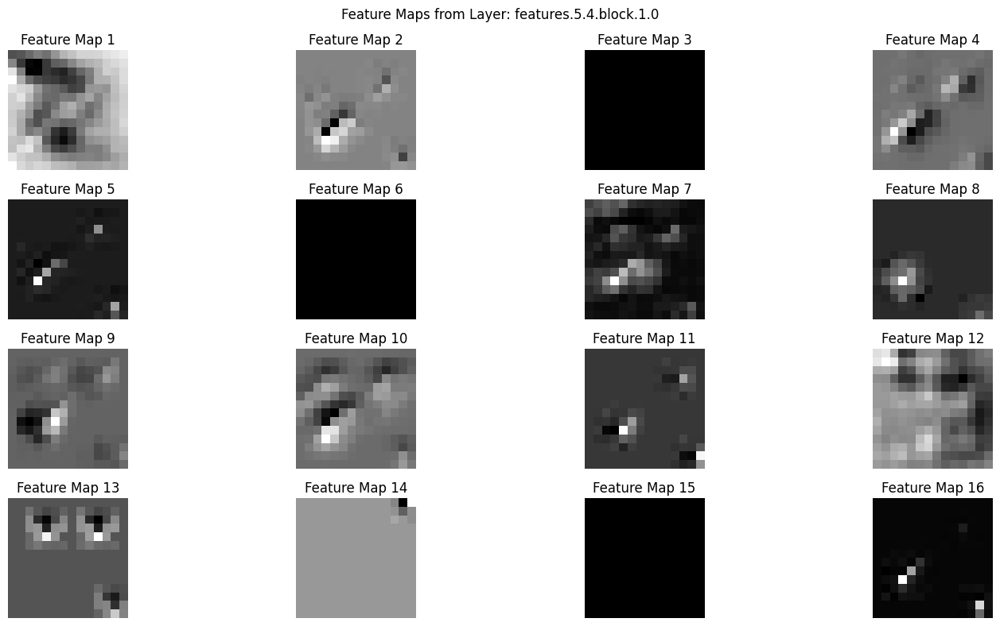

Visualizing Feature Maps for Layer: features.5.4.block.3.0, Shape: torch.Size([160, 14, 14])


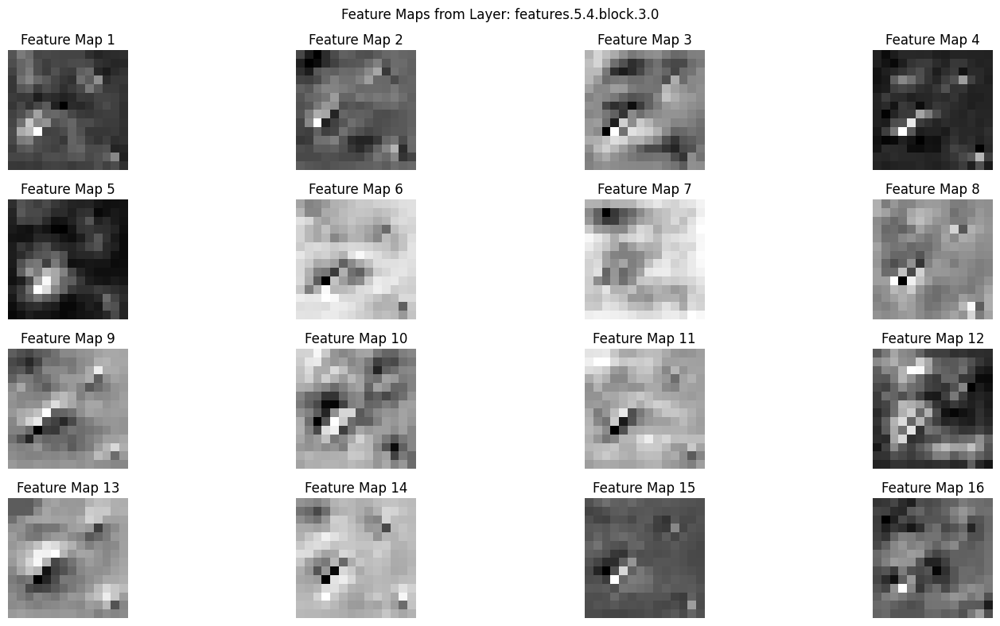

Visualizing Feature Maps for Layer: features.5.5.block.0.0, Shape: torch.Size([960, 14, 14])


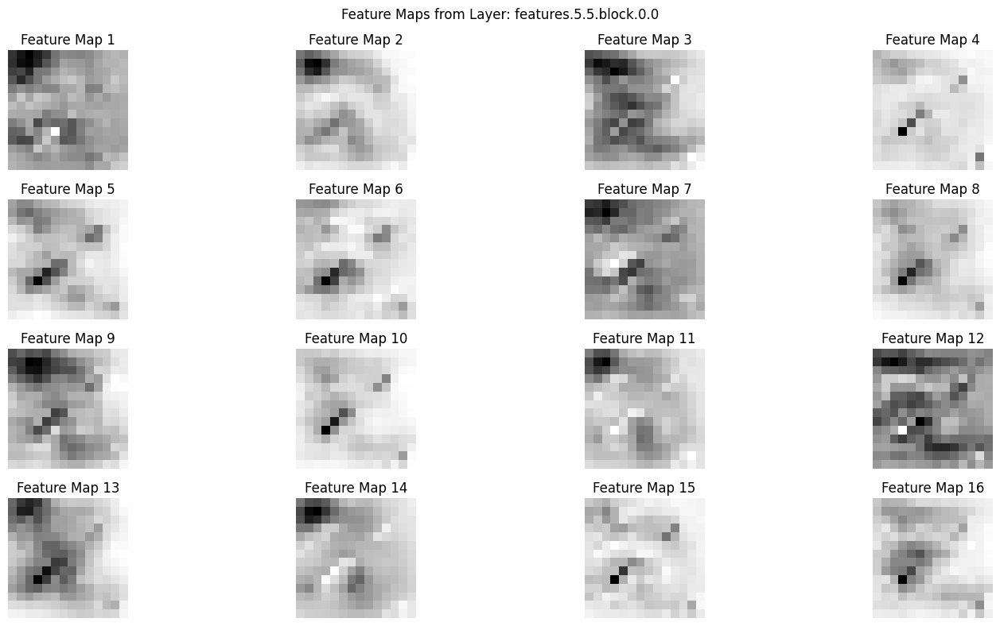

Visualizing Feature Maps for Layer: features.5.5.block.1.0, Shape: torch.Size([960, 14, 14])


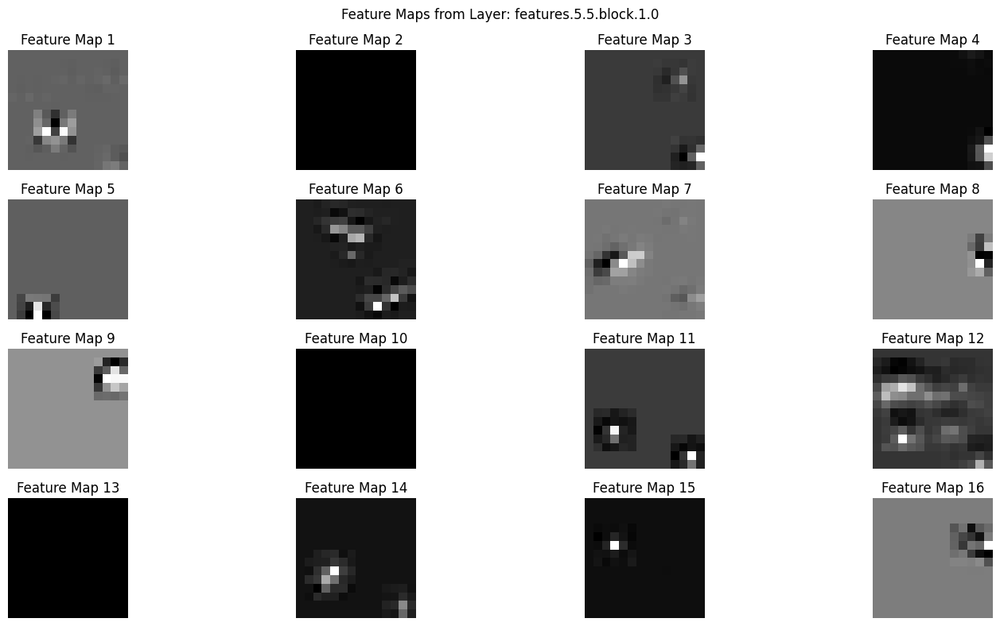

Visualizing Feature Maps for Layer: features.5.5.block.3.0, Shape: torch.Size([160, 14, 14])


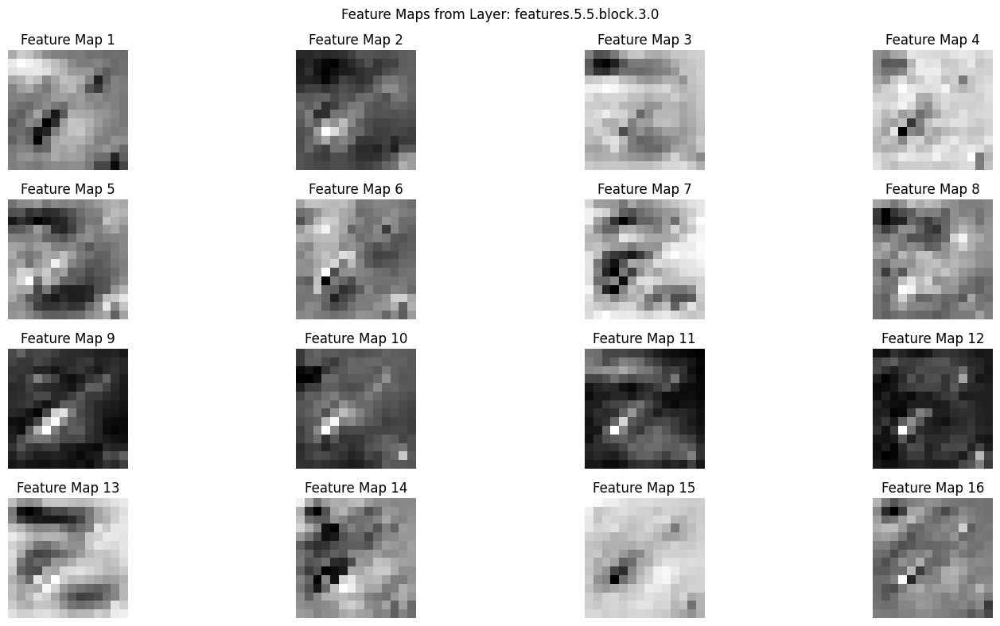

Visualizing Feature Maps for Layer: features.6.0.block.0.0, Shape: torch.Size([960, 14, 14])


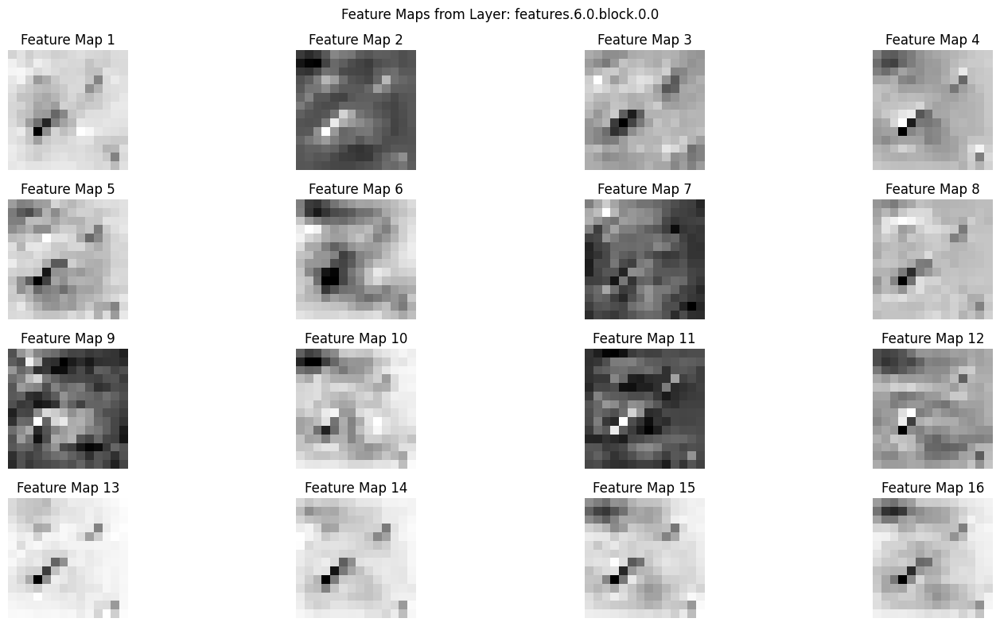

Visualizing Feature Maps for Layer: features.6.0.block.1.0, Shape: torch.Size([960, 7, 7])


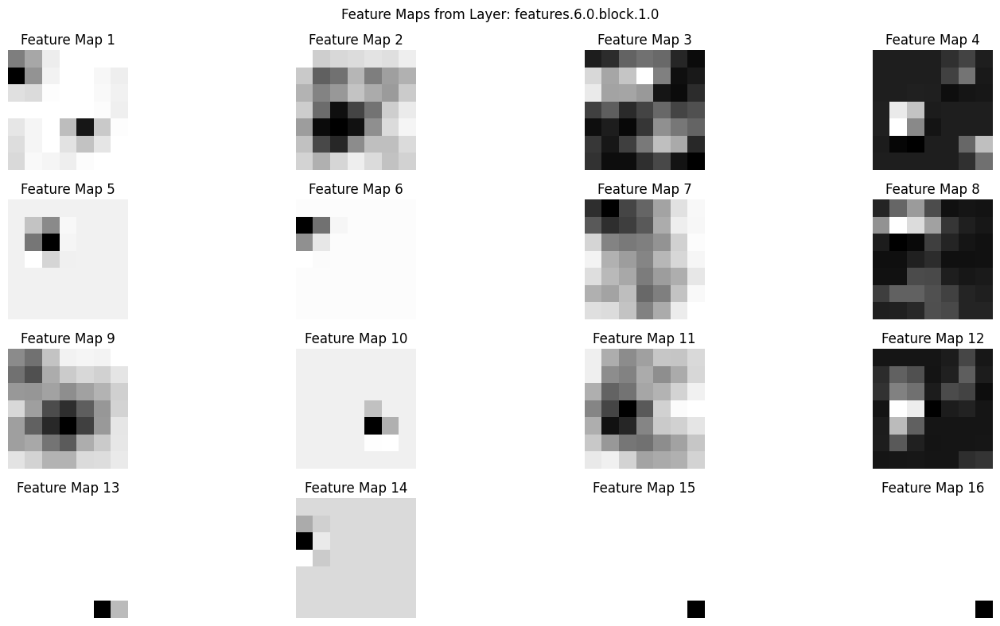

Visualizing Feature Maps for Layer: features.6.0.block.3.0, Shape: torch.Size([272, 7, 7])


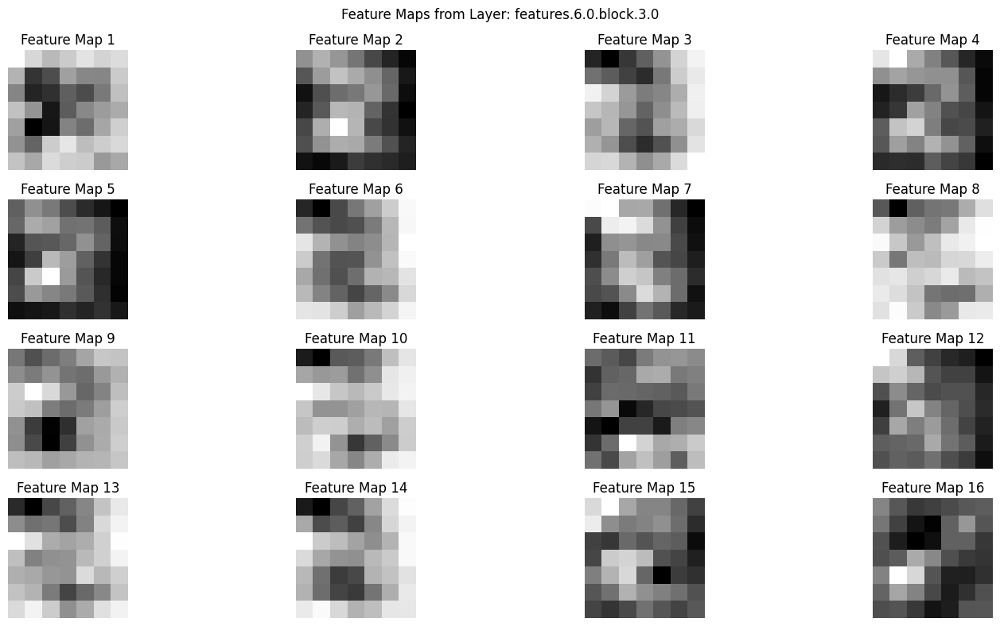

Visualizing Feature Maps for Layer: features.6.1.block.0.0, Shape: torch.Size([1632, 7, 7])


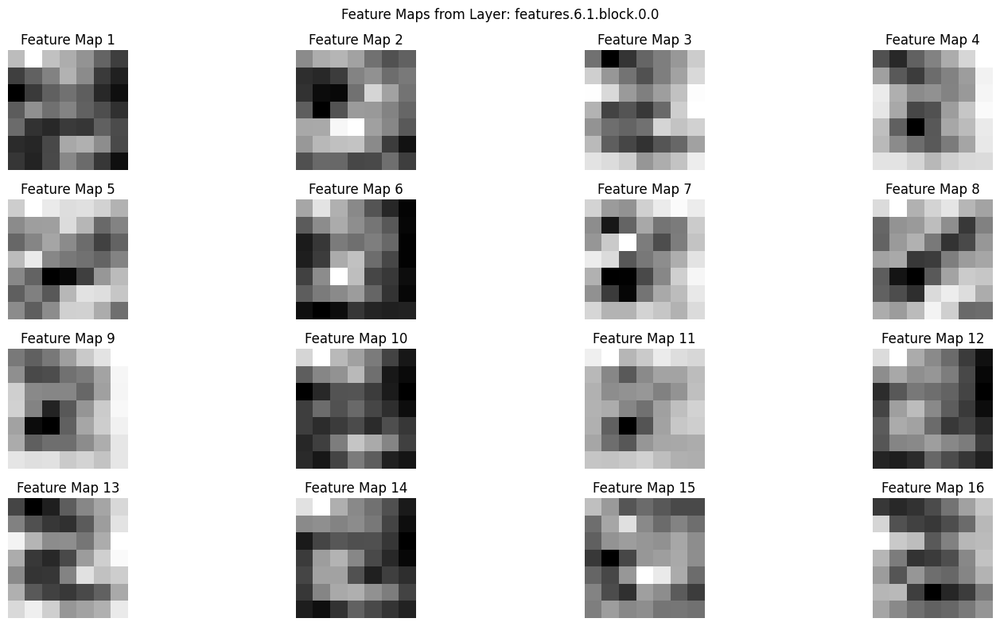

Visualizing Feature Maps for Layer: features.6.1.block.1.0, Shape: torch.Size([1632, 7, 7])


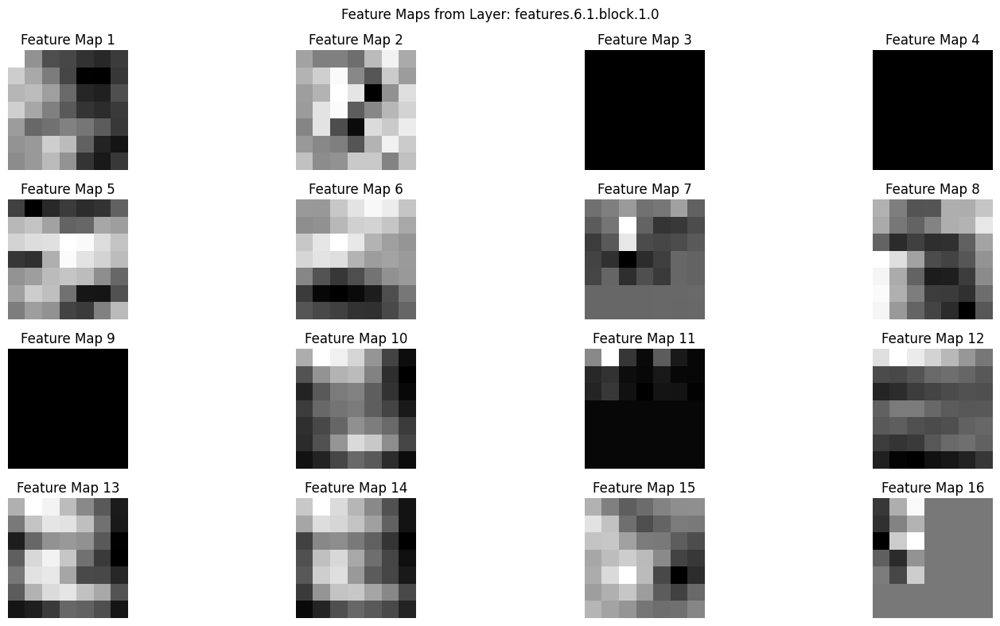

Visualizing Feature Maps for Layer: features.6.1.block.3.0, Shape: torch.Size([272, 7, 7])


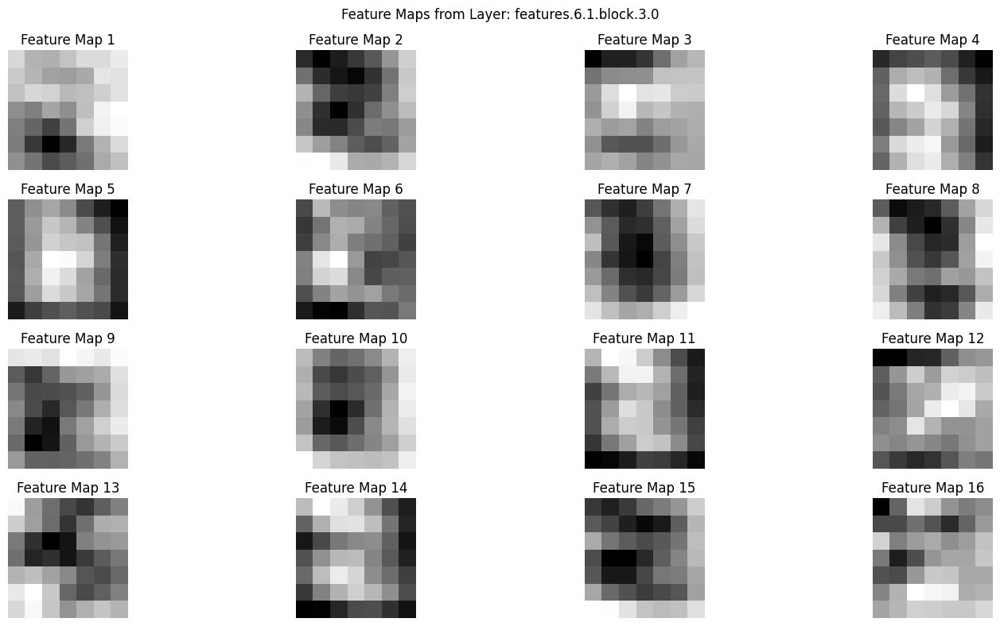

Visualizing Feature Maps for Layer: features.6.2.block.0.0, Shape: torch.Size([1632, 7, 7])


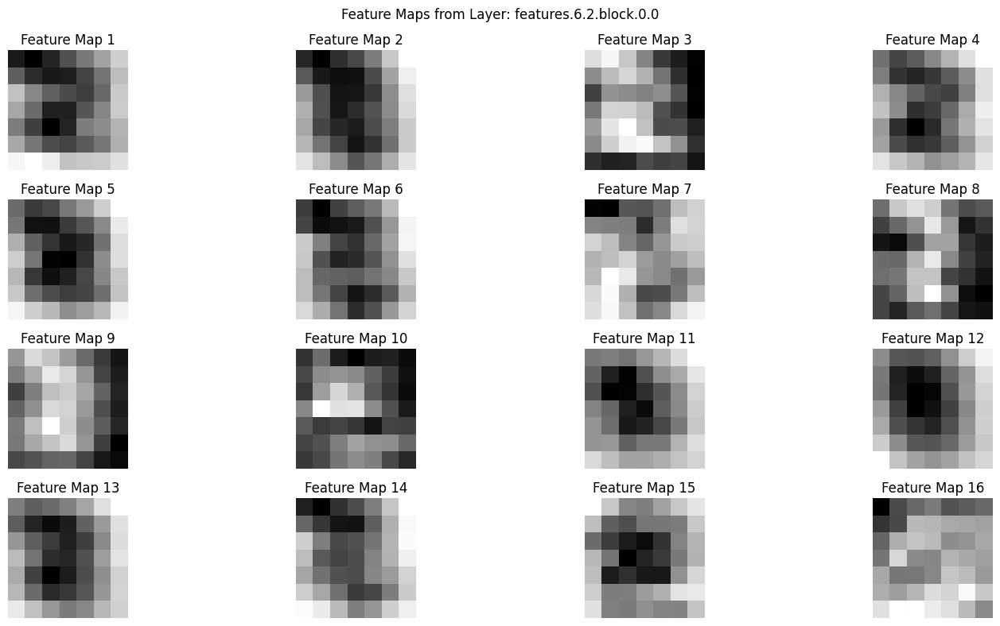

Visualizing Feature Maps for Layer: features.6.2.block.1.0, Shape: torch.Size([1632, 7, 7])


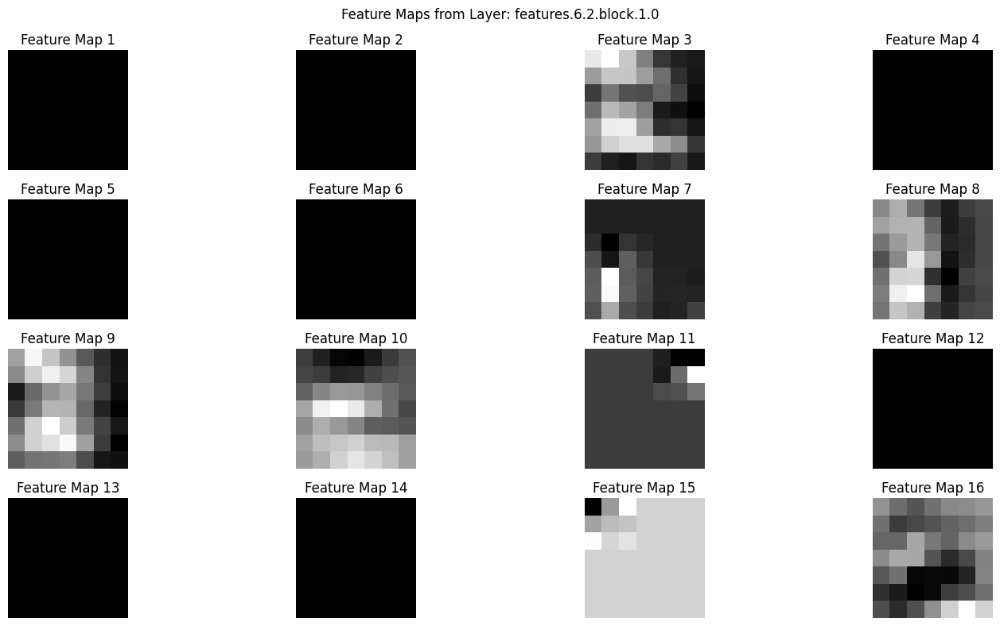

Visualizing Feature Maps for Layer: features.6.2.block.3.0, Shape: torch.Size([272, 7, 7])


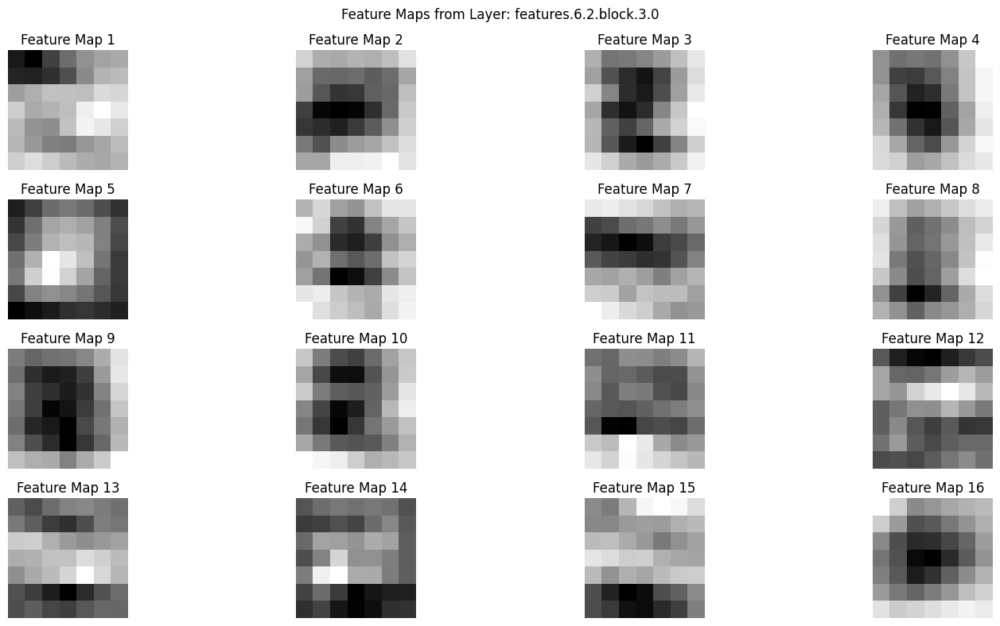

Visualizing Feature Maps for Layer: features.6.3.block.0.0, Shape: torch.Size([1632, 7, 7])


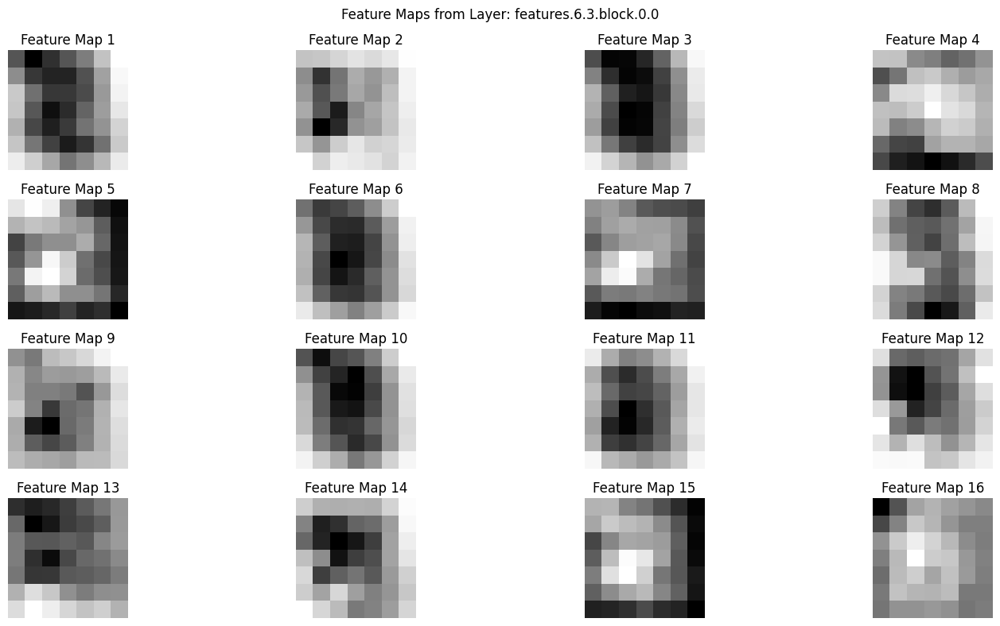

Visualizing Feature Maps for Layer: features.6.3.block.1.0, Shape: torch.Size([1632, 7, 7])


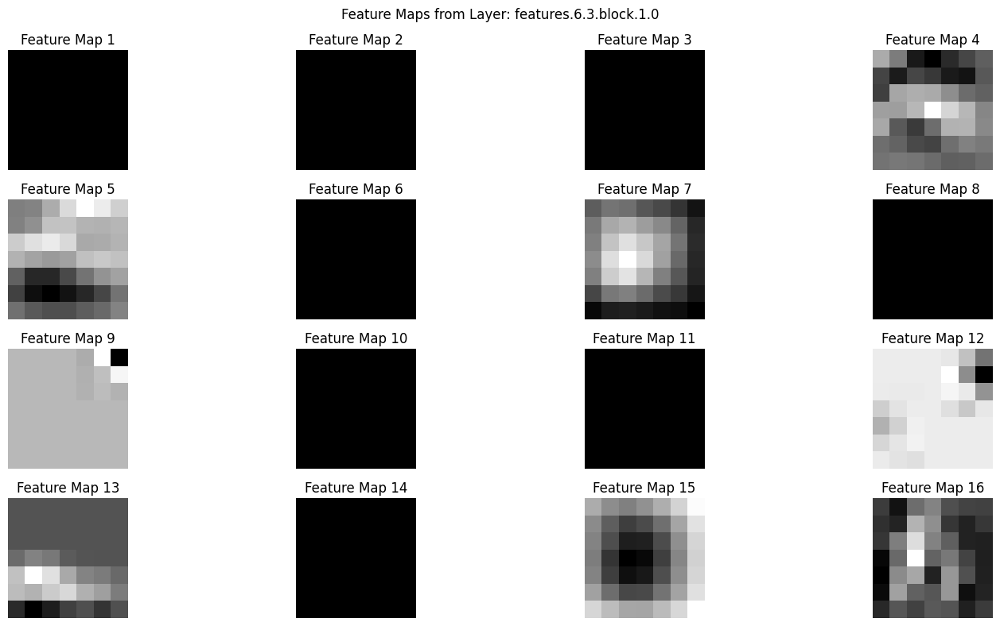

Visualizing Feature Maps for Layer: features.6.3.block.3.0, Shape: torch.Size([272, 7, 7])


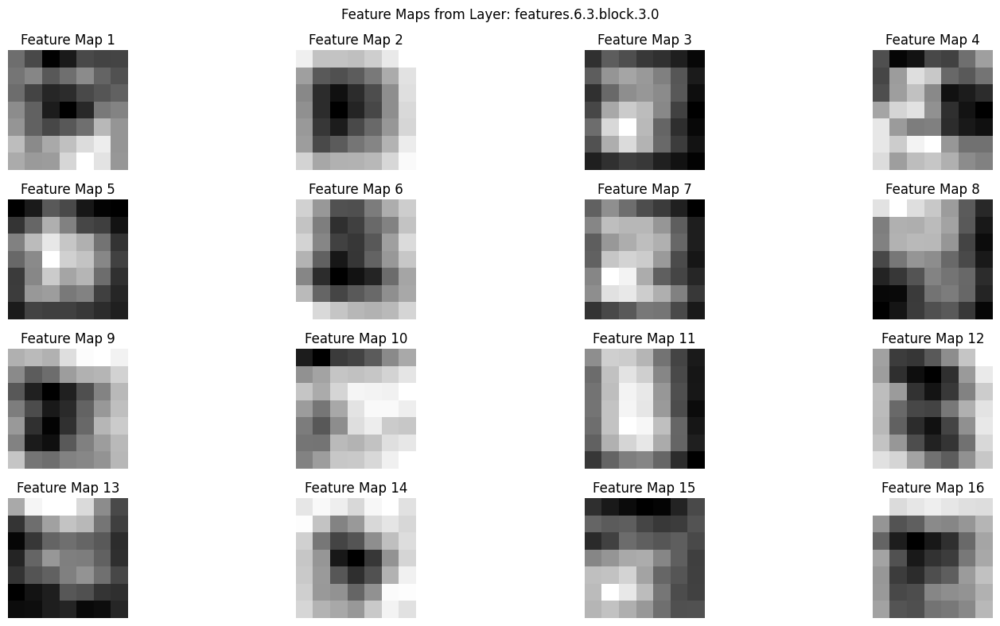

Visualizing Feature Maps for Layer: features.6.4.block.0.0, Shape: torch.Size([1632, 7, 7])


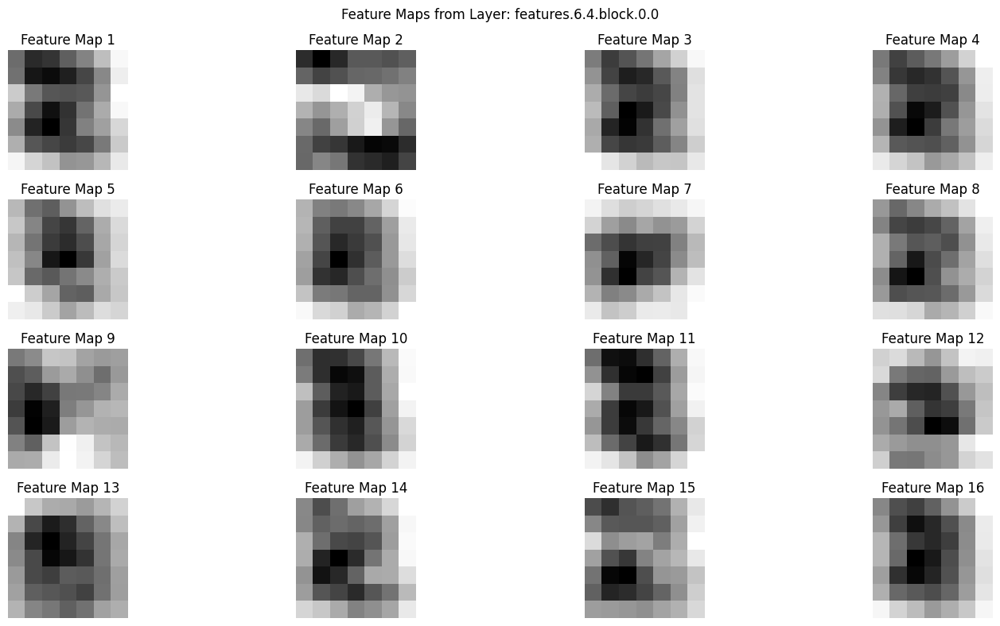

Visualizing Feature Maps for Layer: features.6.4.block.1.0, Shape: torch.Size([1632, 7, 7])


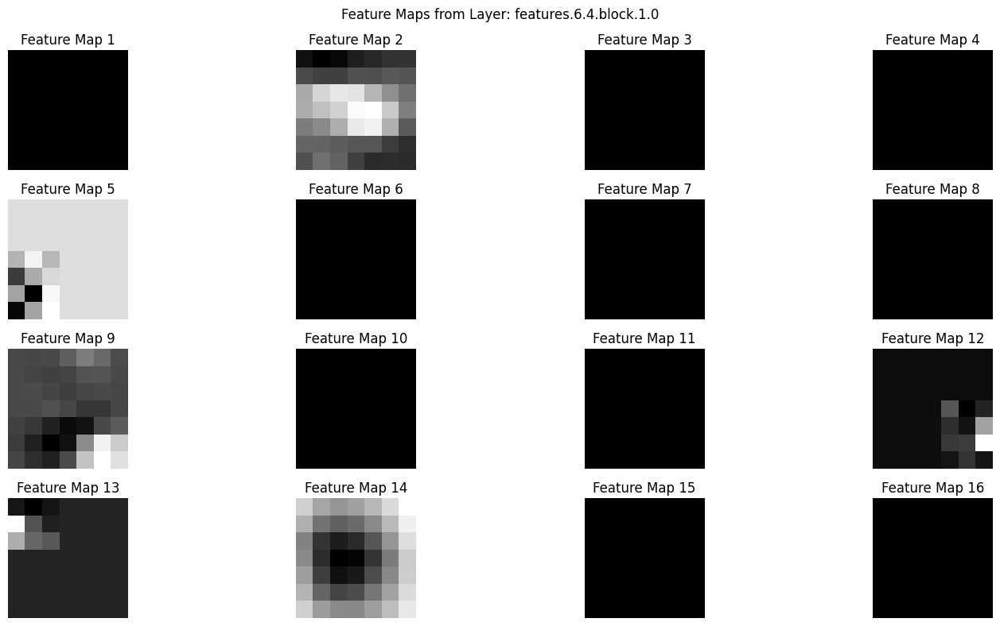

Visualizing Feature Maps for Layer: features.6.4.block.3.0, Shape: torch.Size([272, 7, 7])


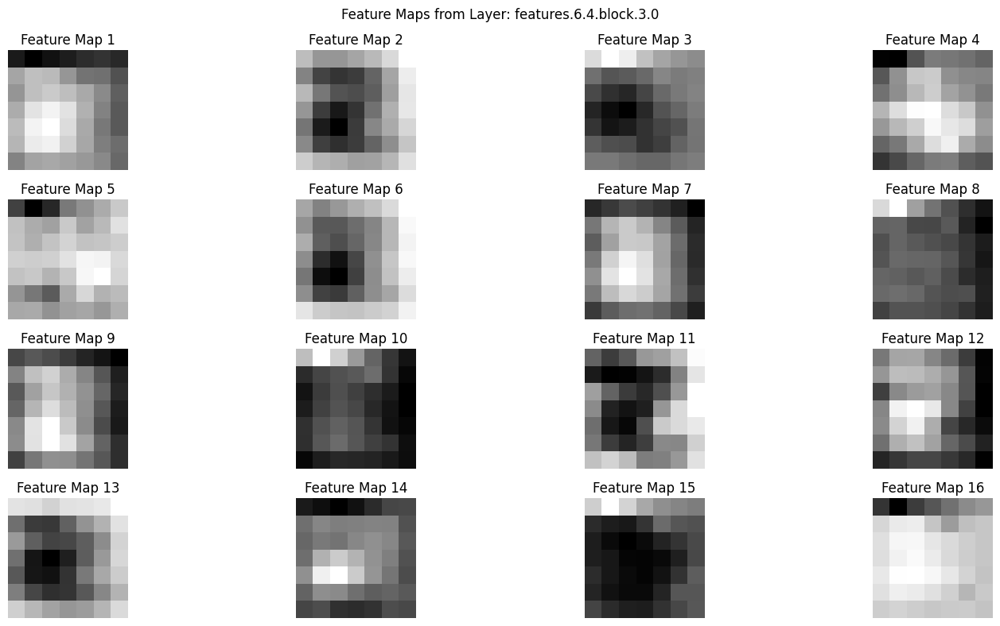

Visualizing Feature Maps for Layer: features.6.5.block.0.0, Shape: torch.Size([1632, 7, 7])


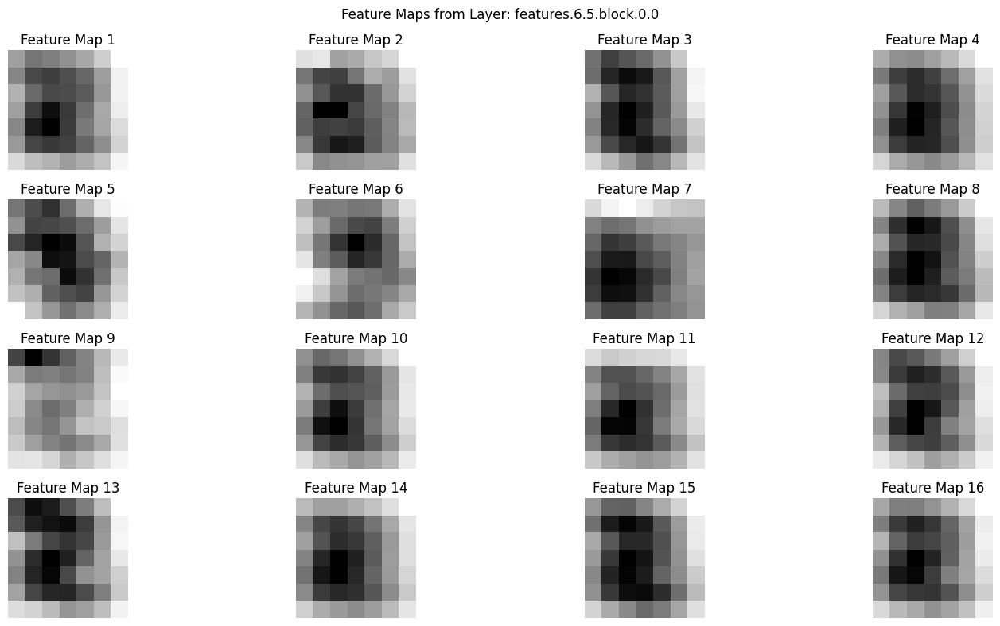

Visualizing Feature Maps for Layer: features.6.5.block.1.0, Shape: torch.Size([1632, 7, 7])


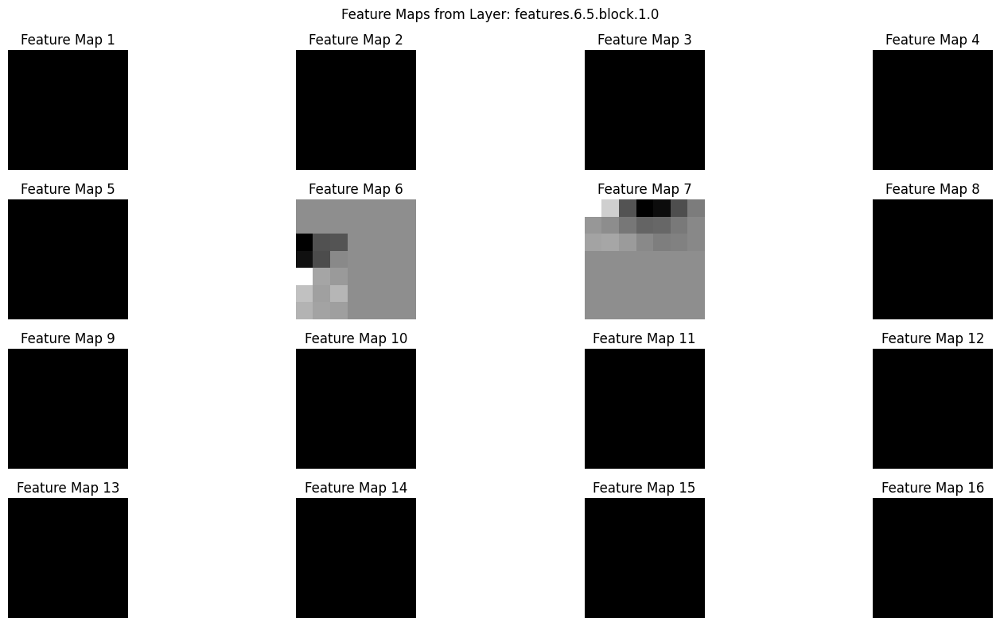

Visualizing Feature Maps for Layer: features.6.5.block.3.0, Shape: torch.Size([272, 7, 7])


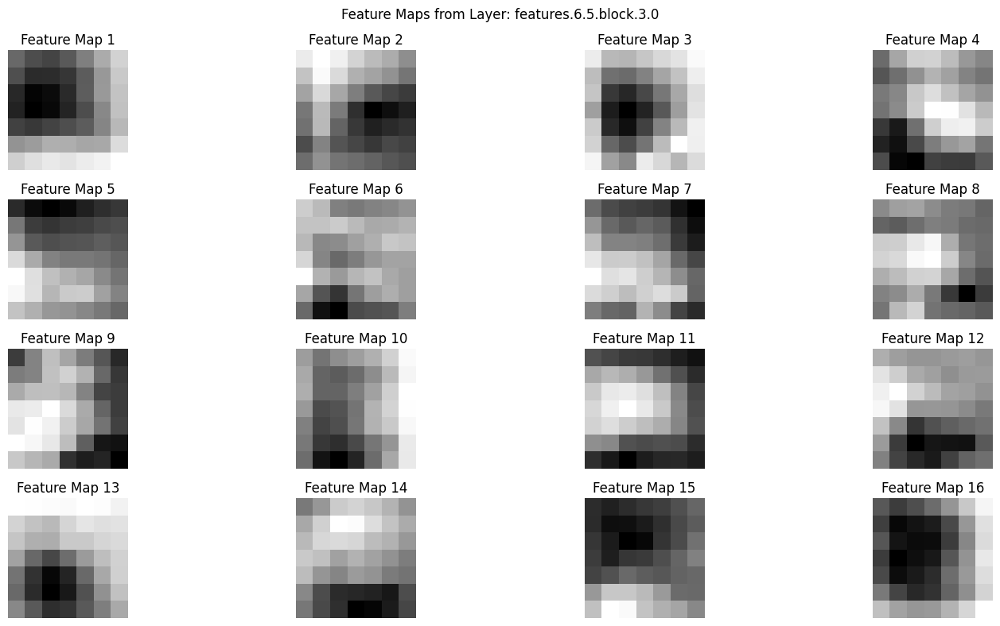

Visualizing Feature Maps for Layer: features.6.6.block.0.0, Shape: torch.Size([1632, 7, 7])


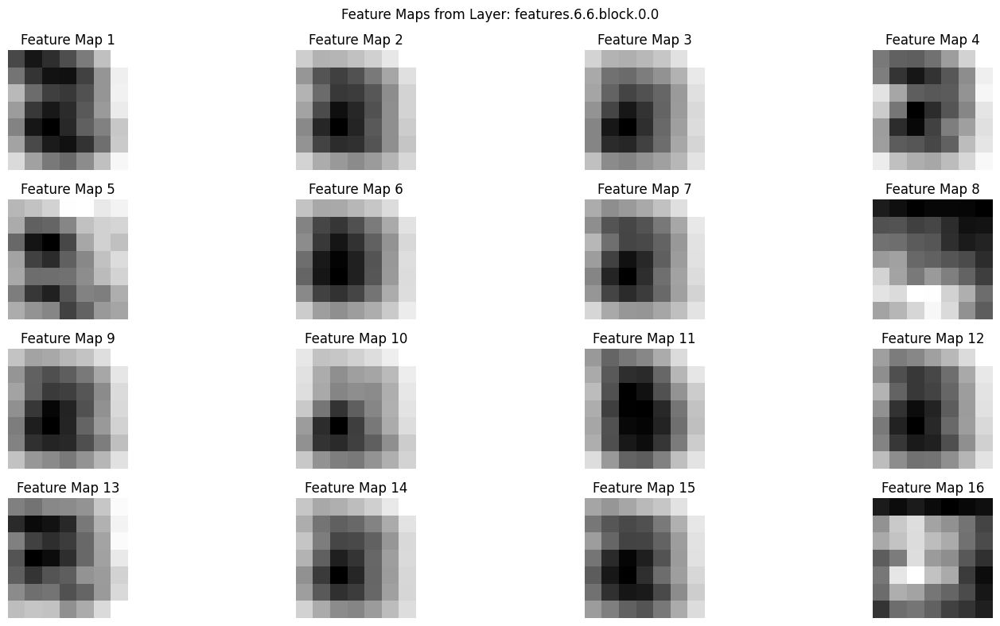

Visualizing Feature Maps for Layer: features.6.6.block.1.0, Shape: torch.Size([1632, 7, 7])


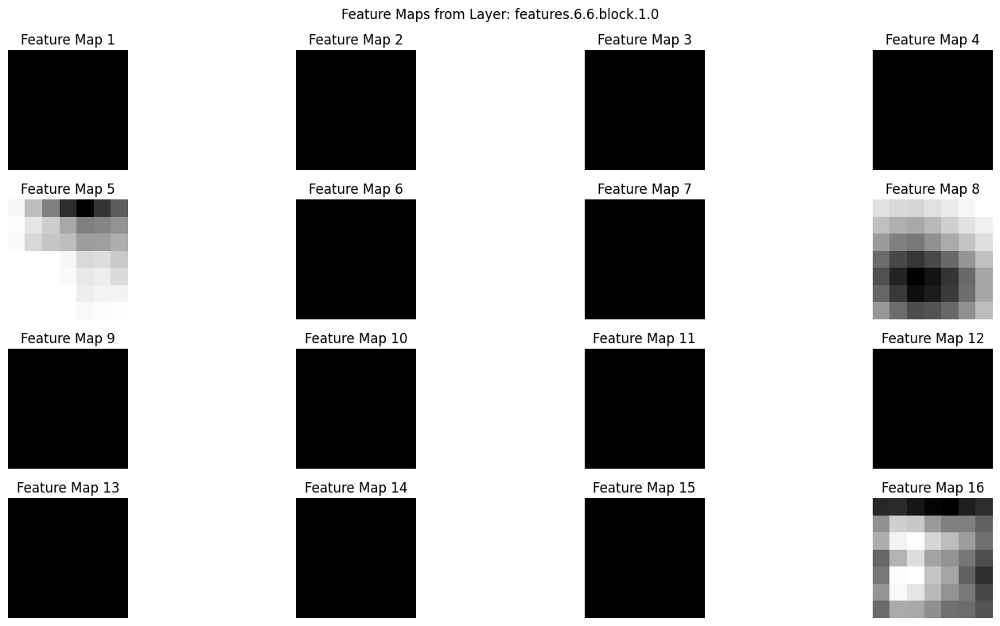

Visualizing Feature Maps for Layer: features.6.6.block.3.0, Shape: torch.Size([272, 7, 7])


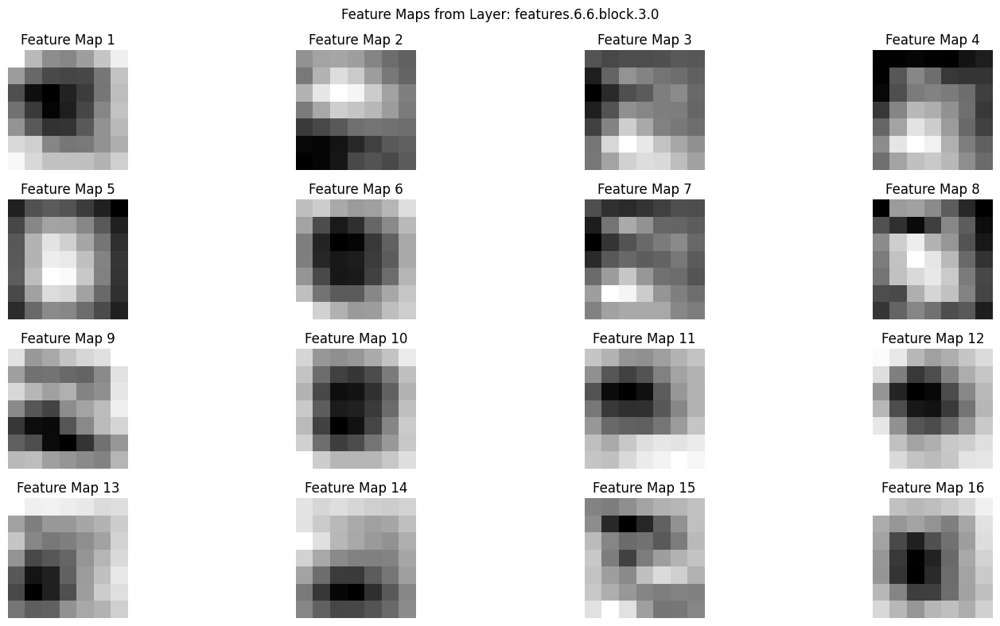

Visualizing Feature Maps for Layer: features.6.7.block.0.0, Shape: torch.Size([1632, 7, 7])


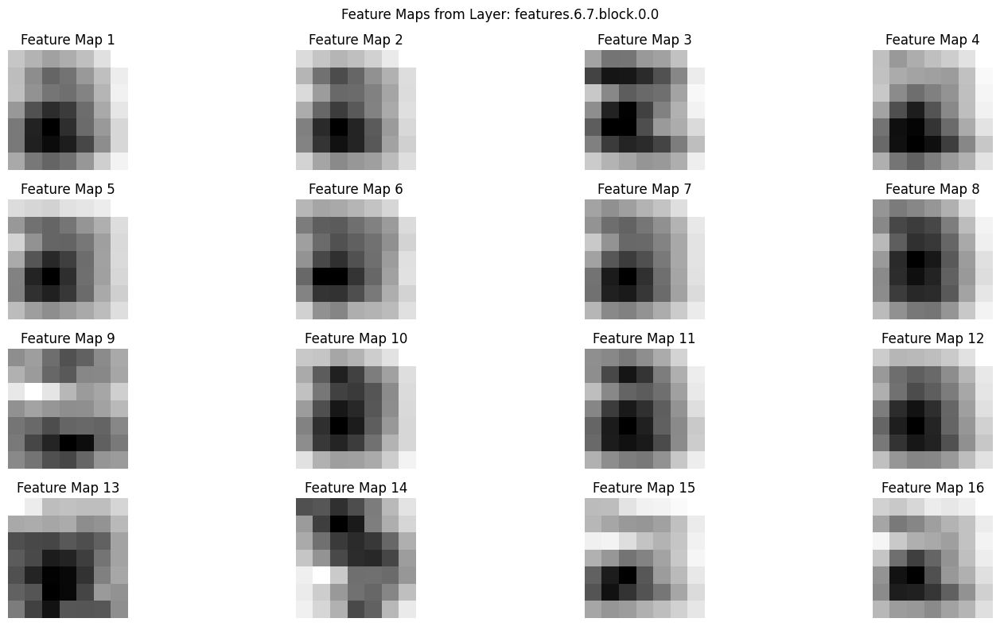

Visualizing Feature Maps for Layer: features.6.7.block.1.0, Shape: torch.Size([1632, 7, 7])


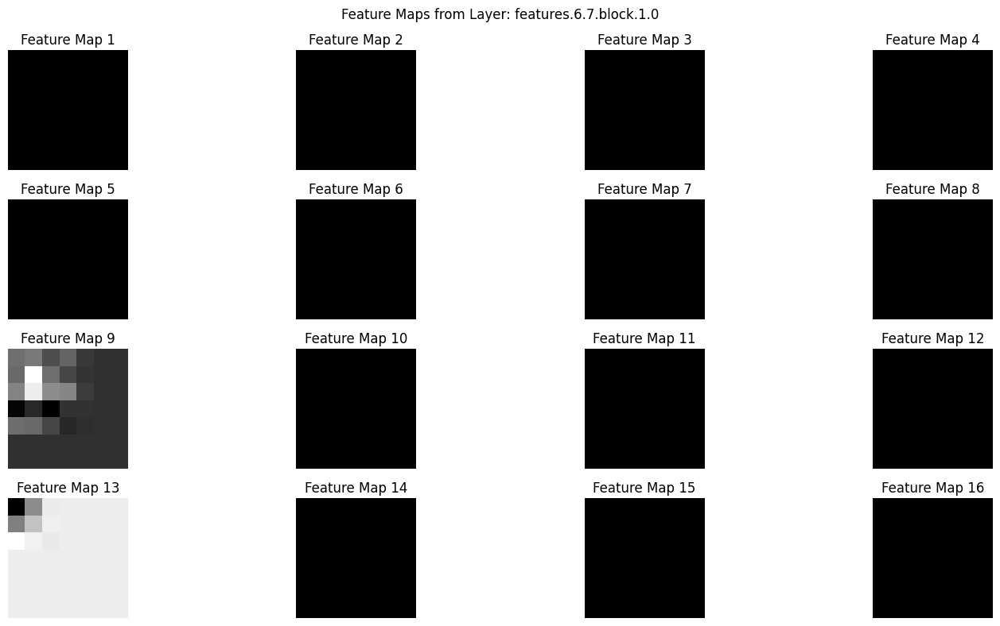

Visualizing Feature Maps for Layer: features.6.7.block.3.0, Shape: torch.Size([272, 7, 7])


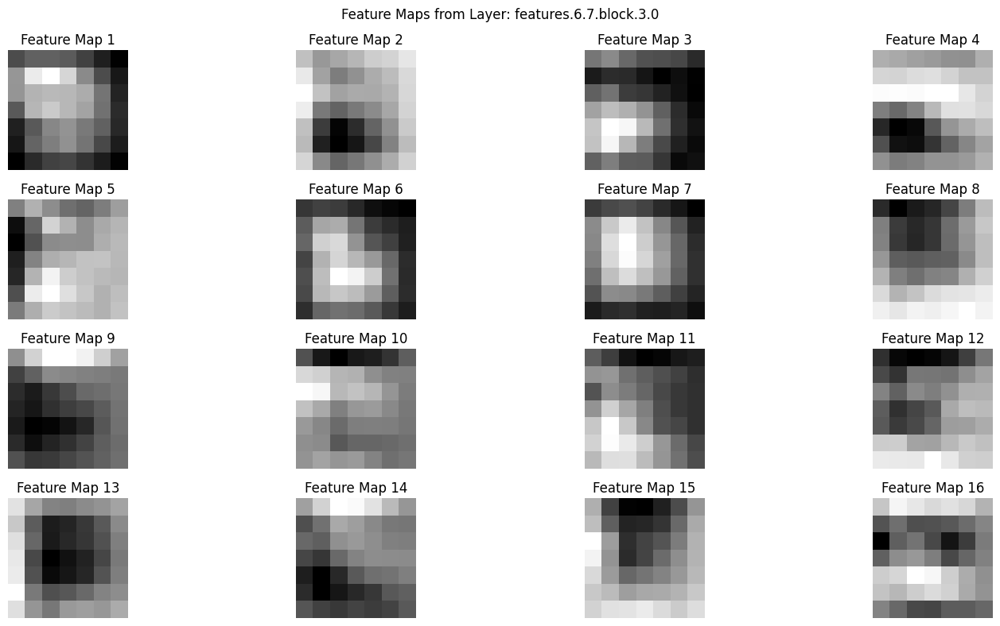

Visualizing Feature Maps for Layer: features.7.0.block.0.0, Shape: torch.Size([1632, 7, 7])


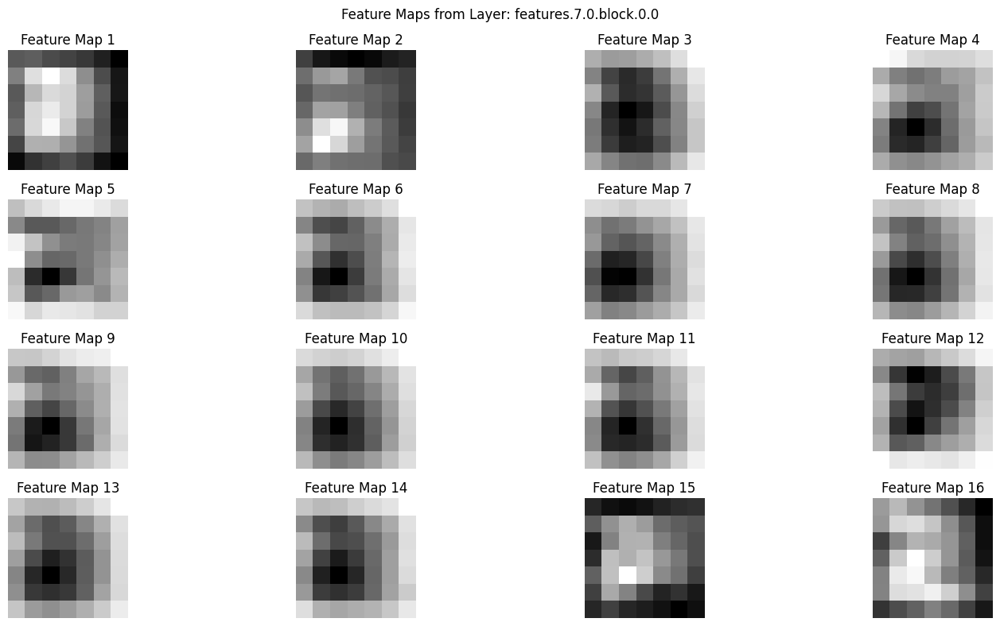

Visualizing Feature Maps for Layer: features.7.0.block.1.0, Shape: torch.Size([1632, 7, 7])


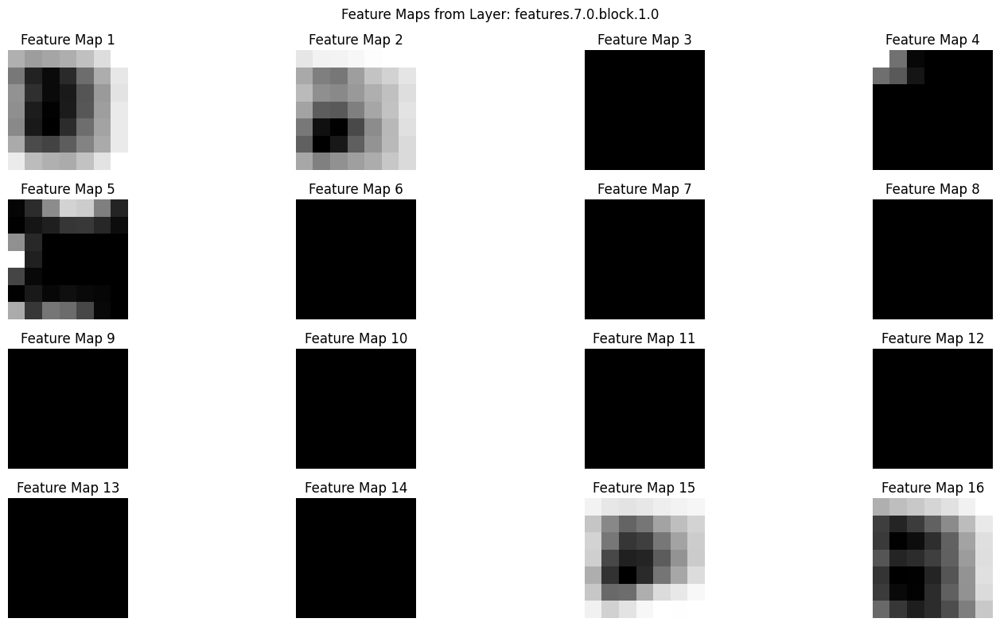

Visualizing Feature Maps for Layer: features.7.0.block.3.0, Shape: torch.Size([448, 7, 7])


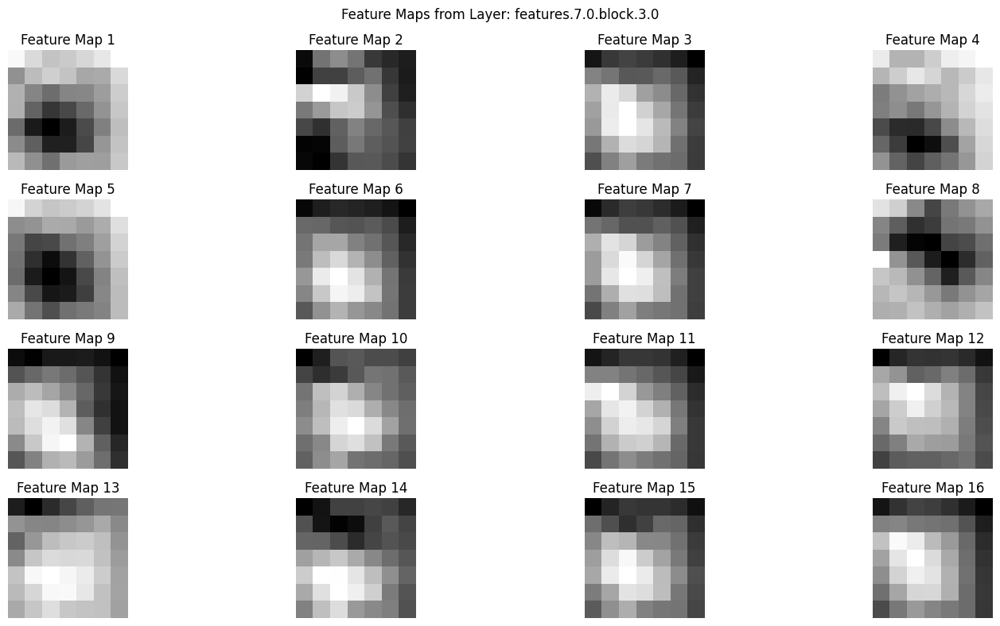

Visualizing Feature Maps for Layer: features.7.1.block.0.0, Shape: torch.Size([2688, 7, 7])


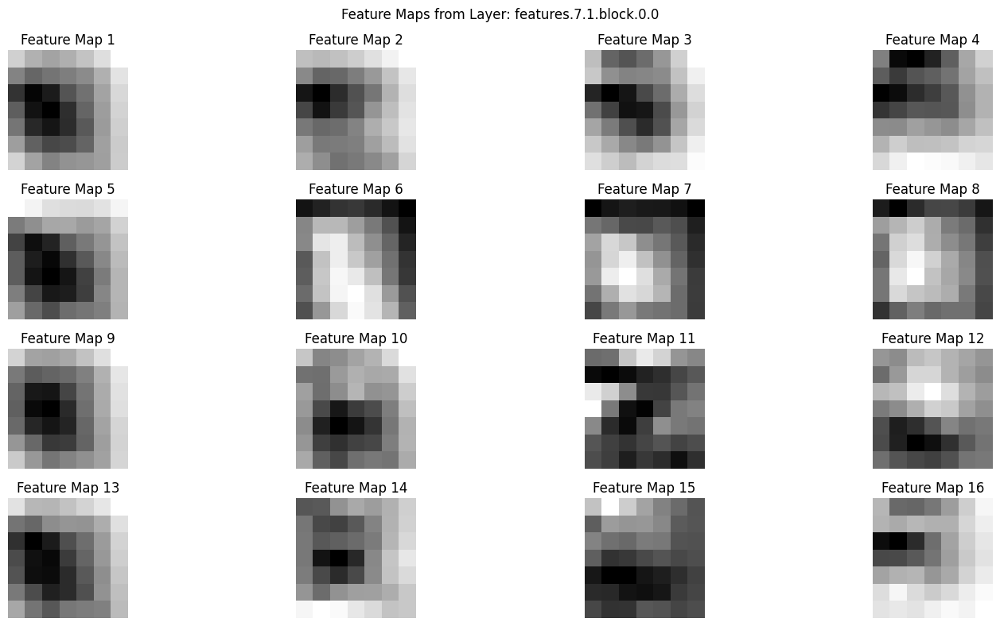

Visualizing Feature Maps for Layer: features.7.1.block.1.0, Shape: torch.Size([2688, 7, 7])


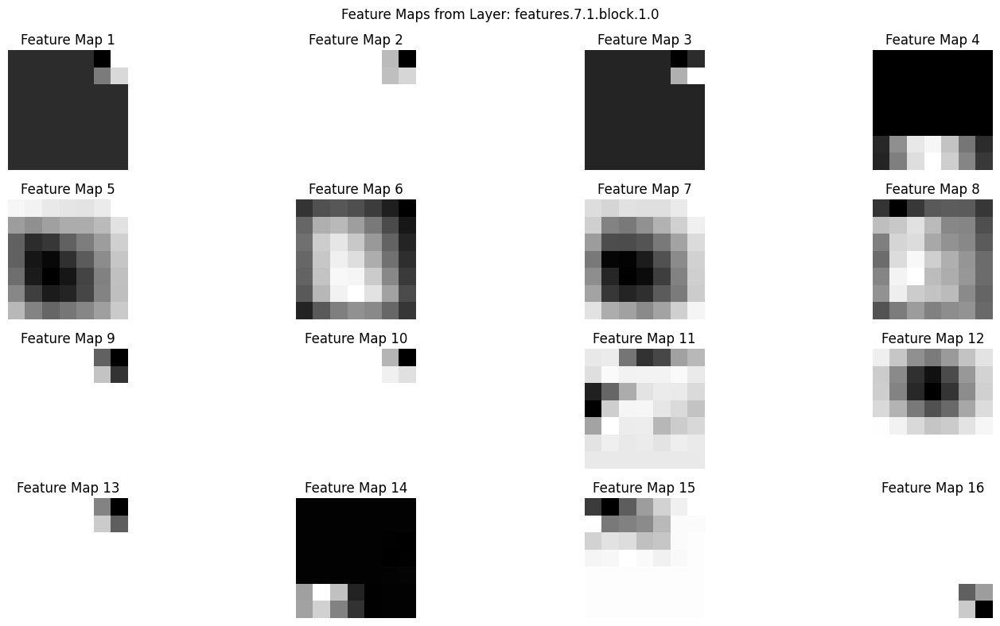

Visualizing Feature Maps for Layer: features.7.1.block.3.0, Shape: torch.Size([448, 7, 7])


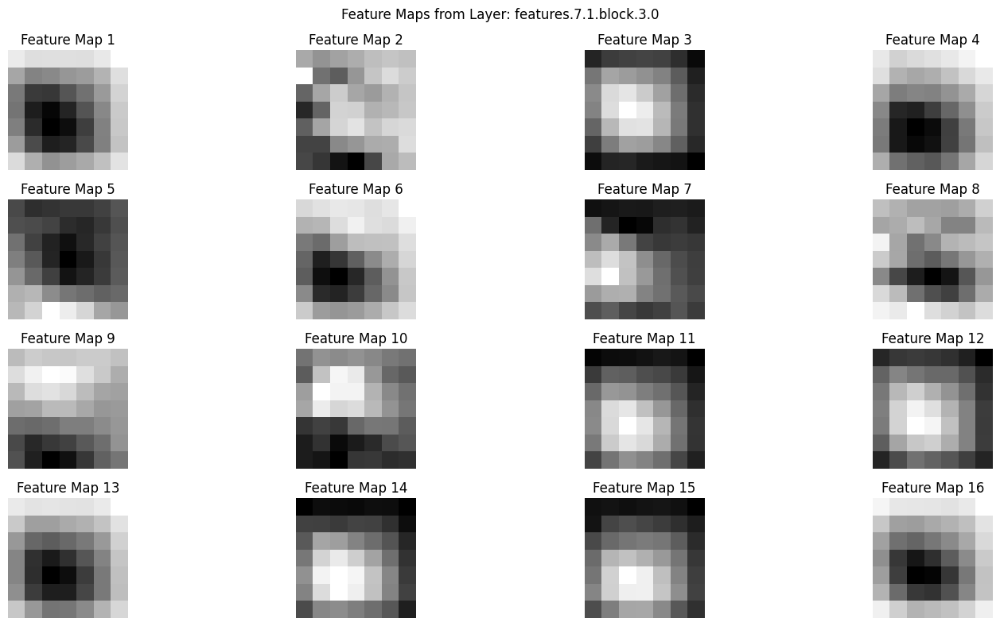

Visualizing Feature Maps for Layer: features.8.0, Shape: torch.Size([1792, 7, 7])


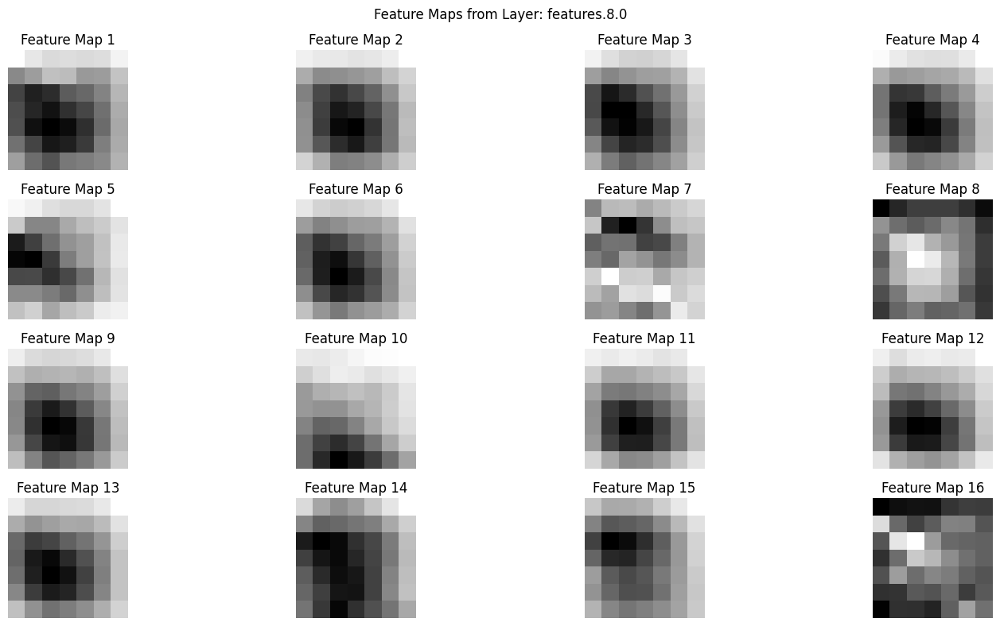

In [24]:
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

# Function to visualize feature maps layer-by-layer
def visualize_feature_maps_all_layers(model, npy_path):
    model.eval()
    activations = {}

    # Hook to capture activations for all layers
    def get_activation(name):
        def hook(model, input, output):
            activations[name] = output.detach()
        return hook

    # Register hooks for all convolutional and linear layers
    hooks = []
    for name, layer in model.named_modules():
        if isinstance(layer, torch.nn.Conv2d) or isinstance(layer, torch.nn.Linear):
            hooks.append(layer.register_forward_hook(get_activation(name)))

    # 1. Load and preprocess the .npy image
    npy_image = np.load(npy_path)  # Shape: (H, W, 3)
    npy_image_tensor = torch.tensor(npy_image, dtype=torch.float32).permute(2, 0, 1)  # (3, H, W)

    # Normalize the image
    transform = transforms.Normalize(mean=[0.0024, 0.0024, 0.0017], std=[0.0009, 0.0010, 0.0007])
    input_tensor = transform(npy_image_tensor).unsqueeze(0).to(device)  # Add batch dimension
    
    # Plot Original Image
    npy_image_display = npy_image_tensor.permute(1, 2, 0).numpy()  # Back to (H, W, 3)
    npy_image_display = (npy_image_display - npy_image_display.min()) / (npy_image_display.max() - npy_image_display.min())
    
    plt.figure(figsize=(6, 6))
    plt.imshow(npy_image_display)
    plt.title("Original Image")
    plt.axis("off")
    plt.show()

    # 2. Forward pass to generate activations
    with torch.no_grad():
        _ = model(input_tensor)

    # 3. Visualize feature maps layer-by-layer
    for name, activation in activations.items():
        activation = activation.cpu().squeeze()  # Remove batch dimension
        
        # Skip layers with 1D output (e.g., Linear layers)
        if activation.ndim != 3:
            continue
        
        print(f"Visualizing Feature Maps for Layer: {name}, Shape: {activation.shape}")
        num_feature_maps = activation.shape[0]

        # Visualize first 16 feature maps
        plt.figure(figsize=(16, 8))
        for i in range(min(16, num_feature_maps)):  # Display up to 16 feature maps
            plt.subplot(4, 4, i + 1)
            plt.imshow(activation[i], cmap="gray")
            plt.axis("off")
            plt.title(f"Feature Map {i+1}")
        plt.suptitle(f"Feature Maps from Layer: {name}")
        plt.tight_layout()
        plt.show()

    # Remove hooks after execution
    for hook in hooks:
        hook.remove()

# Example Usage
npy_image_path = "/kaggle/working/strategy1_dataset/benign/augmented_strategy1_0_0.npy"  # Replace with your .npy image path
visualize_feature_maps_all_layers(model, npy_image_path)


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


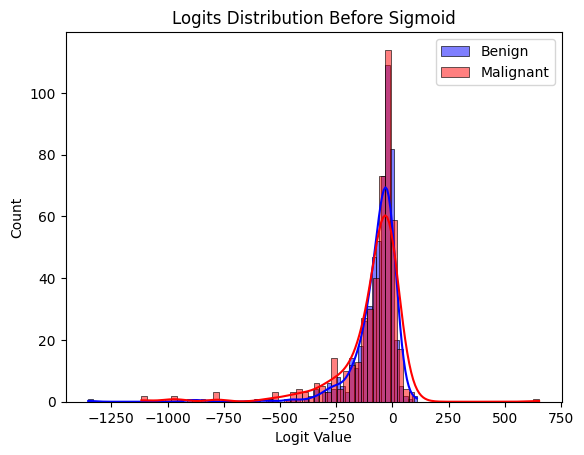

In [30]:
import seaborn as sns

# Get model outputs (logits) for test set
model.eval()
all_outputs = []
all_labels = []

with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs).cpu()
        all_outputs.append(outputs.squeeze())
        all_labels.append(labels.cpu())

all_outputs = torch.cat(all_outputs).numpy()
all_labels = torch.cat(all_labels).numpy()

# Plot the distribution of logits
sns.histplot(all_outputs[all_labels == 0], color="blue", label="Benign", kde=True)
sns.histplot(all_outputs[all_labels == 1], color="red", label="Malignant", kde=True)
plt.title("Logits Distribution Before Sigmoid")
plt.xlabel("Logit Value")
plt.legend()
plt.show()



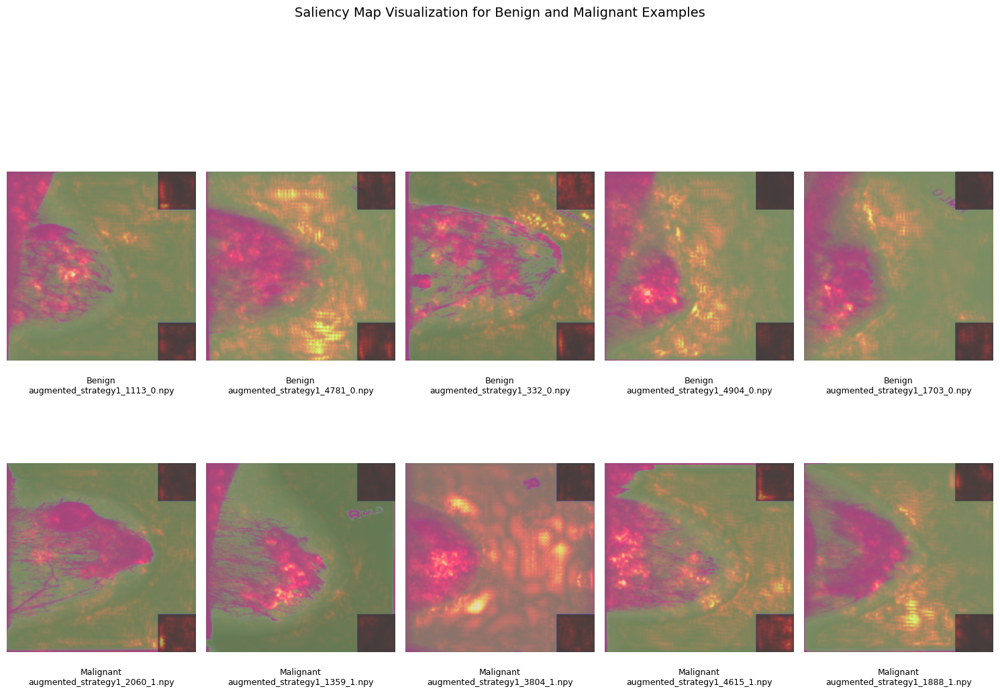

In [29]:
import numpy as np
import torch
import torch.nn.functional as F
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
import os
import random
from torchvision import transforms

# Function to generate saliency map for a single .npy image
def generate_saliency_map_npy(model, npy_path):
    model.eval()

    # Load and preprocess the .npy image
    npy_image = np.load(npy_path)  # Shape: (H, W, 3)
    npy_image = torch.tensor(npy_image, dtype=torch.float32).permute(2, 0, 1)  # (3, H, W)

    # Normalize image
    transform = transforms.Normalize(mean=[0.0024, 0.0024, 0.0017], std=[0.0009, 0.0010, 0.0007])
    input_tensor = transform(npy_image).unsqueeze(0).to(device).requires_grad_()

    # Forward pass and compute gradients
    output = model(input_tensor)  # Shape: (1, 1)
    score = output[0]  # Logit for class 1
    model.zero_grad()
    score.backward()

    # Get saliency map
    saliency, _ = torch.max(input_tensor.grad.data.abs(), dim=1)
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize saliency map
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    saliency_smoothed = gaussian_filter(saliency, sigma=1)  # Apply Gaussian smoothing

    # Prepare original image for visualization
    npy_image_np = npy_image.permute(1, 2, 0).cpu().numpy()
    npy_image_np = (npy_image_np - npy_image_np.min()) / (npy_image_np.max() - npy_image_np.min())

    return npy_image_np, saliency_smoothed

# Function to plot saliency maps for multiple examples
def plot_saliency_maps(model, benign_dir, malignant_dir):
    benign_images = random.sample(os.listdir(benign_dir), 5)
    malignant_images = random.sample(os.listdir(malignant_dir), 5)

    plt.figure(figsize=(15, 12))

    # Process benign examples
    for i, img_name in enumerate(benign_images):
        npy_path = os.path.join(benign_dir, img_name)
        original, saliency = generate_saliency_map_npy(model, npy_path)

        plt.subplot(2, 5, i + 1)
        plt.imshow(original, alpha=0.6)  # Original image
        plt.imshow(saliency, cmap="hot", alpha=0.4)  # Saliency overlay
        plt.axis("off")
        plt.title(f"Benign\n{img_name}", fontsize=9, y=-0.2)

    # Process malignant examples
    for i, img_name in enumerate(malignant_images):
        npy_path = os.path.join(malignant_dir, img_name)
        original, saliency = generate_saliency_map_npy(model, npy_path)

        plt.subplot(2, 5, i + 6)
        plt.imshow(original, alpha=0.6)  # Original image
        plt.imshow(saliency, cmap="hot", alpha=0.4)  # Saliency overlay
        plt.axis("off")
        plt.title(f"Malignant\n{img_name}", fontsize=9, y=-0.2)

    plt.suptitle("Saliency Map Visualization for Benign and Malignant Examples", fontsize=14)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Example Usage
benign_dir = "/kaggle/working/strategy1_dataset/benign"
malignant_dir = "/kaggle/working/strategy1_dataset/malignant"
plot_saliency_maps(model, benign_dir, malignant_dir) # It directly plot the saliency map overlapped on the original img to show critic points
